# Evaluating your SAE

Code based off Rob Graham's ([themachinefan](https://github.com/themachinefan)) SAE evaluation code.

In [1]:
import os
os.getcwd()

'/workspace/ViT-Prisma/src/vit_prisma/sae/evals'

In [2]:
import einops
import torch
import torchvision

import plotly.express as px

from tqdm import tqdm

import numpy as np
import os
import requests

# Setup

In [3]:
from dataclasses import dataclass
from vit_prisma.sae.config import VisionModelSAERunnerConfig


# sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-11-hook_resid_post-l1-0.0001
# sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-10-hook_mlp_out-l1-0.0001
# sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-0-hook_mlp_out-l1-0.0001
# sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-0-hook_resid_post-l1-0.0001
# !! Change hook point - it is *not* changed automatically
# sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-11-hook_resid_post-l1-0.0001/n_images_2600058.pt
selected_sae_weights = "sae-top_k-64-cls_only-layer_11-hook_resid_post/weights.pt"


@dataclass
class EvalConfig(VisionModelSAERunnerConfig):
    sae_path: str = f'/workspace/sae_checkpoints/{selected_sae_weights}'
    model_name: str = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
    model_type: str =  "clip"
    patch_size: str = 32

    dataset_path = "/workspace"
    dataset_train_path: str = "/workspace/ILSVRC/Data/CLS-LOC/train"
    dataset_val_path: str = "/workspace/ILSVRC/Data/CLS-LOC/val"

    verbose: bool = True

    device: bool = 'cuda'

    eval_max: int = 50_000 # 50_000
    batch_size: int = 32
        
#     hook_point_layer: int = 11
    # make the max image output folder a subfolder of the sae path


    @property
    def max_image_output_folder(self) -> str:
        # Get the base directory of sae_checkpoints
        sae_base_dir = os.path.dirname(os.path.dirname(self.sae_path))
        
        # Get the name of the original SAE checkpoint folder
        sae_folder_name = os.path.basename(os.path.dirname(self.sae_path))
        
        # Create a new folder path in sae_checkpoints/images with the original name
        output_folder = os.path.join(sae_base_dir, 'max_images', sae_folder_name)
        output_folder = os.path.join(output_folder, f"layer_{self.hook_point_layer}") # Add layer number

        
        # Ensure the directory exists
        os.makedirs(output_folder, exist_ok=True)
        
        return output_folder

cfg = EvalConfig()

n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 15869
Expansion factor: 16
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder


In [4]:
torch.set_grad_enabled(False)

## Load model

In [5]:
from vit_prisma.models.base_vit import HookedViT

model_name = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
model = HookedViT.from_pretrained(model_name, is_timm=False, is_clip=True).to(cfg.device)
 

model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Official model name open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Converting OpenCLIP weights
model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
visual projection shape torch.Size([768, 512])
Setting center_writing_weights to False for OpenCLIP
Setting fold_ln to False for OpenCLIP
Loaded pretrained model open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K into HookedTransformer


## Load datasets

In [6]:
import importlib
import vit_prisma
# importlib.reload(vit_prisma.dataloaders.imagenet_dataset)

In [7]:
# load dataset
import open_clip
from vit_prisma.utils.data_utils.imagenet_utils import setup_imagenet_paths
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_transforms_clip, ImageNetValidationDataset

from torchvision import transforms
from transformers import CLIPProcessor

og_model_name = "hf-hub:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
og_model, _, preproc = open_clip.create_model_and_transforms(og_model_name)
processor = preproc

size=224

data_transforms = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                     std=[0.26862954, 0.26130258, 0.27577711]),
])
    
imagenet_paths = setup_imagenet_paths(cfg.dataset_path)
imagenet_paths["train"] = "/workspace/ILSVRC/Data/CLS-LOC/train"
imagenet_paths["val"] = "/workspace/ILSVRC/Data/CLS-LOC/val"
imagenet_paths["val_labels"] = "/workspace/LOC_val_solution.csv"
imagenet_paths["label_strings"] = "/workspace/LOC_synset_mapping.txt"
print()
train_data = torchvision.datasets.ImageFolder(cfg.dataset_train_path, transform=data_transforms)
val_data = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'], 
                                data_transforms,
                                return_index=True,
)
val_data_visualize = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'],
                                torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),]), return_index=True)

print(f"Validation data length: {len(val_data)}") if cfg.verbose else None



Validation data length: 50000


In [8]:
from vit_prisma.sae.training.activations_store import VisionActivationsStore
# import dataloader
from torch.utils.data import DataLoader

# activations_loader = VisionActivationsStore(cfg, model, train_data, eval_dataset=val_data)
val_dataloader = DataLoader(val_data, batch_size=cfg.batch_size, shuffle=False, num_workers=4)


## Load pretrained SAE to evaluate

In [9]:
from vit_prisma.sae.sae import SparseAutoencoder
sparse_autoencoder = SparseAutoencoder(cfg).load_from_pretrained(f"/workspace/sae_checkpoints/{selected_sae_weights}")
sparse_autoencoder.to(cfg.device)
sparse_autoencoder.eval()  # prevents error if we're expecting a dead neuron mask for who 

# topk config needs editing for this to work

get_activation_fn received: activation_fn=relu, kwargs={}
n_tokens_per_buffer (millions): 0.00064
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 650000000
Total wandb updates: 1586
Expansion factor: 64
n_tokens_per_feature_sampling_window (millions): 4.096
n_tokens_per_dead_feature_window (millions): 20.48
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder
get_activation_fn received: activation_fn=topk, kwargs={'k': 64}


SparseAutoencoder(
  (hook_sae_in): HookPoint()
  (hook_hidden_pre): HookPoint()
  (hook_hidden_post): HookPoint()
  (hook_sae_out): HookPoint()
  (activation_fn): TopK(
    (postact_fn): ReLU()
  )
)

## Clip Labeling AutoInterp

In [10]:
# all_imagenet_class_names

In [11]:
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_index_to_name
ind_to_name = get_imagenet_index_to_name()

all_imagenet_class_names = []
for i in range(len(ind_to_name)):
    all_imagenet_class_names.append(ind_to_name[str(i)][1])

In [12]:
cfg.max_image_output_folder

'/workspace/sae_checkpoints/max_images/sae-top_k-64-cls_only-layer_11-hook_resid_post/layer_9'

## Feature steering

In [13]:
# Are these missing ReLU?
# A: No, relu is in encode_* which is run as part of normal sae forward.
# topk runs as usual
def steering_hook_fn_cls_only(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    sae.to(activations.device)


    sae_input = activations.clone()
    sae_output, feature_activations, *data = sae(sae_input)
    
    steered_feature_activations = feature_activations.clone()
    
    # batch, stream, feats
    # cls token is *last* in sequence
    steered_feature_activations[:, 0, steering_indices] = steering_strength

    steered_sae_out = einops.einsum(
                steered_feature_activations,
                sae.W_dec,
                "... d_sae, d_sae d_in -> ... d_in",
            ) + sae.b_dec

    steered_sae_out = sae.run_time_activation_norm_fn_out(steered_sae_out)
    
    # print(f"steering norm: {(steered_sae_out - sae_output).norm()}")
#     print(f"L0 norm of feats: {torch.norm(feature_activations, p=0.0)}")
#     print(f"torch.where(feature_activations < 0, 1, 0).sum(): {torch.where(feature_activations < 0, 1, 0).sum()}")
    

    if include_error:
        error = sae_input - sae_output
        # print(f"error.norm(): {error.norm()}")
        return steered_sae_out + error
    return steered_sae_out


def steering_hook_fn(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    sae.to(activations.device)


    sae_input = activations.clone()
    sae_output, feature_activations, *data = sae(sae_input)
    
    steered_feature_activations = feature_activations.clone()
    
    steered_feature_activations[:, :, steering_indices] = steering_strength

    steered_sae_out = einops.einsum(
                steered_feature_activations,
                sae.W_dec,
                "... d_sae, d_sae d_in -> ... d_in",
            ) + sae.b_dec

    steered_sae_out = sae.run_time_activation_norm_fn_out(steered_sae_out)
    
    # print(f"steering norm: {(steered_sae_out - sae_output).norm()}")
    
    

    if include_error:
        error = sae_input - sae_output
        # print(f"error.norm(): {error.norm()}")
        return steered_sae_out + error
    return steered_sae_out

In [14]:
random_feat_idxs = np.random.randint(0, high=sparse_autoencoder.b_enc.shape[0], size=(1))
# random_feat_idxs[0] = 655
# random_feat_idxs[1] = 656
# random_feat_idxs[2] = 665
# random_feat_idxs[3] = 2541

In [15]:
# for a given feature, set it high/low on maxim activ. imgs and high/low on non-activ images
# hook SAE and replace desired feature with 0 or 1 
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

from functools import partial

@torch.no_grad()
def compute_feature_activations_set_feat(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10,
    steering_strength: float = 10.0
):
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    
    
    # "blocks.11.hook_resid_post"
    # "blocks.0.hook_mlp_out"
    # "blocks.10.hook_mlp_out"
    hook_point_local = "blocks.11.hook_resid_post"
        
    
    recons_image_embeddings_feat_altered_list = []
    for idx in np.array(range(sparse_autoencoder.W_dec.shape[0]))[random_feat_idxs]:
        # steering_hook_fn, steering_hook_fn_cls_only
        steering_hook = partial(
            steering_hook_fn,
            cfg=cfg,
            sae=sparse_autoencoder,
            steering_indices=[idx],
            steering_strength=steering_strength,
            mean_ablation_values = [1.0],
            include_error=True,
            )
        
        
        recons_image_embeddings_feat_altered = model.run_with_hooks(
            images,
            fwd_hooks=[(hook_point_local, steering_hook)],
        )
        recons_image_embeddings_feat_altered_list.append(recons_image_embeddings_feat_altered)

    
    # output is in clip embedding space
    recons_image_embeddings_default = model.run_with_hooks(
        images,
        fwd_hooks=[(hook_point_local, lambda x, hook: x)],
    )
    
#     print(f"recons_image_embeddings_default: {recons_image_embeddings_default}")
#     print(f"recons_image_embeddings_default.shape: {recons_image_embeddings_default.shape}")
#     print(f"recons_image_embeddings_default: {recons_image_embeddings_default.shape}")

#     print(f"recons_image_embeddings_feat_altered: {recons_image_embeddings_feat_altered}")
#     print(f"recons_image_embeddings_feat_altered.shape: {recons_image_embeddings_feat_altered.shape}")

    return recons_image_embeddings_feat_altered_list, recons_image_embeddings_default

In [17]:
start = 0
end = 100
num_elements = (end - start) // 5 + 1  # Calculate the number of elements

result = np.linspace(start, end, num_elements)

array([  0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,  45.,  50.,
        55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100.])

In [ ]:
import torch
from PIL import Image

from collections import defaultdict
max_samples = cfg.eval_max

encoder_biases = sparse_autoencoder.b_enc#[interesting_features_indices]
encoder_weights = sparse_autoencoder.W_enc#[:, interesting_features_indices]

steering_strengths = result#[0.0, 5.0, 10.0, 50.0, 150.0]#, 500.0, 1000.0, 2000.0, 5000.0, 10000.0]#, -200.0, -300.0]
# steering_strengths = [0.0, 5.0, 10.0, 20.0, 50.0, 150.0]#, 300.0]#, 500.0, 1000.0, 2000.0, 5000.0, 10000.0]#, -200.0, -300.0]


# these two things need to be pickled and documented well
# they cache run results
steering_strength_image_results = defaultdict(dict)
steering_strength_info = {}

feat_text_probs_altered = defaultdict(dict)


og_model.cuda()




for steering_strength in steering_strengths:
    print(f"{'==============' * 2} steering_strength: {steering_strength} {'==============' * 2}")
    # ===== Get Steered and Default CLIP Outputs =====
    top_k=10
    processed_samples = 0
    default_embeds_list = []
    feature_steered_embeds = defaultdict(list)
    l = 0
    
    # remove tqdm
    for batch_images, _, batch_indices in val_dataloader:
        batch_images = batch_images.to(cfg.device)
        batch_indices = batch_indices.to(cfg.device)
        batch_size = batch_images.shape[0]

        altered_embeds_list, default_embeds = compute_feature_activations_set_feat(
            batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
            None, None, top_k, steering_strength
        )
        default_embeds_list.append(default_embeds)
        for j, altered_embeds in enumerate(altered_embeds_list):
            feature_steered_embeds[random_feat_idxs[j]].extend(altered_embeds)
        # either label embeds or optimize to maximal token in text transformer embedding face
        l += 1
        if l >= 5:
            break    
    default_embeds = torch.cat(default_embeds_list)
    
    with open("/workspace/clip_dissect_raw.txt", "r") as f:
        larger_vocab = [line[:-1] for line in f.readlines()][:5000]


    # ===== CLIP Embeds =====
    # use clip vocab here and compare embeds
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    text = tokenizer(larger_vocab)
    text_features = og_model.encode_text(text.cuda())
    text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True)


    print(f"text_features_normed.shape: {text_features_normed.shape}")
    text_probs_altered_list = []
    with torch.no_grad(), torch.cuda.amp.autocast():
        for key in feature_steered_embeds:
            print(key)
            # embeds already have L2 norm of 1
            text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
            text_probs_altered_list.append(text_probs_altered)
            feat_text_probs_altered[key][steering_strength] = text_probs_altered
        text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)
    
    

============================ steering_strength: 0.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 5.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 10.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 15.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 20.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 25.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
============================ steering_strength: 30.0 ============================
text_features_normed.shape: torch.Size([5000, 512])
16999
======================

In [ ]:
keyslist = list(feat_text_probs_altered.keys())
for i in range(1, len(keyslist)):
    print(keyslist[i], keyslist[i-1])
    print(feat_text_probs_altered[keyslist[i], keyslist[i-1])

In [35]:
text_probs_altered_list[0]

torch.Size([160, 5000])

In [17]:
steering_strength_image_results.keys(), steering_strength_image_results[str(steering_strength)].keys()

(dict_keys(['0.0', '5.0', '10.0', '20.0', '50.0', '150.0']),
 dict_keys([7929, 13773, 47712, 31664, 32193, 4536, 25597, 41658, 39726, 16484, 35053, 35942, 4454, 6475, 16805, 41271, 10166, 16697, 26791, 4088, 48358, 36957, 8607, 42989, 44465, 5198, 1903, 18126, 44731, 11920, 24392, 19347, 32323, 28593, 4941, 28934, 1396, 25759, 4494, 26864, 28353, 32367, 45505, 15990, 1327, 30097, 45887, 13354, 48373, 31196, 23520, 39261, 39073, 34971, 9089, 11805, 27216, 10312, 11512, 37889, 24506, 2602, 42146, 30540, 5371, 41963, 39554, 29999, 11390, 3206, 34898, 17733, 33044, 43427, 708, 5765, 13427, 21777, 39870, 47431, 19044, 5669, 15623, 21200, 29812, 20729, 43279, 37272, 40191, 14422, 24963, 3951, 36277, 33753, 10971, 27152, 9240, 19197, 41072, 35311]))

In [18]:
i = 0

# 0: python, 3: bowl, 4: bed, 6: guinea
image_idx = 0


feat_num = list(steering_strength_image_results[str(steering_strength)].keys())[-2]

# to iterate over many features:
# for feat_num in steering_strength_image_results[str(steering_strength)].keys():

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_prob_arr = []
for dict_key in steering_strengths:
    # image, tuple position, idx of top-k
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
#     print(str(dict_key), steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0])
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))
#     print(str(dict_key), steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item())


feat_num: 41072


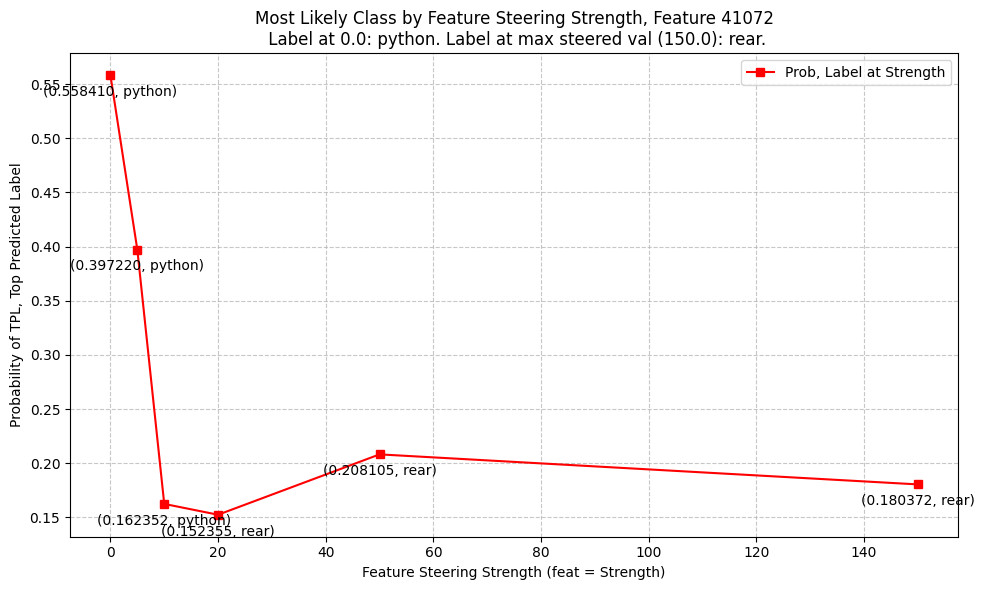

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

feat_num: 41072


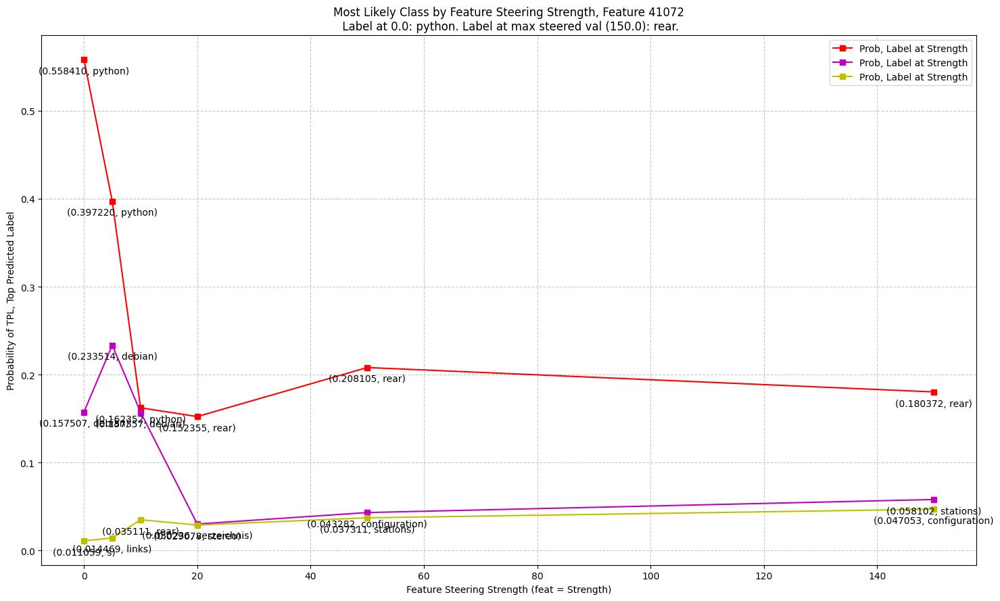

In [20]:
# top-k logits chart
# i = 10
# 0: python, 3: bowl, 4: bed, 6: guinea
image_idx = image_idx
feat_num = feat_num

# to iterate over many features:
# for feat_num in steering_strength_image_results[str(steering_strength)].keys():

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_concept_arr_2 = []
feat_num_concept_arr_3 = []
feat_num_prob_arr = []
feat_num_prob_arr_2 = []
feat_num_prob_arr_3 = []
for dict_key in steering_strengths:
    # image, tuple position, idx of top-k
    # modify this to do top-k at some point
#     print(str(dict_key), steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0])
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
    feat_num_concept_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][1]))
    feat_num_concept_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][2]))
#     print(str(dict_key), steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item())
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))
    feat_num_prob_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][1].item()))
    feat_num_prob_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][2].item()))


# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
y1_2 = [tup[1] for tup in sorted(feat_num_concept_arr_2)]
y2_2 = [tup[1] for tup in sorted(feat_num_prob_arr_2)]
y1_3 = [tup[1] for tup in sorted(feat_num_concept_arr_3)]
y2_3 = [tup[1] for tup in sorted(feat_num_prob_arr_3)]

# Create the plot
plt.figure(figsize=(15, 9))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_2, 'ms-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_3, 'ys-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_2[i]:01f}, {y1_2[i]})', 
                (x[i], y2_2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_3[i]:01f}, {y1_3[i]})', 
                (x[i], y2_3[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

In [21]:
steering_strength_info.keys()

dict_keys([0.0, 5.0, 10.0, 20.0, 50.0, 150.0])

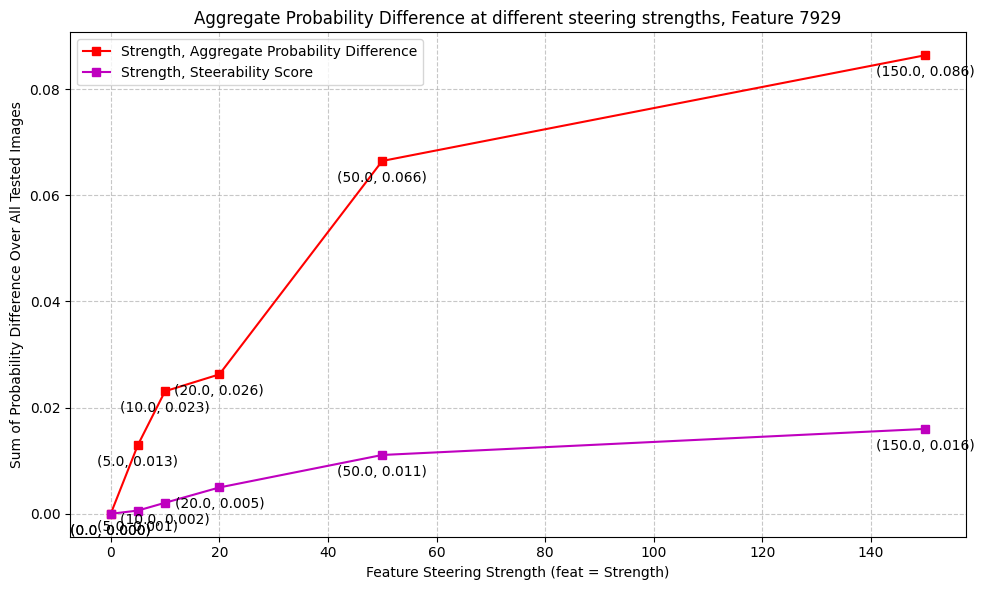

7929
150.0 ['dates' 'plates' 'parents' 'date' 'bars' 'table' 'pair' 'periods' 'posts'
 'roll']
150.0 probs tensor([0.0977, 0.0451, 0.0310, 0.0239, 0.0177, 0.0175, 0.0162, 0.0149, 0.0144,
        0.0134], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0075, 0.0021, 0.0010, 0.0005, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['dates' 'plates' 'parents' 'date' 'bars' 'table' 'periods' 'posts' 'has'
 'roll']


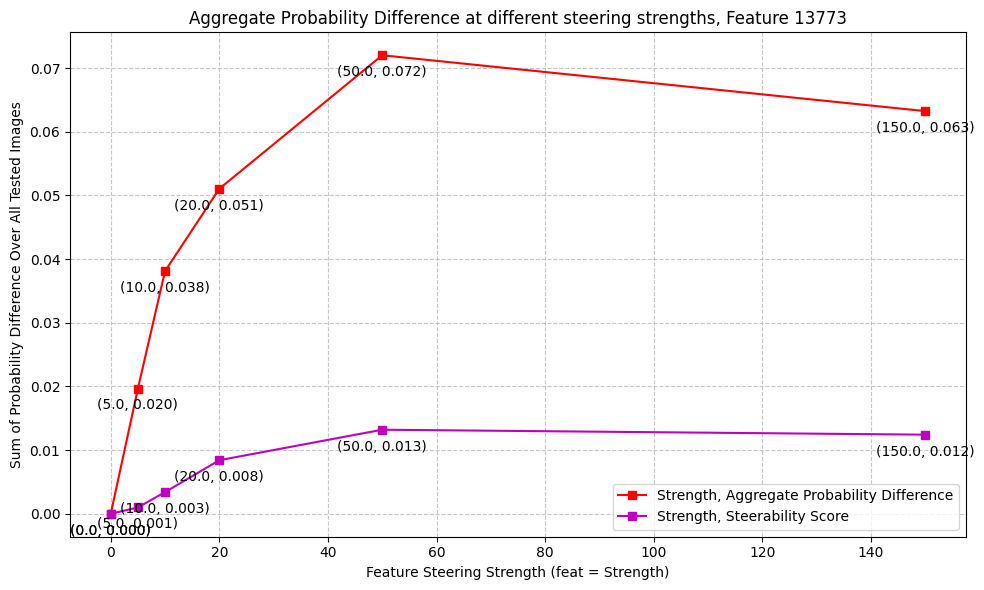

13773
150.0 ['python' 'r' 'ups' 'rs' 'ray' 'oldest' 'ross' 'b' 'got' 'bugs']
150.0 probs tensor([0.1687, 0.0552, 0.0251, 0.0249, 0.0205, 0.0164, 0.0130, 0.0116, 0.0100,
        0.0097], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0040, 0.0022, 0.0009, 0.0006, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['python' 'r' 'ups' 'rs' 'oldest' 'ross' 'ray' 'taylor' 'b' 'got']


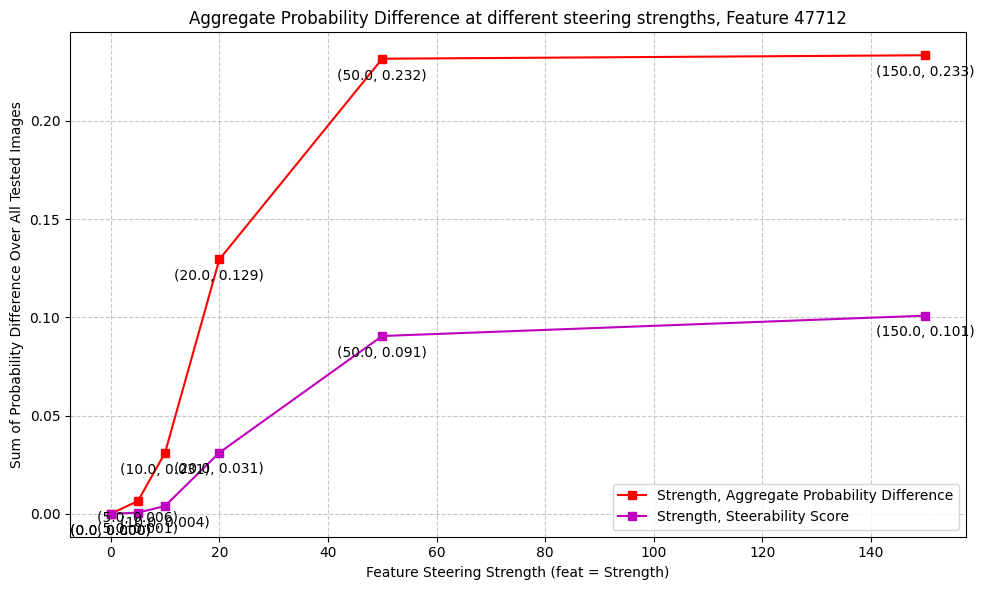

47712
150.0 ['alaska' 'vancouver' 'alberta' 'switzerland' 'nz' 'canada' 'supplier'
 'programmes' 'canadian' 'seattle']
150.0 probs tensor([0.2587, 0.1557, 0.0713, 0.0582, 0.0505, 0.0319, 0.0231, 0.0230, 0.0228,
        0.0149], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0545, 0.0296, 0.0043, 0.0038, 0.0015, 0.0010, 0.0009, 0.0008, 0.0006,
        0.0003])
['alaska' 'vancouver' 'switzerland' 'alberta' 'nz' 'canada' 'programmes'
 'supplier' 'canadian' 'seattle']


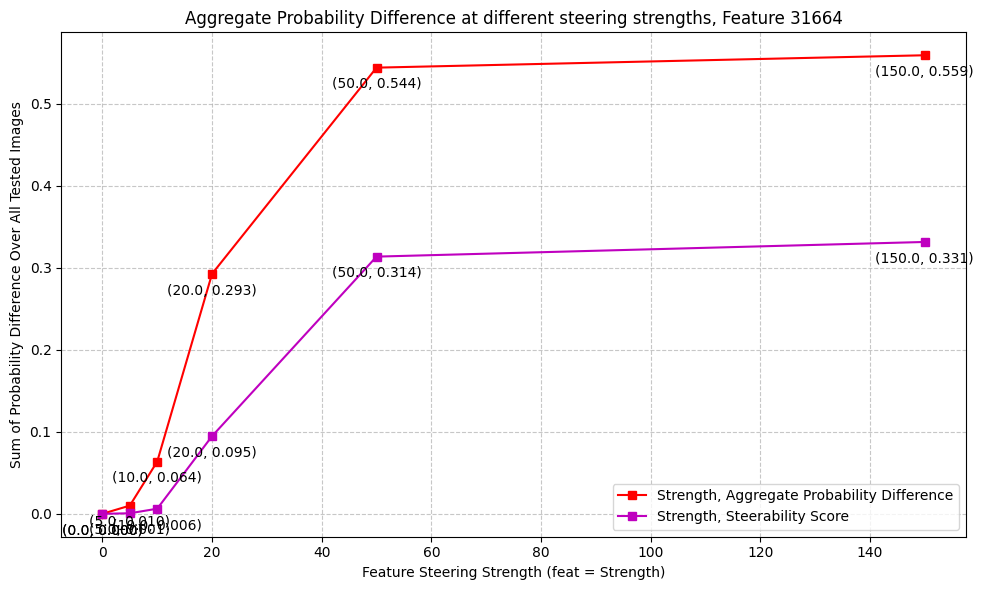

31664
150.0 ['apache' 'lift' 'remote' 'vehicle' 'rescue' 'johnny' 'ski' 'aviation'
 'air' 'aircraft']
150.0 probs tensor([0.5828, 0.0846, 0.0347, 0.0281, 0.0233, 0.0211, 0.0158, 0.0139, 0.0136,
        0.0103], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.1247e-01, 1.3099e-02, 9.6308e-04, 4.6372e-04, 4.0581e-04, 4.0331e-04,
        2.0361e-04, 1.8572e-04, 1.7627e-04, 1.6079e-04])
['apache' 'lift' 'remote' 'rescue' 'johnny' 'vehicle' 'aviation' 'air'
 'ski' 'aircraft']


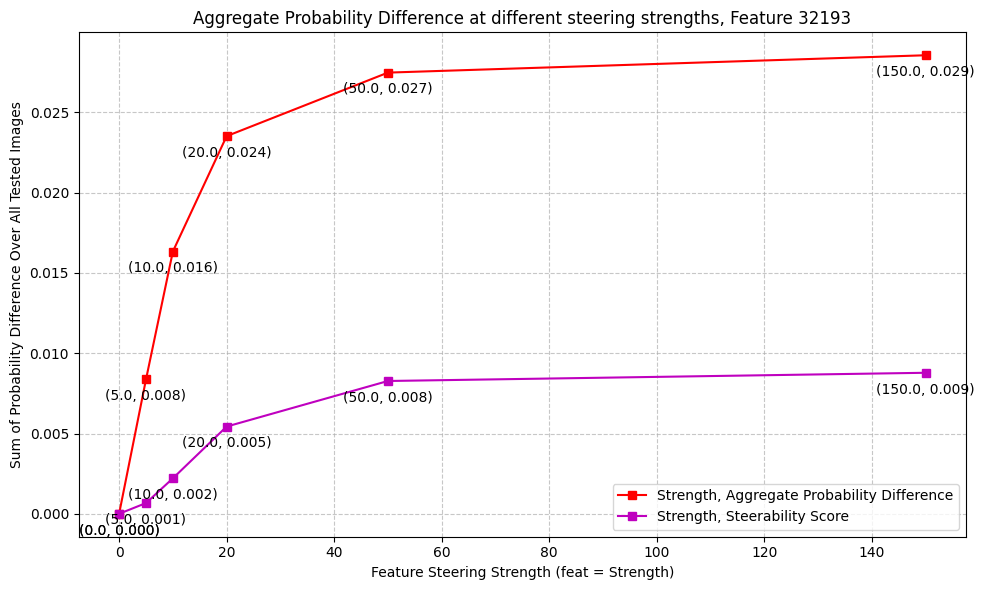

32193
150.0 ['louisiana' 'gulf' 'gps' 'vary' 'portable' 'estate' 'pour' 'coastal'
 'mill' 'hotels']
150.0 probs tensor([0.0301, 0.0289, 0.0263, 0.0215, 0.0205, 0.0200, 0.0166, 0.0157, 0.0147,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0008, 0.0006, 0.0006, 0.0005, 0.0004, 0.0004, 0.0004, 0.0003, 0.0002,
        0.0002])
['gps' 'louisiana' 'vary' 'estate' 'gulf' 'mill' 'portable' 'pour'
 'hotels' 'arcade']


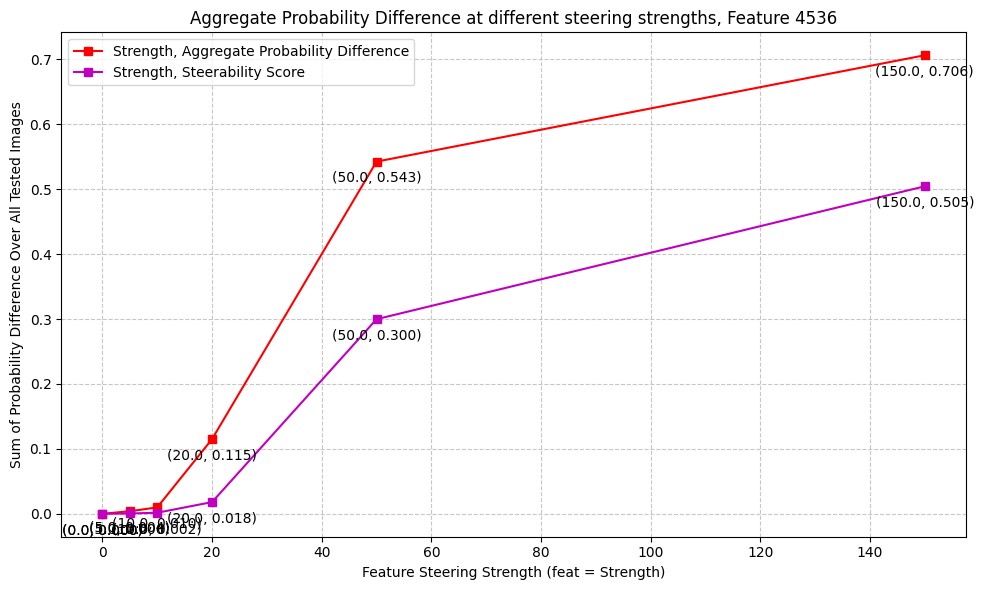

4536
150.0 ['labels' 'label' 'printable' 'tape' 'printed' 'bands' 'printers' 'cds'
 'printer' 'rings']
150.0 probs tensor([0.6824, 0.0382, 0.0258, 0.0164, 0.0127, 0.0079, 0.0076, 0.0073, 0.0036,
        0.0036], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.9908e-01, 1.5846e-03, 6.8003e-04, 1.2142e-04, 1.0505e-04, 4.1022e-05,
        3.3141e-05, 2.1074e-05, 1.2342e-05, 9.8094e-06])
['labels' 'label' 'printable' 'printed' 'tape' 'printers' 'cds' 'bands'
 'tabs' 'printer']


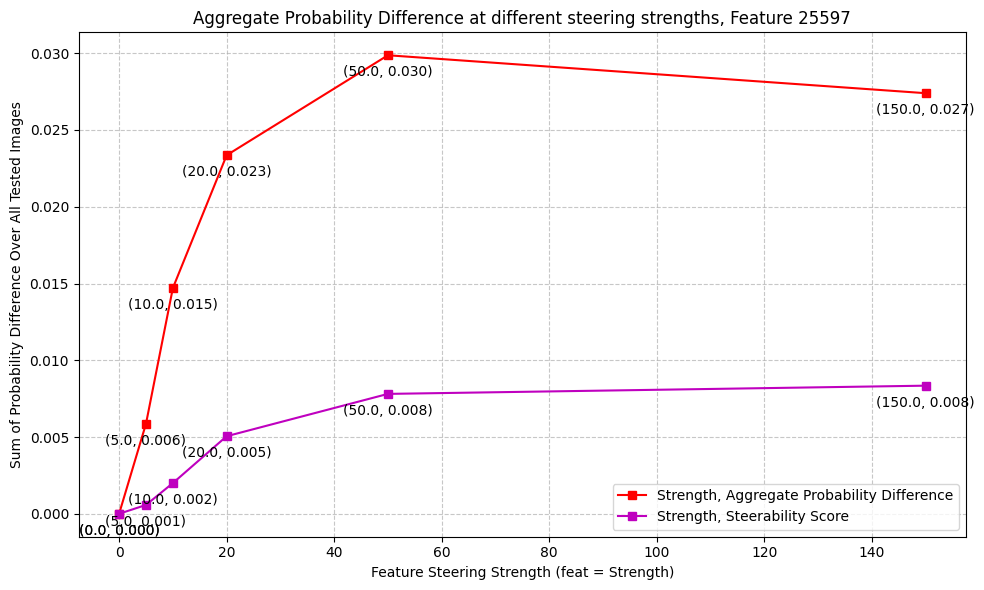

25597
150.0 ['numerous' 'bell' 'taken' 'named' 'data' 'lock' 'unix' 'cart' 'wikipedia'
 'sizes']
150.0 probs tensor([0.0255, 0.0238, 0.0236, 0.0222, 0.0200, 0.0190, 0.0188, 0.0159, 0.0156,
        0.0129], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0008, 0.0007, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['data' 'bell' 'numerous' 'taken' 'named' 'wikipedia' 'cart' 'lock'
 'sizes' 'unix']


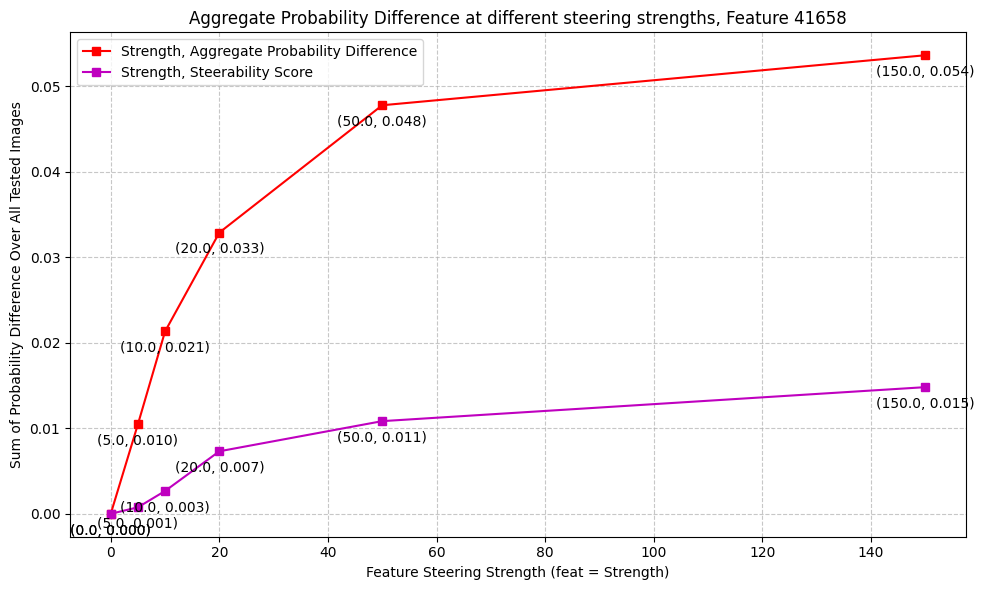

41658
150.0 ['certification' 'certificates' 'buffalo' 'certificate' 'cyprus' 'apache'
 'sub' 'eagle' 'conservation' 'tripadvisor']
150.0 probs tensor([0.0526, 0.0518, 0.0446, 0.0436, 0.0279, 0.0241, 0.0221, 0.0206, 0.0173,
        0.0171], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0029, 0.0022, 0.0019, 0.0018, 0.0008, 0.0005, 0.0002, 0.0002, 0.0002,
        0.0002])
['certification' 'certificates' 'buffalo' 'certificate' 'cyprus' 'apache'
 'eagle' 'sub' 'tripadvisor' 'polish']


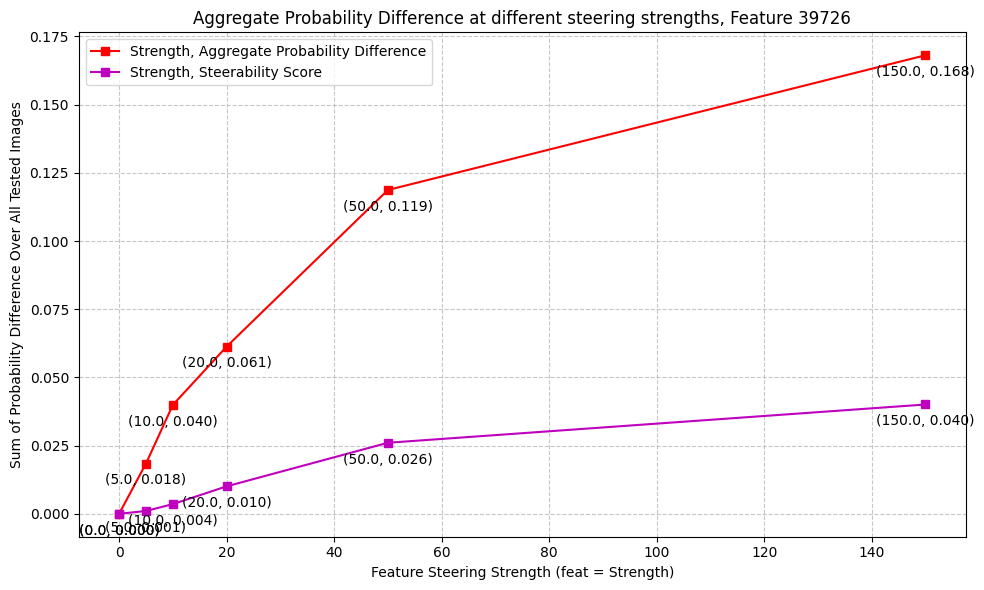

39726
150.0 ['lamp' 'mining' 'fish' 'papers' 'seal' 'speakers' 'led' 'steel' 'heating'
 'quarter']
150.0 probs tensor([0.1638, 0.0492, 0.0441, 0.0354, 0.0330, 0.0308, 0.0282, 0.0222, 0.0202,
        0.0185], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0283, 0.0017, 0.0015, 0.0011, 0.0008, 0.0007, 0.0005, 0.0004, 0.0004,
        0.0003])
['lamp' 'papers' 'mining' 'led' 'speakers' 'fish' 'heating' 'steel' 'seal'
 'quarter']


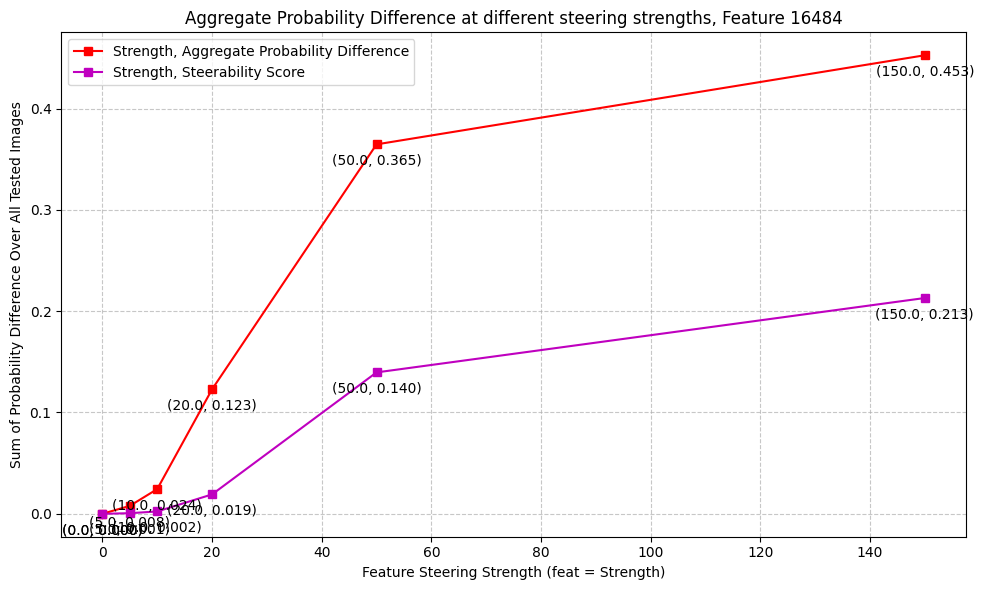

16484
150.0 ['wyoming' 'county' 'utah' 'sterling' 'colorado' 'used' 'windows'
 'country' 'womens' 'missouri']
150.0 probs tensor([0.4935, 0.0470, 0.0306, 0.0248, 0.0205, 0.0077, 0.0076, 0.0061, 0.0044,
        0.0040], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.0484e-01, 3.0338e-03, 7.6771e-04, 5.5852e-04, 5.0577e-04, 9.8962e-05,
        6.2903e-05, 4.7128e-05, 1.8690e-05, 1.8250e-05])
['wyoming' 'county' 'utah' 'colorado' 'sterling' 'windows' 'used'
 'country' 'wholesale' 'square']


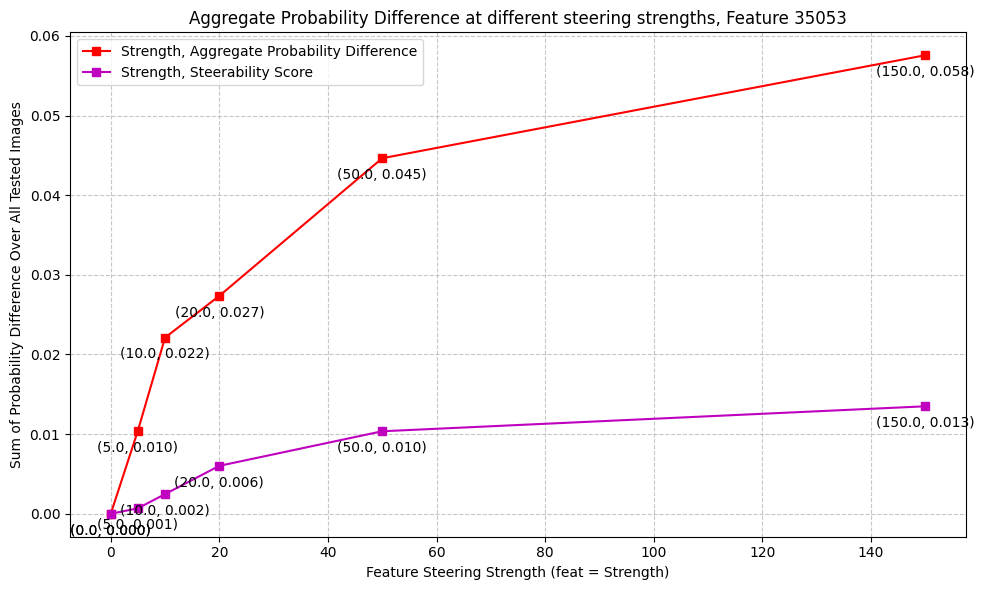

35053
150.0 ['navy' 'bill' 'cotton' 'cap' 'thumbnail' 'hat' 'bob' 'isbn' 'templates'
 'sort']
150.0 probs tensor([0.0837, 0.0417, 0.0341, 0.0274, 0.0197, 0.0189, 0.0185, 0.0114, 0.0111,
        0.0105], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.3139e-03, 1.8443e-03, 1.7685e-03, 9.7155e-04, 5.0408e-04, 4.9139e-04,
        2.9112e-04, 1.5989e-04, 9.9746e-05, 9.6039e-05])
['navy' 'bill' 'cotton' 'cap' 'hat' 'thumbnail' 'bob' 'isbn' 'templates'
 'sort']


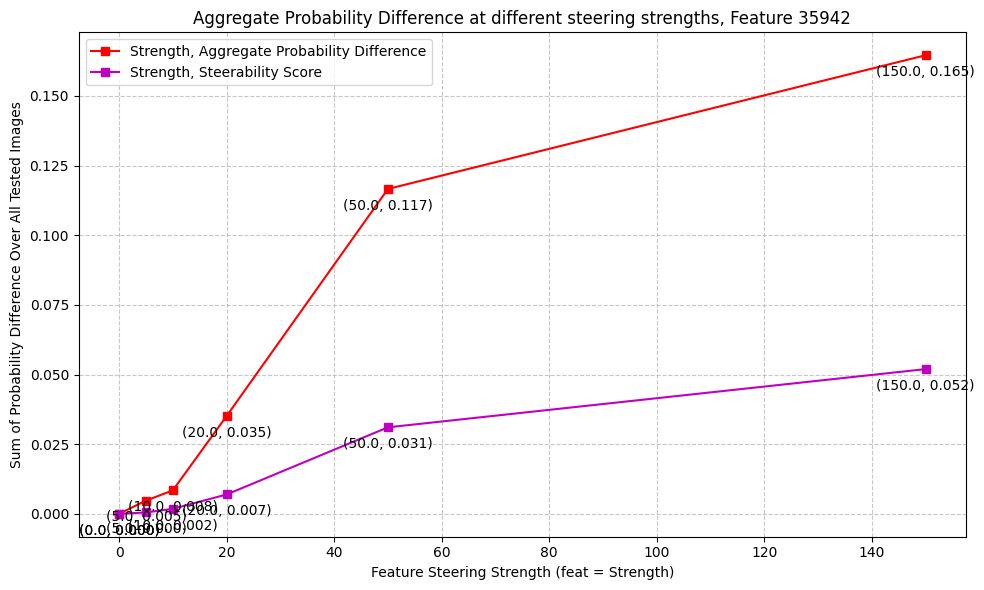

35942
150.0 ['grey' 'gray' 'drawing' 'newspaper' 'grid' 'blue' 'newsletter'
 'printable' 'orange' 'postal']
150.0 probs tensor([0.2027, 0.1309, 0.0369, 0.0361, 0.0333, 0.0266, 0.0254, 0.0196, 0.0146,
        0.0142], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0271, 0.0138, 0.0014, 0.0012, 0.0012, 0.0012, 0.0005, 0.0005, 0.0004,
        0.0003])
['grey' 'gray' 'newspaper' 'newsletter' 'drawing' 'grid' 'blue'
 'printable' 'orange' 'newsletters']


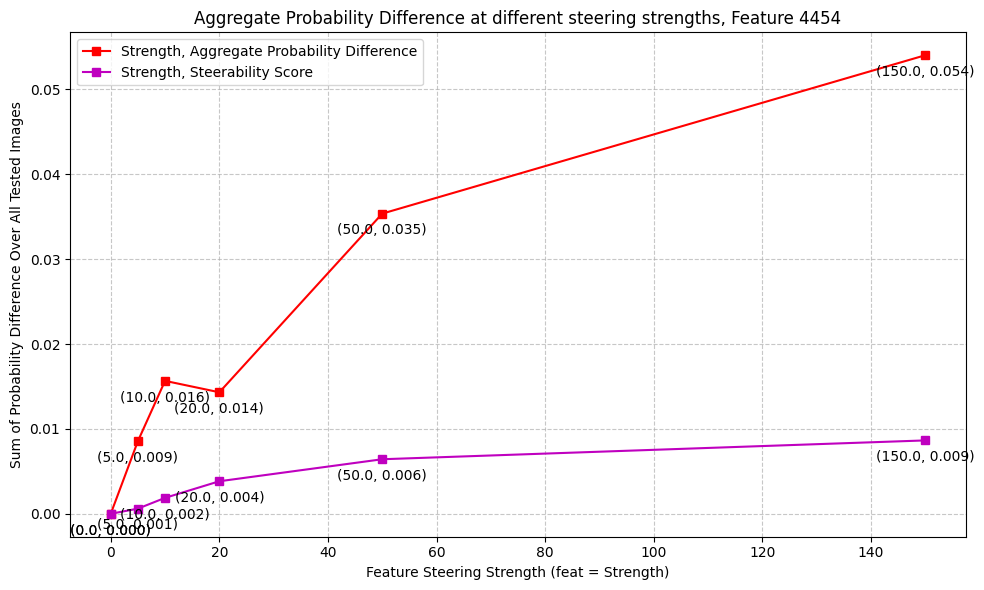

4454
150.0 ['button' 'catering' 'press' 'facility' 'costa' 'gate' 'nebraska' 'cart'
 'represented' 'silver']
150.0 probs tensor([0.0554, 0.0181, 0.0157, 0.0150, 0.0127, 0.0121, 0.0111, 0.0111, 0.0082,
        0.0080], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.9175e-03, 5.2162e-04, 3.3945e-04, 2.1042e-04, 2.0828e-04, 1.2906e-04,
        1.1044e-04, 1.0538e-04, 9.5444e-05, 5.2775e-05])
['button' 'catering' 'press' 'costa' 'facility' 'gate' 'nebraska' 'cart'
 'represented' 'walker']


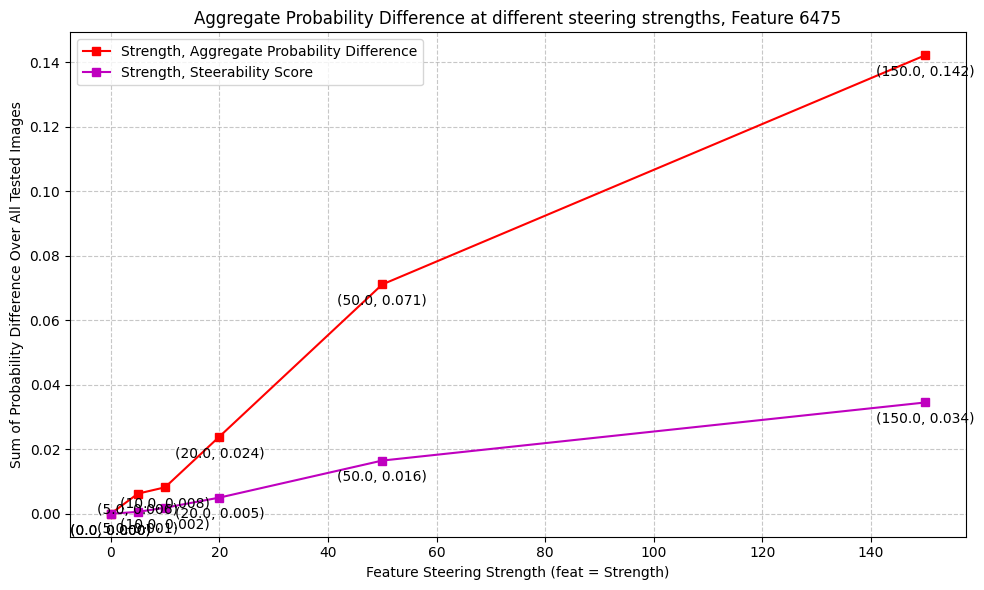

6475
150.0 ['papers' 'paperback' 'hp' 'nintendo' 'books' 'case' 'cases' 'vhs' 'it'
 'toys']
150.0 probs tensor([0.1205, 0.0676, 0.0370, 0.0368, 0.0309, 0.0295, 0.0192, 0.0179, 0.0156,
        0.0139], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0202, 0.0046, 0.0014, 0.0012, 0.0010, 0.0009, 0.0004, 0.0003, 0.0003,
        0.0002])
['papers' 'paperback' 'nintendo' 'hp' 'books' 'case' 'cases' 'it' 'vhs'
 'toys']


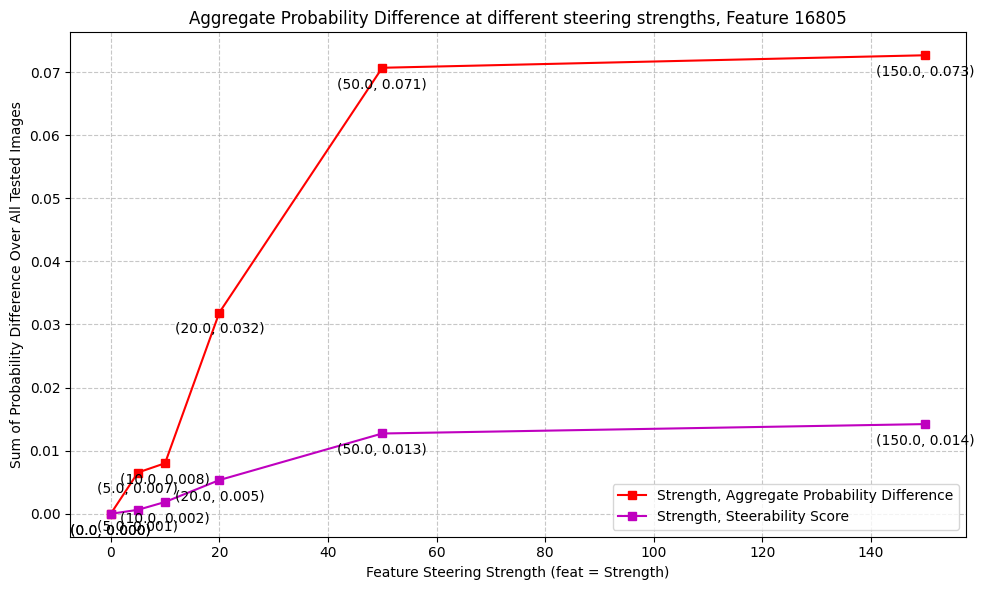

16805
150.0 ['usc' 'tn' 'contest' 'amazon' 'constitution' 'sheets' 'comics' 'fl'
 'tennessee' 'un']
150.0 probs tensor([0.0656, 0.0351, 0.0320, 0.0317, 0.0245, 0.0228, 0.0186, 0.0109, 0.0107,
        0.0103], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0053, 0.0012, 0.0012, 0.0008, 0.0005, 0.0004, 0.0004, 0.0001, 0.0001,
        0.0001])
['usc' 'contest' 'tn' 'amazon' 'constitution' 'sheets' 'comics'
 'tennessee' 'va' 'un']


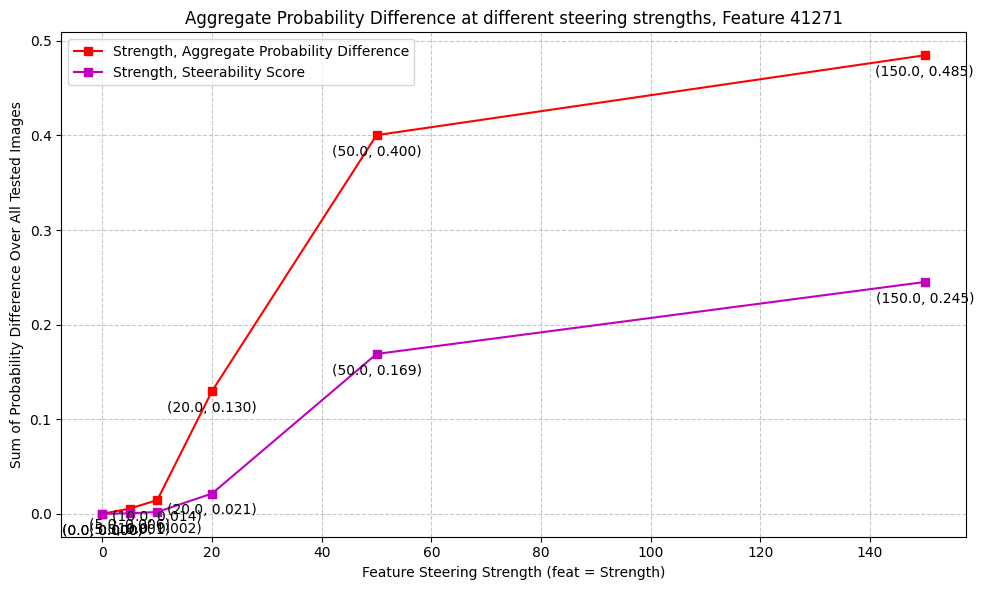

41271
150.0 ['dean' 'map' 'maps' 'layout' 'broker' 'networks' 'jobs' 'resume'
 'consultants' 'readers']
150.0 probs tensor([0.4915, 0.0543, 0.0433, 0.0250, 0.0195, 0.0171, 0.0156, 0.0119, 0.0091,
        0.0071], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.3503e-01, 3.3143e-03, 1.7984e-03, 6.2915e-04, 3.6335e-04, 2.9487e-04,
        2.4483e-04, 1.1741e-04, 7.8963e-05, 5.9902e-05])
['dean' 'map' 'maps' 'broker' 'layout' 'jobs' 'networks' 'resume'
 'consultants' 'readers']


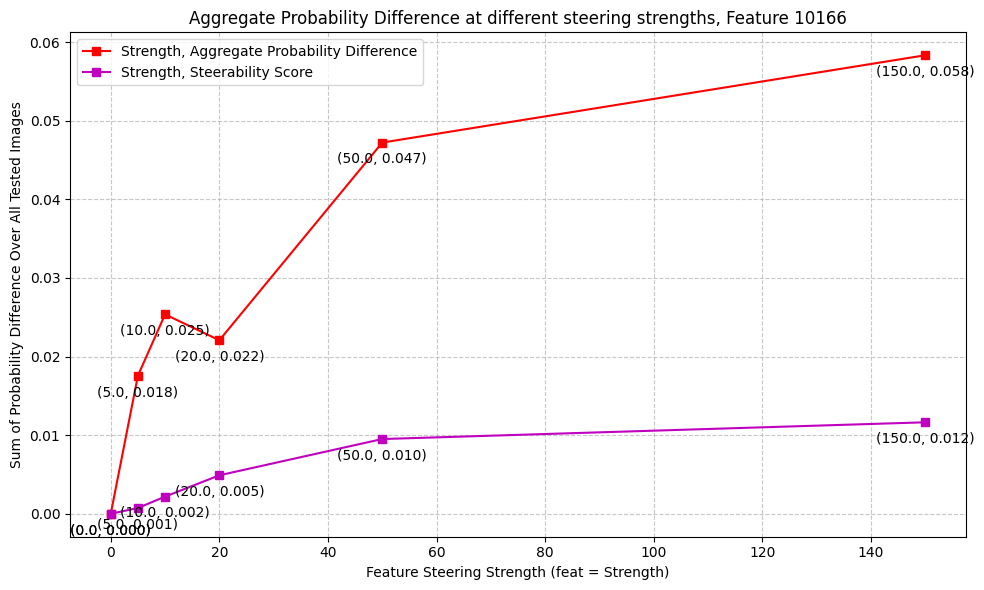

10166
150.0 ['pets' 'antique' 'gifts' 'antiques' 'dogs' 'german' 'womens' 'pet'
 'spanish' 'weapons']
150.0 probs tensor([0.0625, 0.0305, 0.0223, 0.0220, 0.0218, 0.0208, 0.0164, 0.0162, 0.0161,
        0.0153], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0034, 0.0010, 0.0006, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['pets' 'antique' 'antiques' 'gifts' 'german' 'spanish' 'dogs' 'pet'
 'womens' 'furniture']


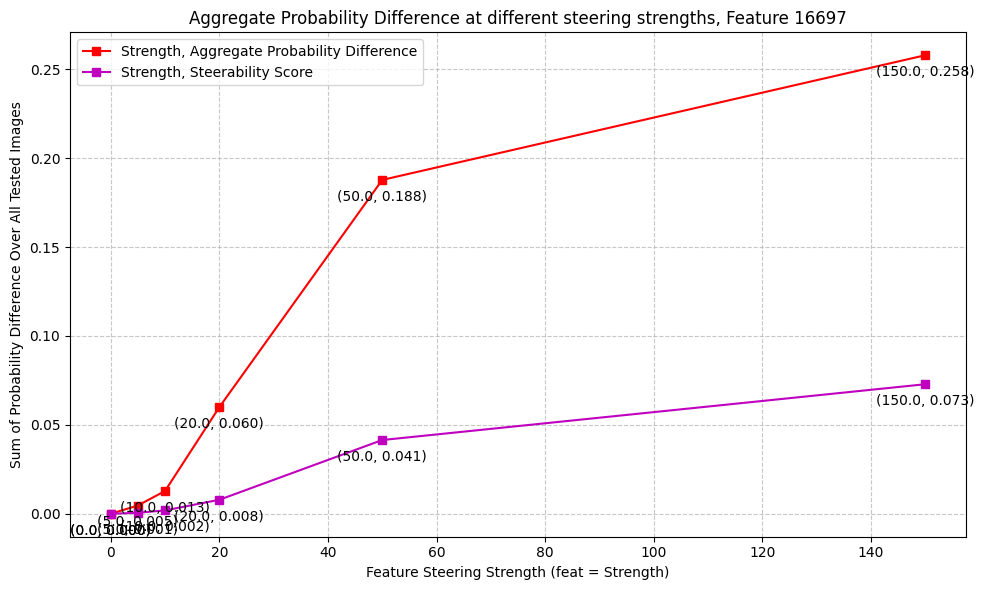

16697
150.0 ['ski' 'fishing' 'snow' 'data' 'hockey' 'swimming' 'boss' 'hire' 'guard'
 'summit']
150.0 probs tensor([0.2372, 0.0435, 0.0187, 0.0169, 0.0140, 0.0125, 0.0105, 0.0098, 0.0096,
        0.0094], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.6496e-02, 1.5861e-03, 5.4462e-04, 2.9399e-04, 1.6067e-04, 1.1834e-04,
        9.7266e-05, 8.6782e-05, 7.8268e-05, 6.4528e-05])
['ski' 'fishing' 'data' 'snow' 'hockey' 'guard' 'boss' 'hire' 'summit'
 'header']


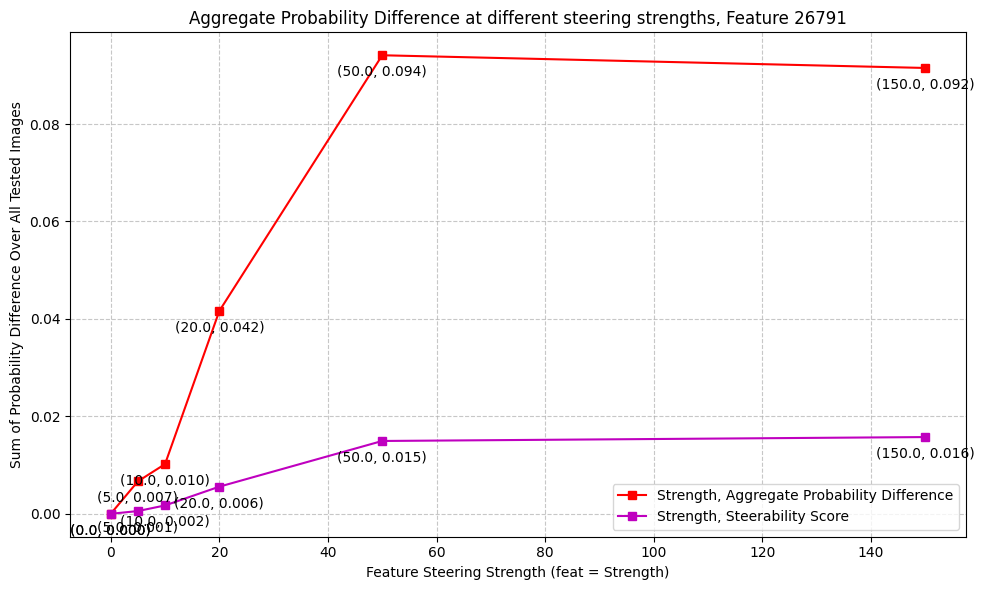

26791
150.0 ['controls' 'doors' 'plans' 'plane' 'card' 'boxes' 'mens' 'serving' 'menu'
 'cards']
150.0 probs tensor([0.0962, 0.0273, 0.0228, 0.0171, 0.0168, 0.0168, 0.0141, 0.0136, 0.0127,
        0.0122], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0084, 0.0007, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['controls' 'doors' 'plans' 'plane' 'card' 'serving' 'boxes' 'cards'
 'menu' 'mens']


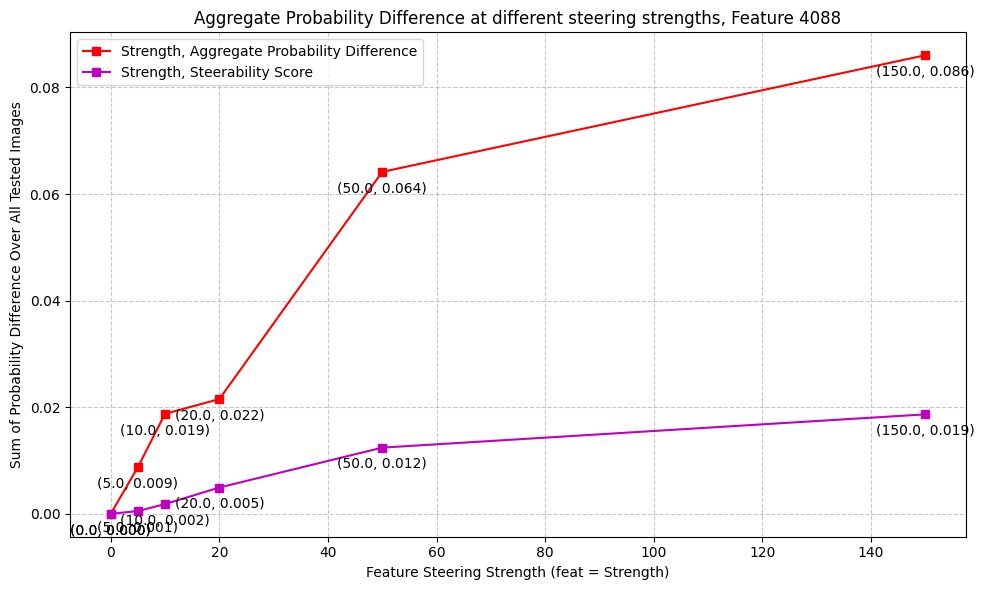

4088
150.0 ['front' 'beds' 'printable' 'cases' 'files' 'sizes' 'ltd' 'stands' 'belt'
 'patent']
150.0 probs tensor([0.0816, 0.0548, 0.0424, 0.0414, 0.0317, 0.0216, 0.0175, 0.0142, 0.0133,
        0.0110], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0074, 0.0020, 0.0017, 0.0013, 0.0012, 0.0005, 0.0004, 0.0002, 0.0001,
        0.0001])
['front' 'printable' 'cases' 'beds' 'files' 'sizes' 'ltd' 'stands' 'shown'
 'patent']


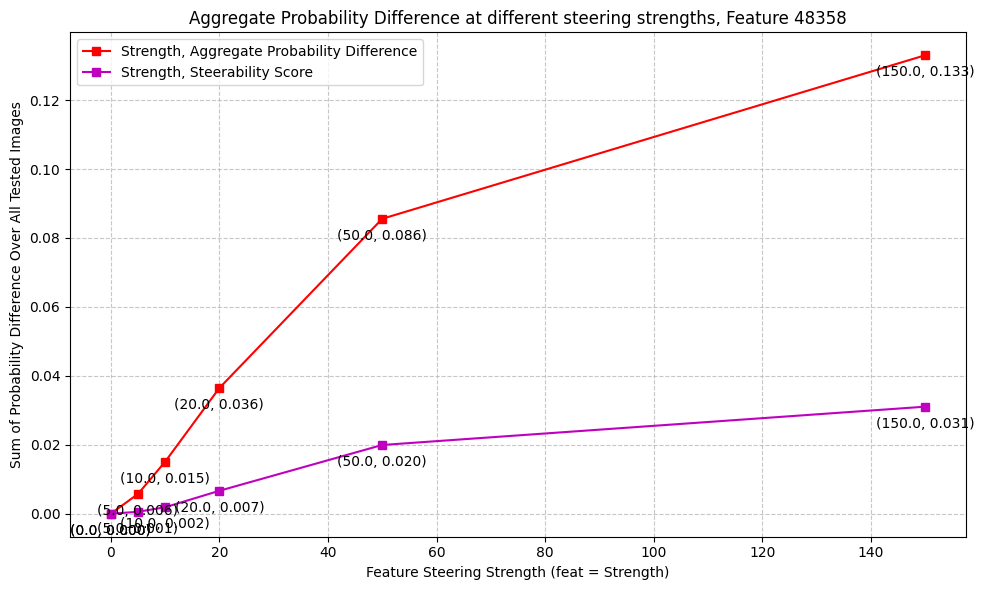

48358
150.0 ['boxes' 'cart' 'hat' 'packages' 'bags' 'want' 'rear' 'box' 'boat' 'oh']
150.0 probs tensor([0.1372, 0.0505, 0.0334, 0.0323, 0.0311, 0.0283, 0.0258, 0.0254, 0.0202,
        0.0164], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0177, 0.0024, 0.0016, 0.0011, 0.0010, 0.0008, 0.0007, 0.0005, 0.0003,
        0.0003])
['boxes' 'cart' 'hat' 'packages' 'want' 'bags' 'box' 'rear' 'oh' 'boat']


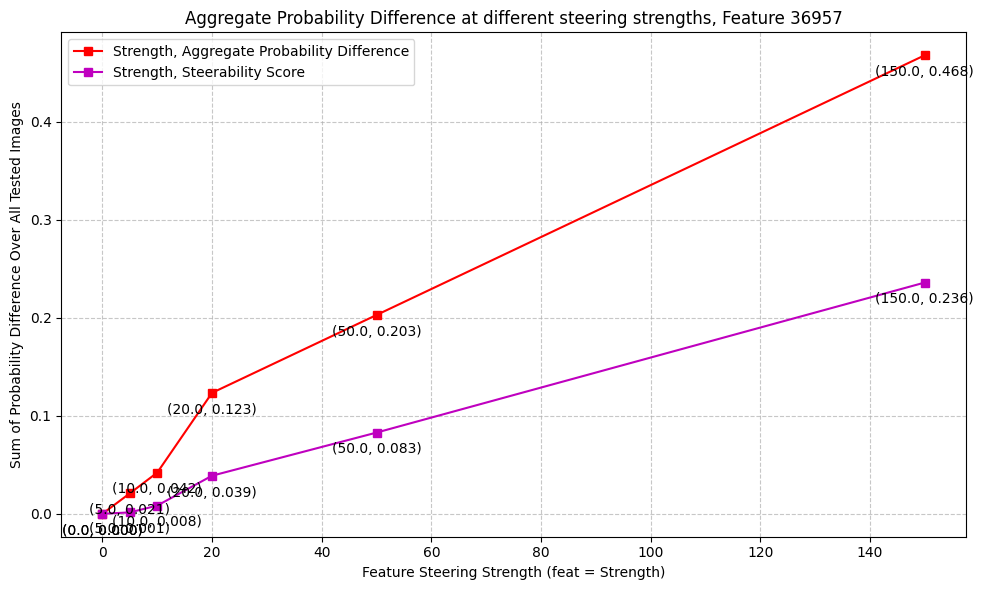

36957
150.0 ['printable' 'kit' 'pat' 'kits' 'an' 'pair' 'en' 'po' 'permalink' 'pst']
150.0 probs tensor([0.4659, 0.0842, 0.0621, 0.0440, 0.0337, 0.0111, 0.0101, 0.0097, 0.0093,
        0.0090], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.1897e-01, 6.1726e-03, 4.4100e-03, 1.7884e-03, 9.6917e-04, 1.0724e-04,
        1.0299e-04, 1.0143e-04, 7.7400e-05, 7.1538e-05])
['printable' 'kit' 'pat' 'kits' 'an' 'en' 'po' 'pa' 'pst' 'permalink']


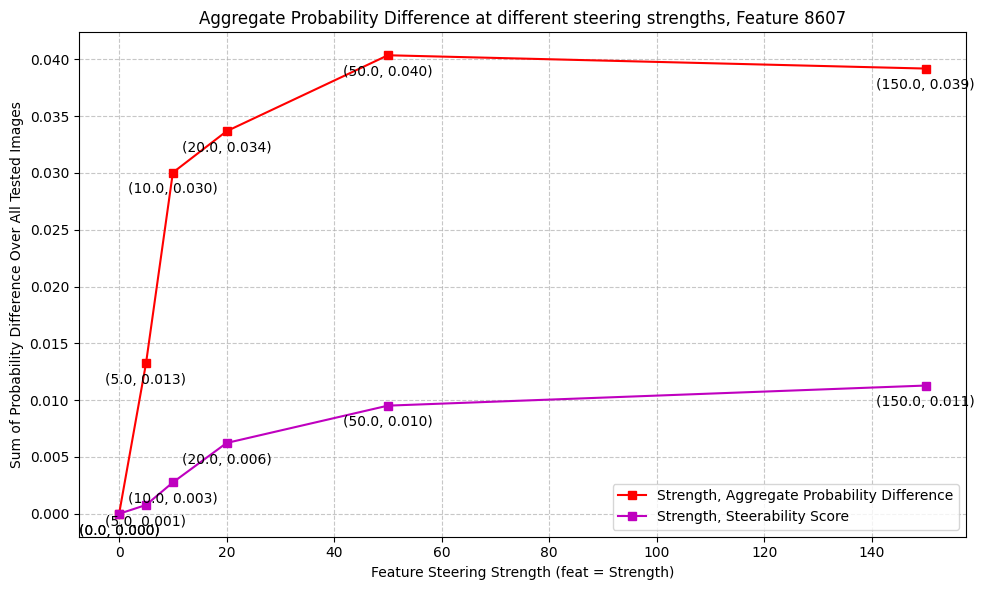

8607
150.0 ['displays' 'rack' 'epson' 'amd' 'monitors' 'stands' 'adobe' 'amazon'
 'sony' 'desktops']
150.0 probs tensor([0.0366, 0.0344, 0.0323, 0.0281, 0.0234, 0.0194, 0.0166, 0.0149, 0.0140,
        0.0121], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0015, 0.0015, 0.0011, 0.0010, 0.0005, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['rack' 'displays' 'epson' 'amd' 'monitors' 'stands' 'adobe' 'amazon'
 'want' 'sony']


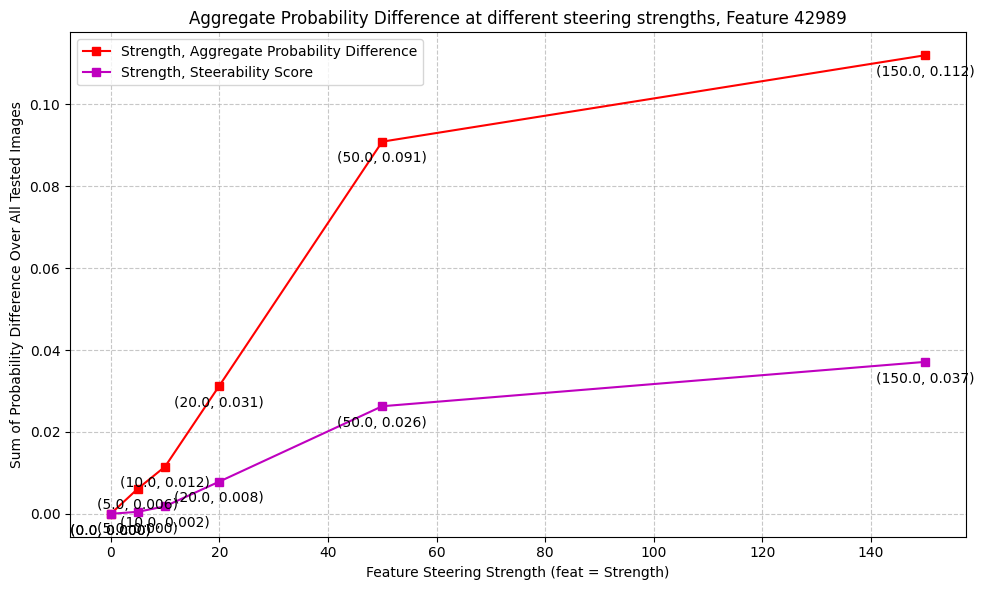

42989
150.0 ['trailer' 'trailers' 'deck' 'utilities' 'outlook' 'outdoor' 'build'
 'sheet' 'contacts' 'rear']
150.0 probs tensor([0.1251, 0.1194, 0.0577, 0.0406, 0.0356, 0.0345, 0.0248, 0.0214, 0.0196,
        0.0182], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0125, 0.0106, 0.0034, 0.0015, 0.0013, 0.0011, 0.0007, 0.0005, 0.0005,
        0.0004])
['trailer' 'trailers' 'deck' 'utilities' 'outdoor' 'outlook' 'build'
 'sheet' 'contacts' 'screen']


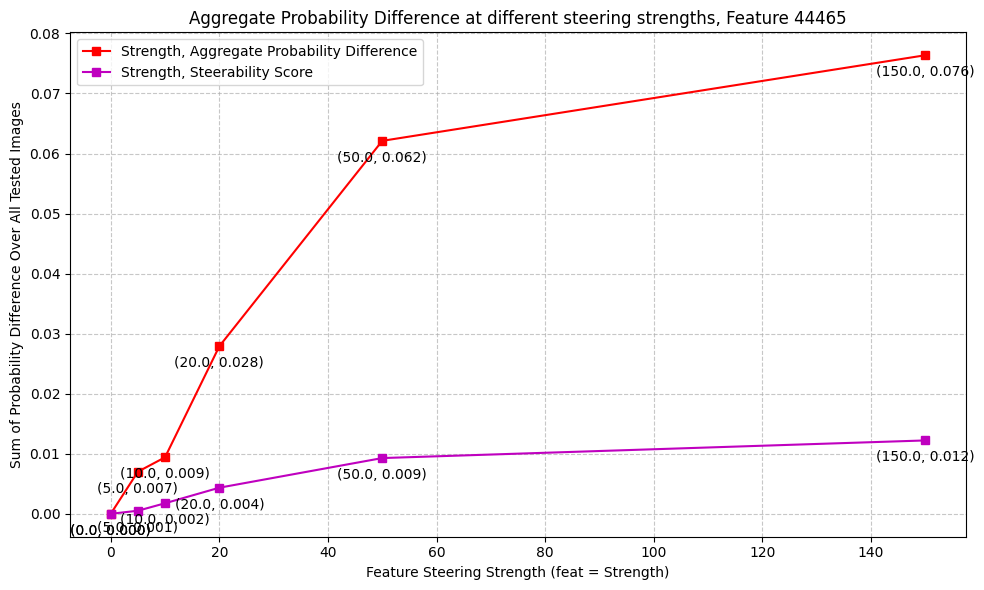

44465
150.0 ['silver' 'grey' 'rings' 'stainless' 'commission' 'hidden' 'metal' 'led'
 'steel' 'newest']
150.0 probs tensor([0.0872, 0.0482, 0.0176, 0.0169, 0.0147, 0.0113, 0.0112, 0.0097, 0.0083,
        0.0079], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.8313e-03, 1.4568e-03, 2.5937e-04, 2.4627e-04, 1.3080e-04, 1.2451e-04,
        1.0666e-04, 9.6494e-05, 6.8437e-05, 6.6046e-05])
['silver' 'grey' 'commission' 'stainless' 'led' 'hidden' 'metal' 'rings'
 'newest' 'agreed']


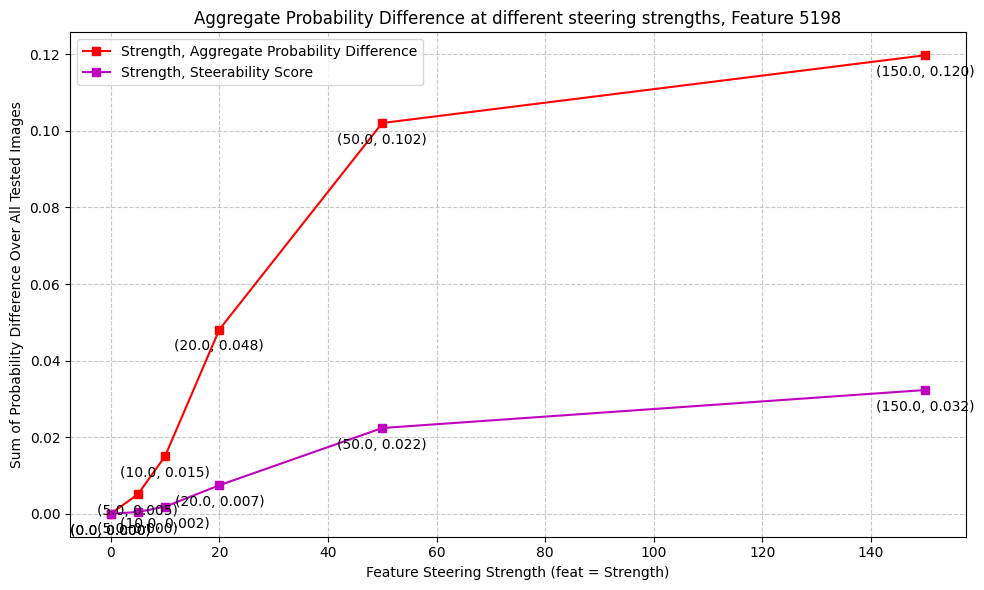

5198
150.0 ['charger' 'phones' 'remote' 'mobile' 'case' 'phone' 'cartridge' 'device'
 'cumshot' 'charges']
150.0 probs tensor([0.1285, 0.1235, 0.0404, 0.0317, 0.0239, 0.0175, 0.0167, 0.0128, 0.0127,
        0.0124], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0143, 0.0095, 0.0015, 0.0009, 0.0007, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0001])
['charger' 'phones' 'remote' 'mobile' 'case' 'cartridge' 'phone' 'device'
 'cumshot' 'shown']


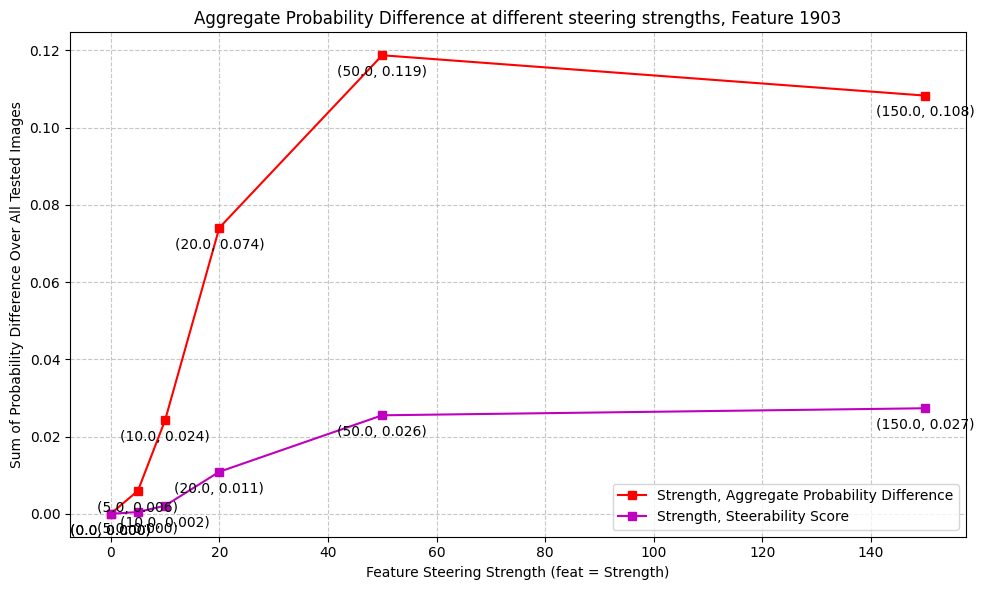

1903
150.0 ['front' 'fig' 'jason' 'et' 'python' 'ghost' 'marine' 'font' 'breast'
 'pizza']
150.0 probs tensor([0.0756, 0.0721, 0.0622, 0.0368, 0.0287, 0.0211, 0.0165, 0.0133, 0.0113,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0117, 0.0065, 0.0030, 0.0010, 0.0005, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['fig' 'front' 'jason' 'et' 'ghost' 'breast' 'tall' 'icon' 'marine' 'font']


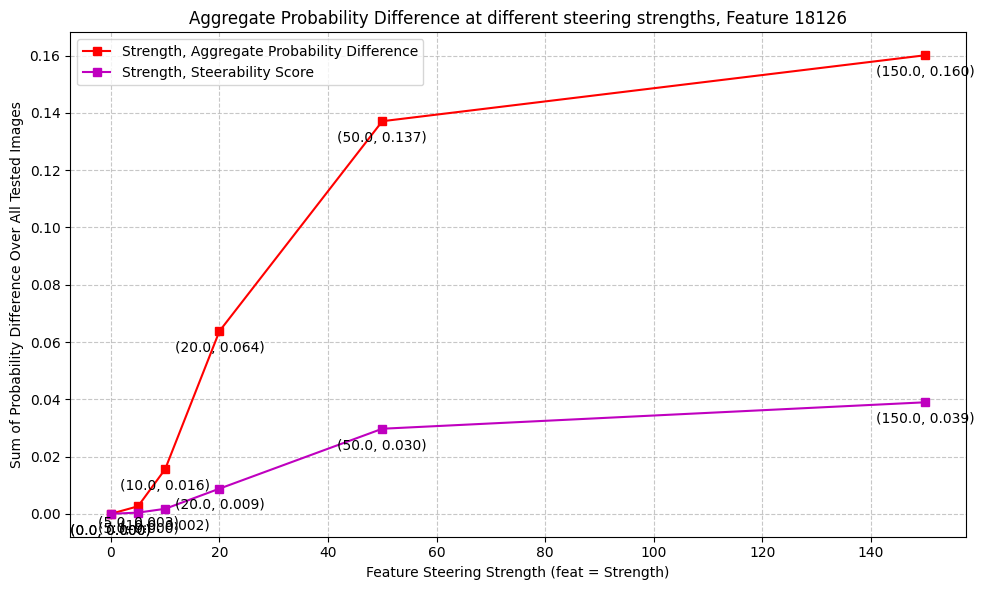

18126
150.0 ['panel' 'drivers' 'it' 'trading' 'administrator' 'broker' 'trucks'
 'board' 'monitors' 'energy']
150.0 probs tensor([0.1532, 0.0577, 0.0355, 0.0350, 0.0244, 0.0233, 0.0207, 0.0193, 0.0137,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0256, 0.0035, 0.0018, 0.0015, 0.0009, 0.0007, 0.0003, 0.0002, 0.0002,
        0.0001])
['panel' 'drivers' 'trading' 'it' 'broker' 'administrator' 'board'
 'trucks' 'monitors' 'energy']


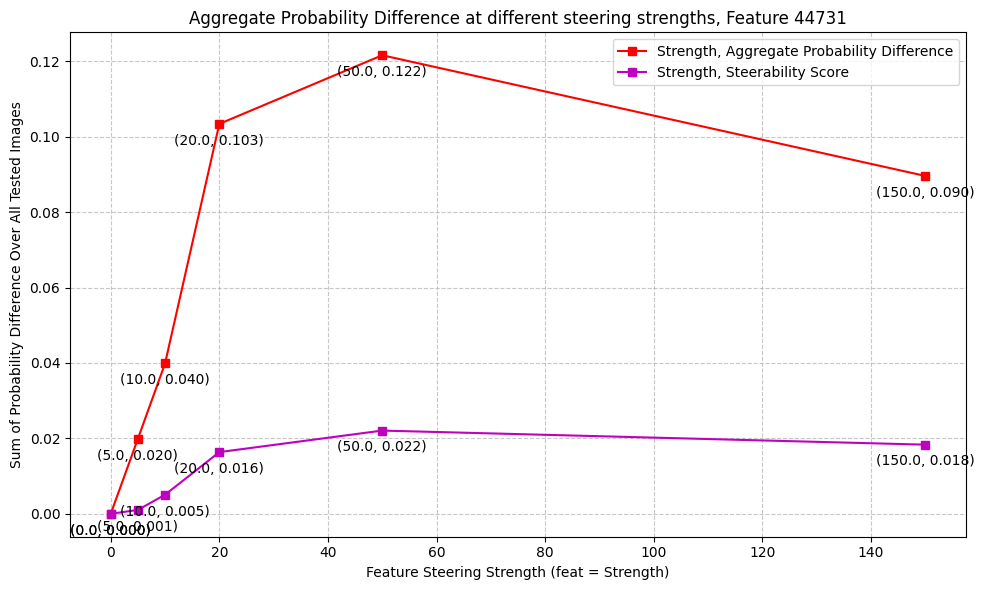

44731
150.0 ['female' 'womens' 'table' 'park' 'front' 'wedding' 'final' 'island'
 'male' 'woman']
150.0 probs tensor([0.1015, 0.0522, 0.0373, 0.0324, 0.0209, 0.0195, 0.0192, 0.0162, 0.0140,
        0.0124], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0080, 0.0021, 0.0011, 0.0010, 0.0007, 0.0005, 0.0003, 0.0002, 0.0002,
        0.0001])
['female' 'womens' 'table' 'park' 'wedding' 'front' 'final' 'woman'
 'island' 'spa']


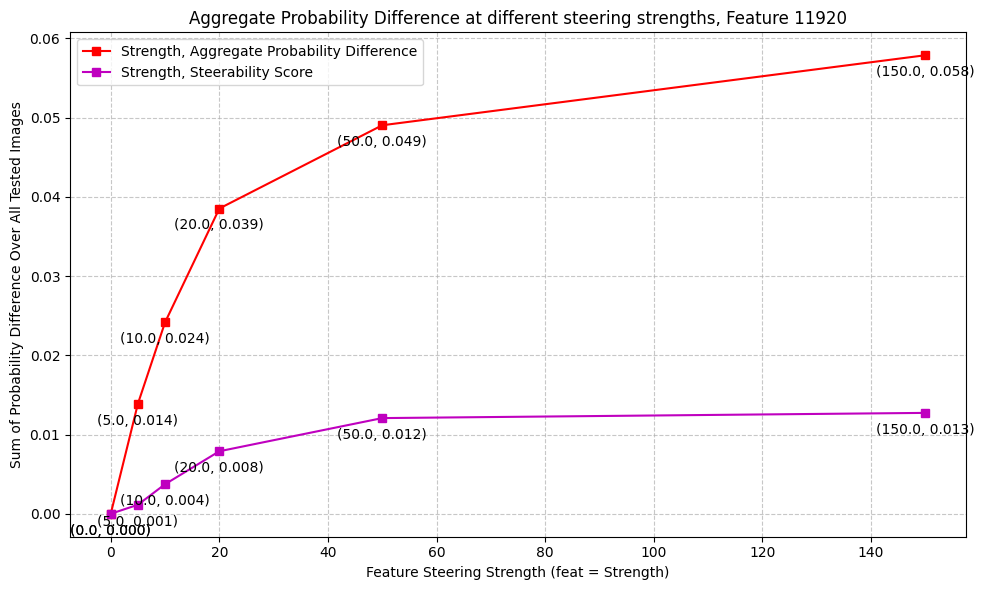

11920
150.0 ['ice' 'ma' 'fl' 'i' 'lakes' 'cute' 'l' 'lake' 'want' 'harry']
150.0 probs tensor([0.0635, 0.0284, 0.0256, 0.0252, 0.0237, 0.0232, 0.0230, 0.0186, 0.0178,
        0.0178], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0033, 0.0011, 0.0007, 0.0005, 0.0005, 0.0004, 0.0004, 0.0004, 0.0003,
        0.0003])
['ice' 'ma' 'i' 'l' 'cute' 'want' 'fl' 'thumbnail' 'lakes' 'ha']


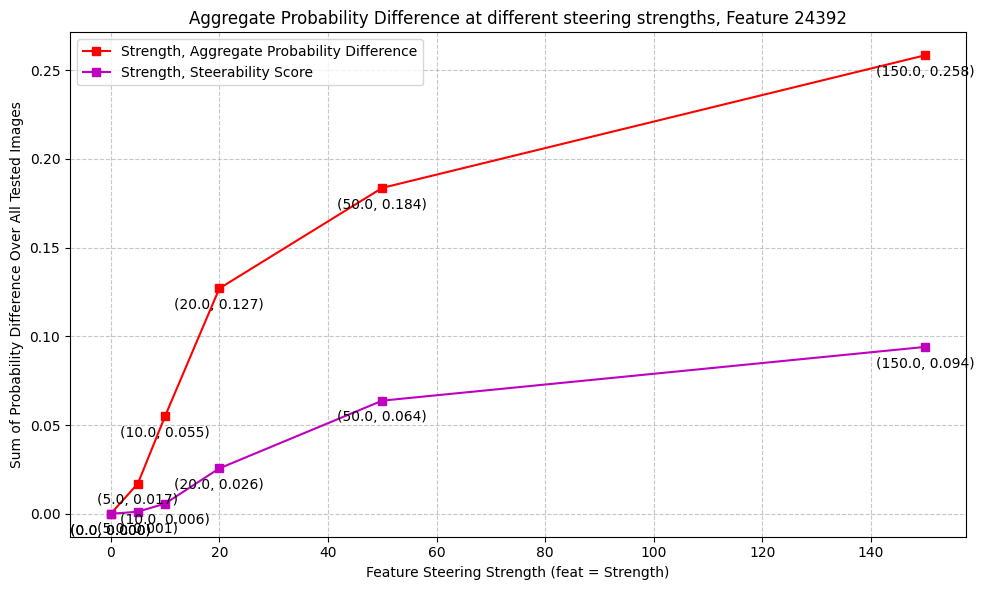

24392
150.0 ['thumbnail' 'front' 'image' 'photo' 'poster' 'avg' 'mens' 'cover' 'gene'
 'listing']
150.0 probs tensor([0.2439, 0.1108, 0.0780, 0.0699, 0.0165, 0.0150, 0.0116, 0.0102, 0.0097,
        0.0082], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.6747e-02, 1.2420e-02, 6.4466e-03, 4.4292e-03, 2.1561e-04, 2.0845e-04,
        1.0534e-04, 8.6166e-05, 8.0139e-05, 5.9236e-05])
['thumbnail' 'front' 'image' 'photo' 'avg' 'poster' 'cover' 'gene' 'mens'
 'magazine']


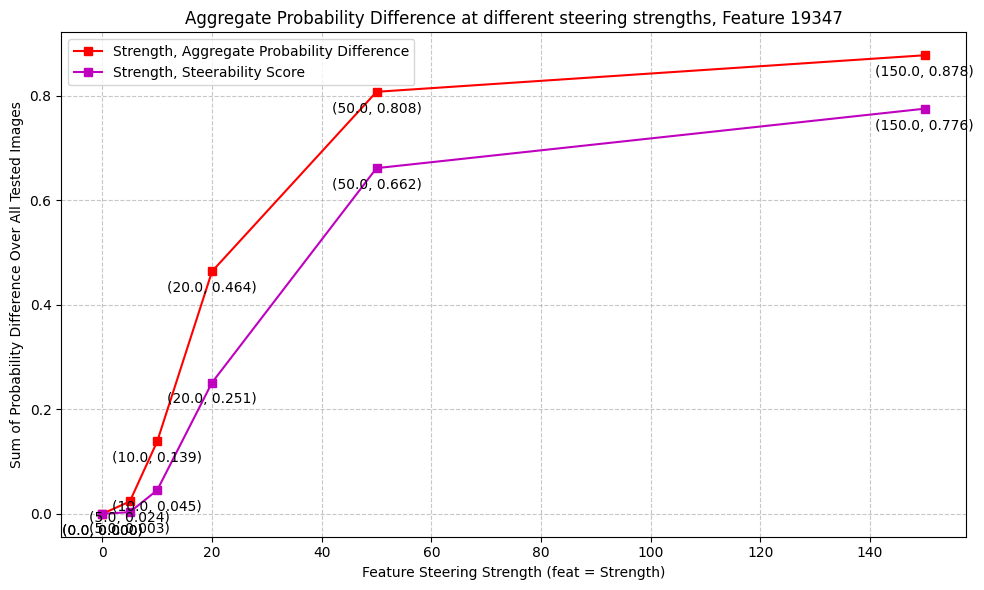

19347
150.0 ['hobbies' 'rubber' 'lib' 'celebrity' 'roberts' 'able' 'establish' 'babe'
 'visible' 'lesbians']
150.0 probs tensor([0.8377, 0.0755, 0.0163, 0.0061, 0.0058, 0.0057, 0.0052, 0.0046, 0.0044,
        0.0036], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([7.7050e-01, 1.7191e-03, 2.6460e-04, 3.9763e-05, 2.8591e-05, 2.8277e-05,
        2.3476e-05, 1.9808e-05, 1.3484e-05, 9.3013e-06])
['hobbies' 'rubber' 'lib' 'celebrity' 'able' 'roberts' 'establish' 'babe'
 'visible' 'lesbians']


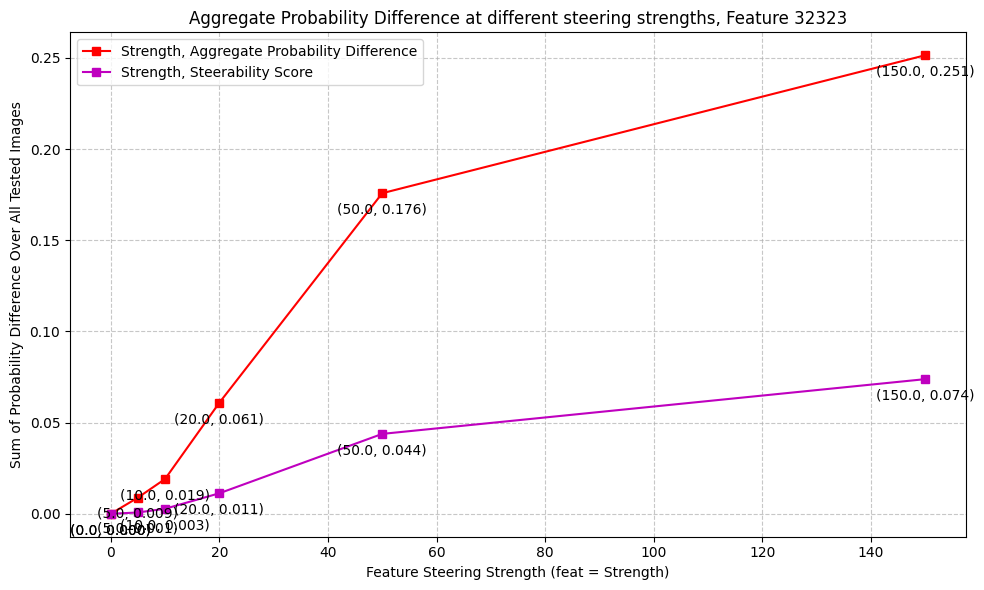

32323
150.0 ['birds' 'python' 'turkey' 'horses' 'ron' 'firefox' 'kerry' 'cocks'
 'phoenix' 'bird']
150.0 probs tensor([0.2498, 0.1276, 0.0357, 0.0318, 0.0285, 0.0249, 0.0140, 0.0131, 0.0101,
        0.0097], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0632, 0.0022, 0.0017, 0.0012, 0.0009, 0.0005, 0.0003, 0.0002, 0.0002,
        0.0001])
['birds' 'turkey' 'python' 'ron' 'horses' 'firefox' 'cocks' 'kerry'
 'phoenix' 'thumbnail']


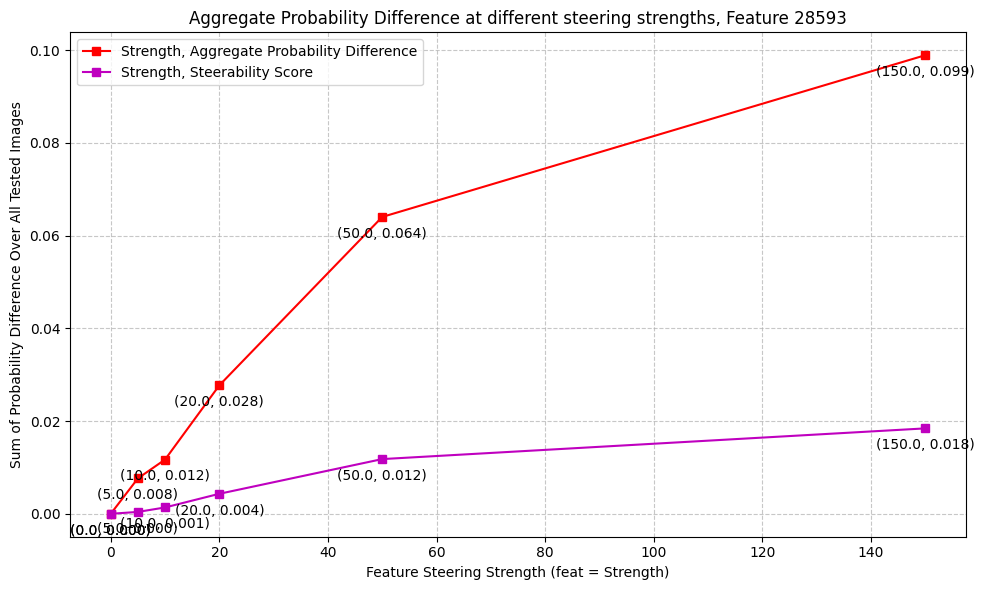

28593
150.0 ['wholesale' 'rack' 'catalog' 'equipment' 'supplier' 'suppliers' 'amazon'
 'manufacturers' 'shown' 'yards']
150.0 probs tensor([0.0859, 0.0378, 0.0277, 0.0270, 0.0189, 0.0152, 0.0147, 0.0139, 0.0135,
        0.0116], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0098, 0.0016, 0.0009, 0.0005, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0001])
['wholesale' 'rack' 'catalog' 'supplier' 'equipment' 'manufacturers'
 'suppliers' 'shown' 'amazon' 'printable']


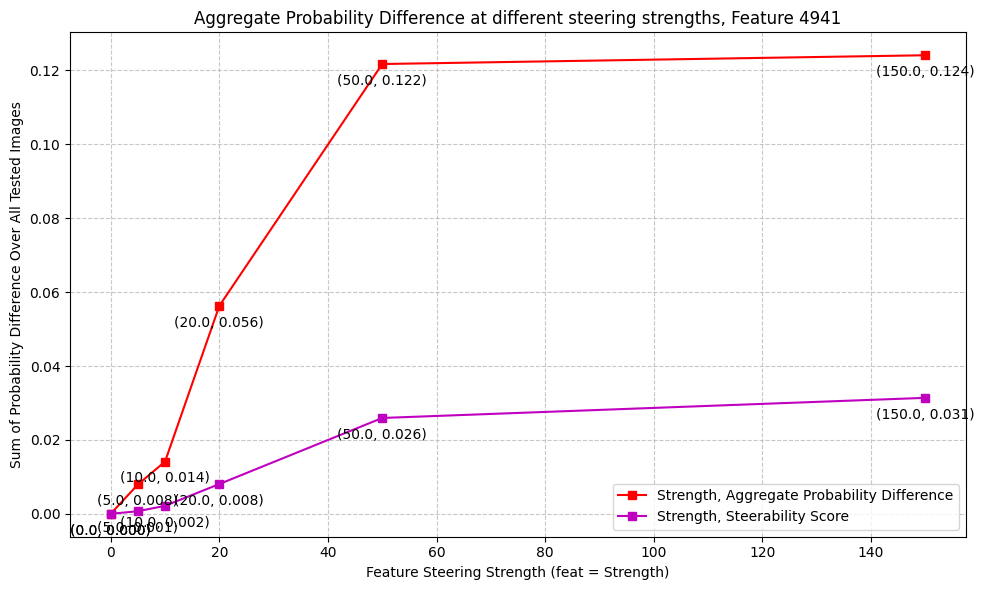

4941
150.0 ['string' 'belt' 'deck' 'binding' 'silver' 'path' 'boats' 'thongs'
 'cables' 'apparel']
150.0 probs tensor([0.1238, 0.0878, 0.0734, 0.0355, 0.0268, 0.0258, 0.0215, 0.0141, 0.0127,
        0.0122], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.5403e-02, 5.9976e-03, 2.8295e-03, 1.3492e-03, 6.6501e-04, 4.2428e-04,
        2.5030e-04, 2.2271e-04, 1.7139e-04, 9.3379e-05])
['string' 'deck' 'belt' 'binding' 'silver' 'path' 'boats' 'apparel'
 'broad' 'cables']


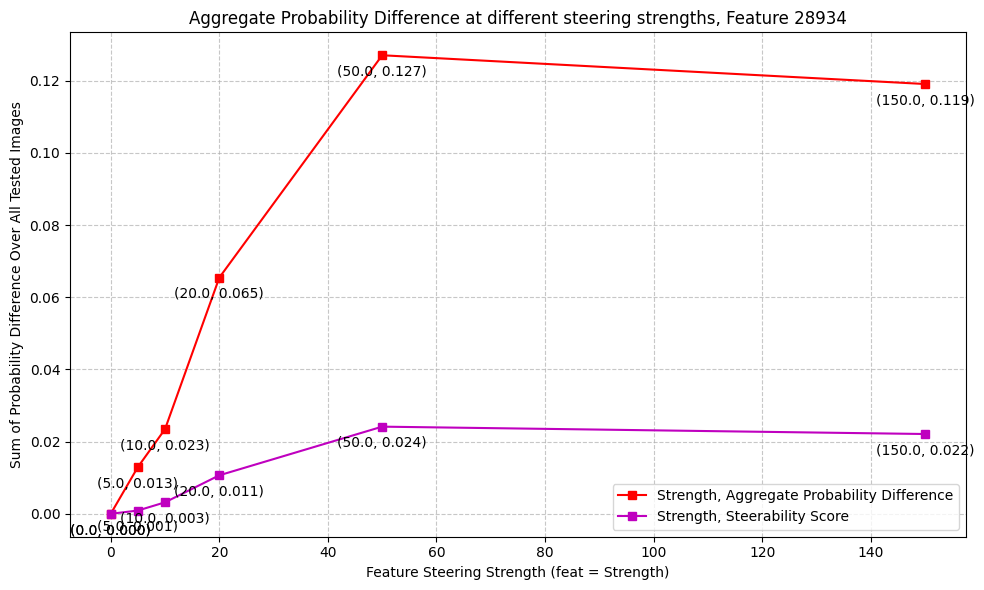

28934
150.0 ['sterling' 'miller' 'installed' 'string' 'printers' 'wire' 'gold'
 'adapter' 'intellectual' 'martin']
150.0 probs tensor([0.1465, 0.0495, 0.0237, 0.0182, 0.0162, 0.0145, 0.0120, 0.0110, 0.0109,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0142, 0.0024, 0.0003, 0.0003, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001])
['sterling' 'miller' 'installed' 'string' 'printers' 'gold' 'wire'
 'adapter' 'smith' 'intellectual']


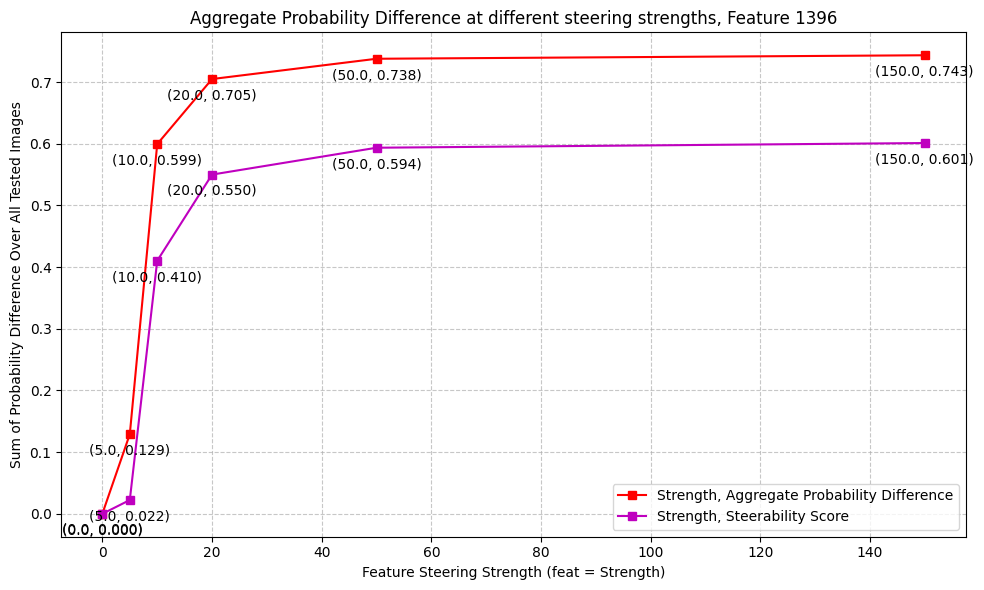

1396
150.0 ['russian' 'russia' 'ukraine' 'bulgaria' 'porno' 'poland' 'polish'
 'accident' 'result' 'czech']
150.0 probs tensor([7.2805e-01, 2.1860e-01, 5.1117e-02, 2.0772e-03, 1.2870e-04, 1.4898e-05,
        1.2325e-06, 8.6044e-07, 5.9601e-07, 3.5038e-07], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([ 5.5278e-01,  4.3435e-02,  2.1162e-03,  2.5401e-06, -1.7935e-14,
        -6.0152e-14, -3.0563e-13, -4.1169e-13, -4.1429e-13, -5.2558e-13])
['russian' 'russia' 'ukraine' 'bulgaria' 'quotes' 'countries' 'pubmed'
 'apartments' 'companies' 'quote']


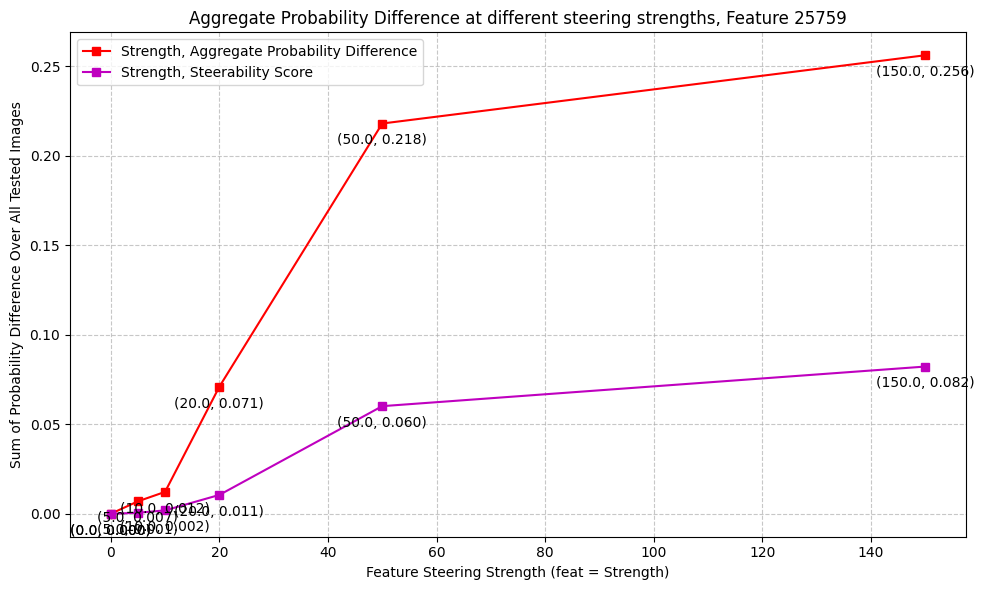

25759
150.0 ['simpson' 'jewellery' 'jewelry' 'rob' 'cars' 'shorts' 'tennis' 'watches'
 'mens' 'donald']
150.0 probs tensor([0.2148, 0.0888, 0.0681, 0.0367, 0.0365, 0.0353, 0.0253, 0.0176, 0.0147,
        0.0138], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0655, 0.0057, 0.0028, 0.0017, 0.0008, 0.0008, 0.0006, 0.0002, 0.0002,
        0.0002])
['simpson' 'jewellery' 'jewelry' 'rob' 'cars' 'shorts' 'tennis' 'watches'
 'donald' 'mens']


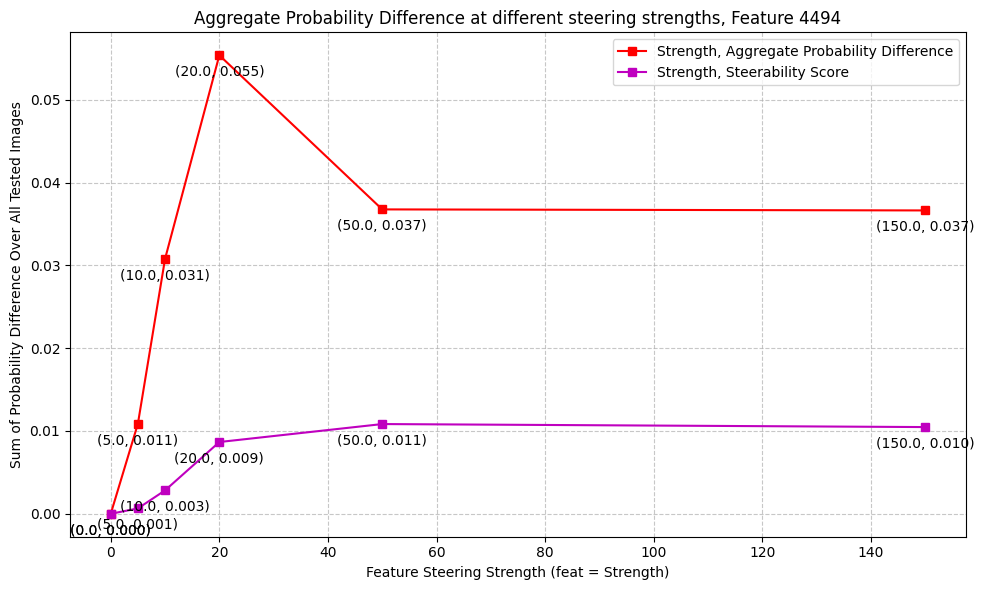

4494
150.0 ['period' 'journal' 'photos' 'testimonials' 'writers' 'postal' 'photo'
 'ethnic' 'letter' 'mens']
150.0 probs tensor([0.0358, 0.0264, 0.0260, 0.0248, 0.0217, 0.0216, 0.0204, 0.0192, 0.0187,
        0.0181], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0013, 0.0007, 0.0006, 0.0006, 0.0005, 0.0004, 0.0004, 0.0003, 0.0002,
        0.0002])
['period' 'testimonials' 'journal' 'writers' 'photos' 'ethnic' 'postal'
 'photo' 'writer' 'personals']


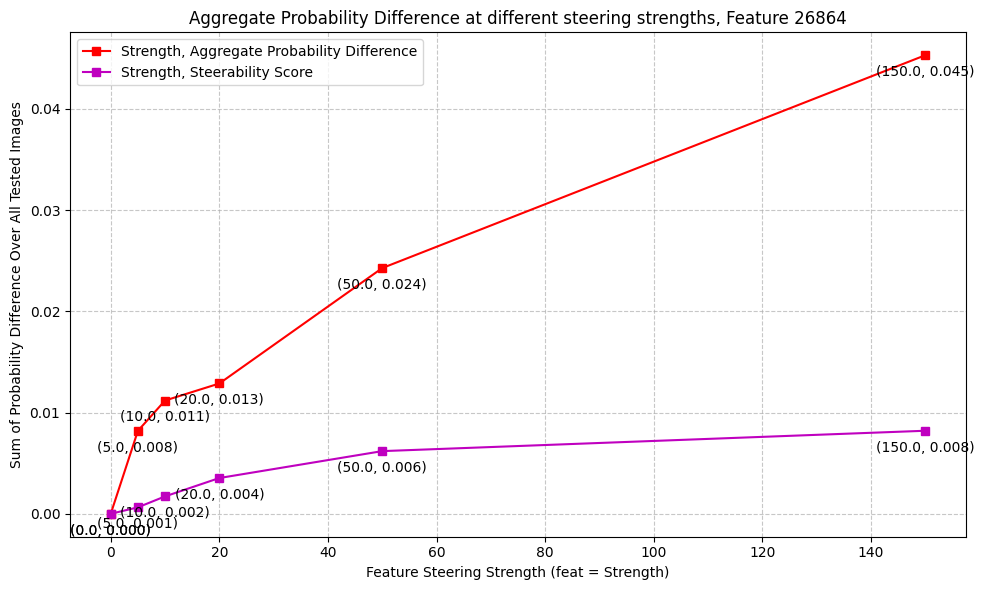

26864
150.0 ['mens' 'national' 'womens' 'lawrence' 'virginia' 'fl' 'milwaukee'
 'florida' 'wv' 'classic']
150.0 probs tensor([0.0542, 0.0228, 0.0214, 0.0155, 0.0152, 0.0138, 0.0133, 0.0128, 0.0107,
        0.0102], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0006, 0.0004, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001,
        0.0001])
['mens' 'national' 'womens' 'lawrence' 'virginia' 'wv' 'milwaukee'
 'classic' 'freedom' 'fl']


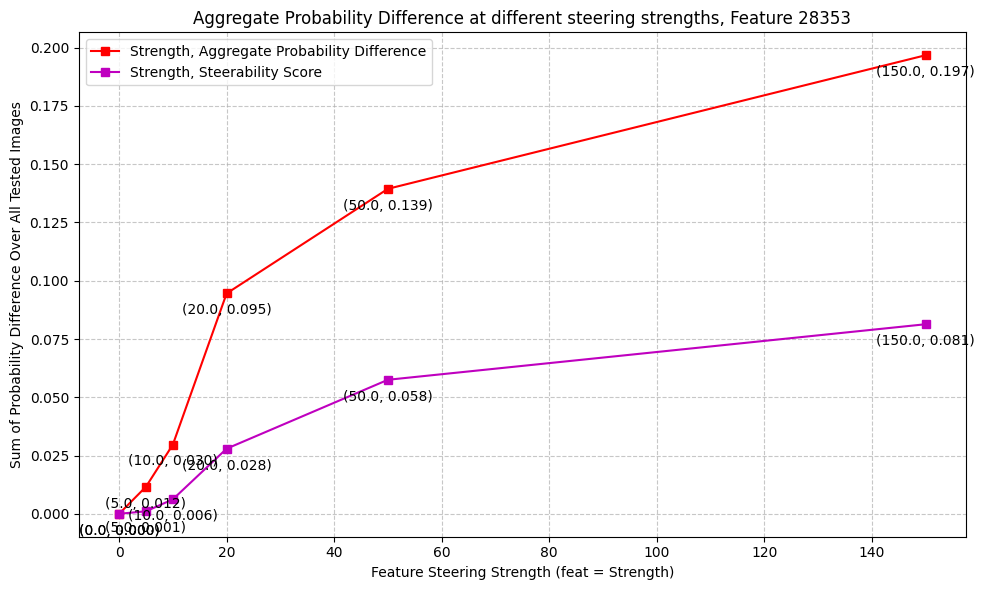

28353
150.0 ['beds' 'trailers' 'pack' 'rear' 'configuration' 'trailer' 'seats'
 'equipment' 'subsection' 'sets']
150.0 probs tensor([0.2471, 0.1546, 0.0640, 0.0494, 0.0479, 0.0359, 0.0350, 0.0340, 0.0277,
        0.0228], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0387, 0.0222, 0.0067, 0.0024, 0.0020, 0.0013, 0.0012, 0.0009, 0.0009,
        0.0005])
['beds' 'trailers' 'pack' 'rear' 'configuration' 'trailer' 'seats'
 'subsection' 'equipment' 'sets']


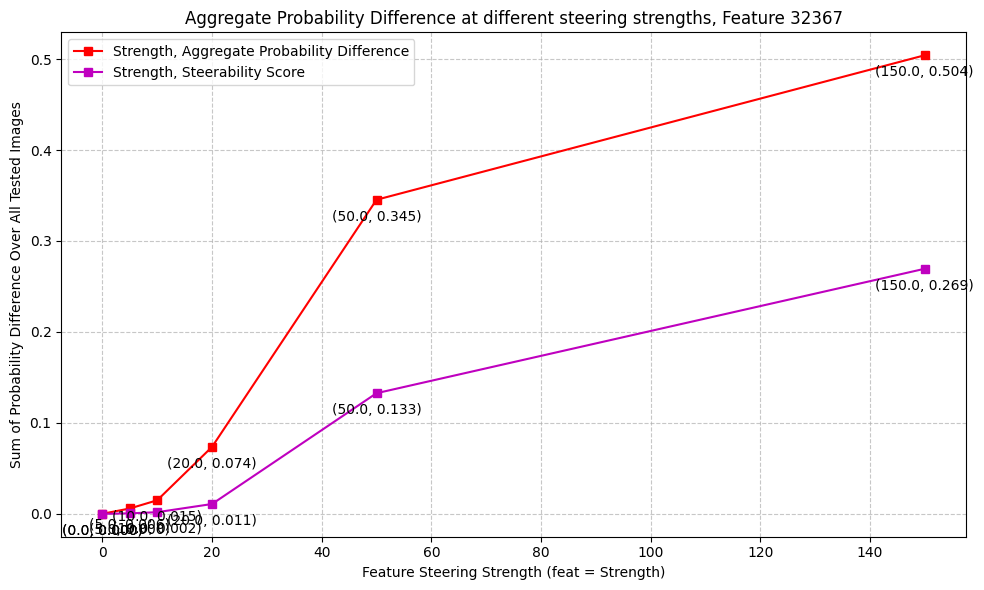

32367
150.0 ['stamps' 'postage' 'dolls' 'bottle' 'johnny' 'pipe' 'postal' 'boobs'
 'irish' 'pottery']
150.0 probs tensor([0.5234, 0.0882, 0.0365, 0.0182, 0.0117, 0.0115, 0.0104, 0.0075, 0.0041,
        0.0041], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.5426e-01, 9.2274e-03, 2.3850e-03, 3.5317e-04, 1.3123e-04, 1.1098e-04,
        9.1833e-05, 2.6775e-05, 1.6235e-05, 1.3174e-05])
['stamps' 'postage' 'dolls' 'bottle' 'johnny' 'pipe' 'postal' 'boobs'
 'irish' 'messages']


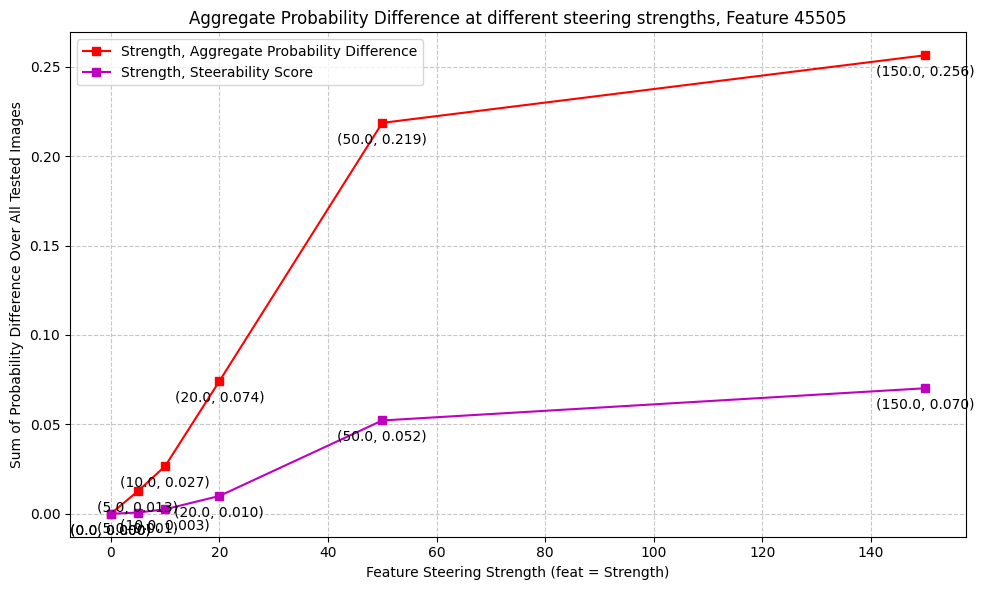

45505
150.0 ['sheet' 'board' 'bug' 'poster' 'label' 'door' 'register' 'logos' 'van'
 'lcd']
150.0 probs tensor([0.2510, 0.0213, 0.0125, 0.0089, 0.0087, 0.0080, 0.0074, 0.0071, 0.0070,
        0.0069], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.5746e-02, 4.2043e-04, 9.1745e-05, 7.0882e-05, 6.0449e-05, 5.4407e-05,
        5.0374e-05, 4.4085e-05, 4.0838e-05, 3.8137e-05])
['sheet' 'board' 'label' 'poster' 'door' 'lcd' 'register' 'bug' 'prices'
 'panel']


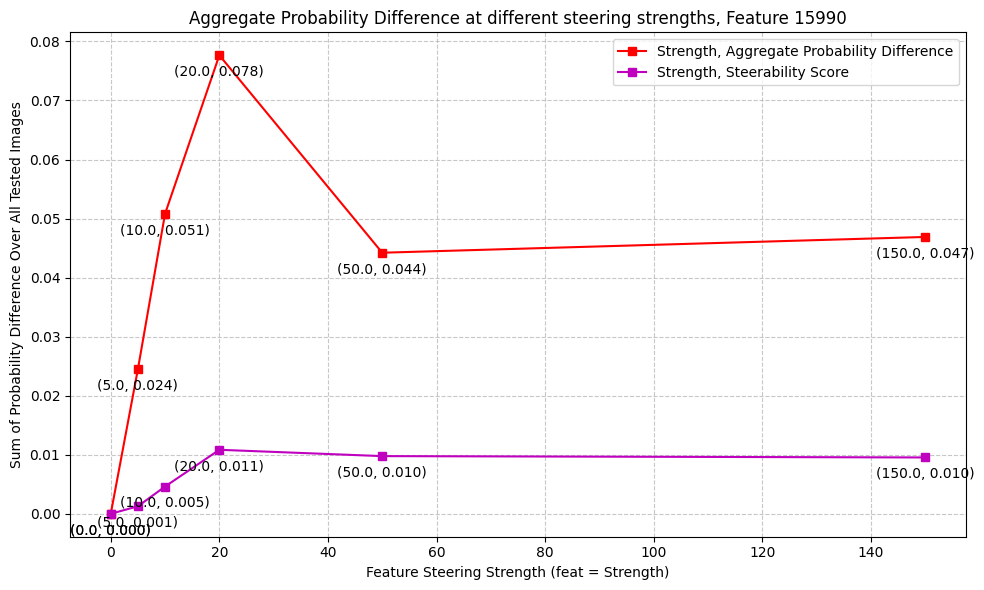

15990
150.0 ['al' 'ray' 'poster' 'art' 'v' 'lingerie' 'logo' 'bond' 'jackson' 'delta']
150.0 probs tensor([0.0471, 0.0307, 0.0245, 0.0198, 0.0179, 0.0172, 0.0163, 0.0139, 0.0131,
        0.0127], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0022, 0.0005, 0.0005, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001])
['al' 'poster' 'art' 'ray' 'v' 'logo' 'lingerie' 'jackson' 'delta'
 'painting']


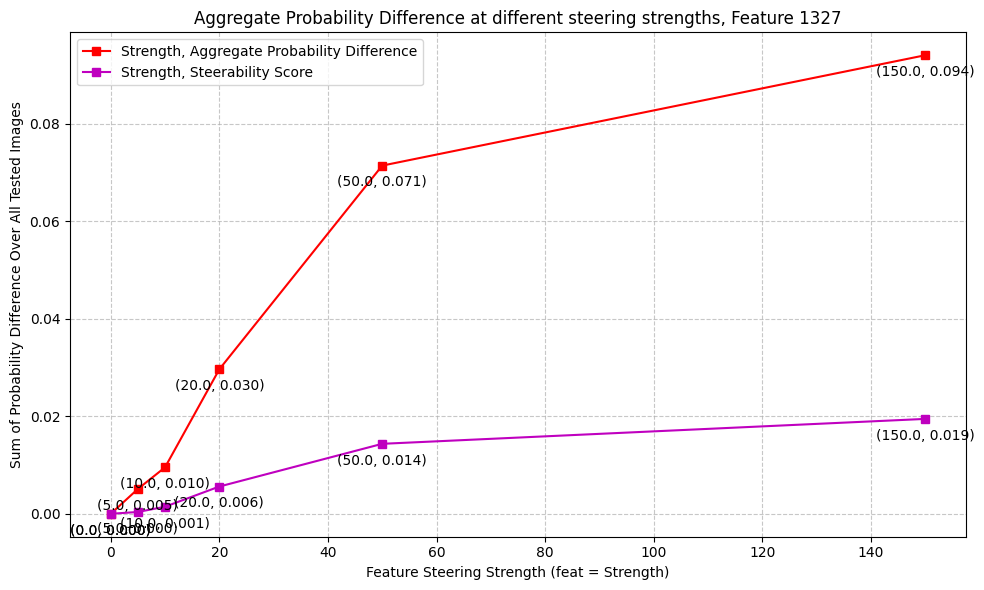

1327
150.0 ['cameras' 'phones' 'shirts' 'clips' 'jersey' 'h' 'up' 'calculator' 'rack'
 'frames']
150.0 probs tensor([0.0893, 0.0509, 0.0316, 0.0309, 0.0279, 0.0262, 0.0244, 0.0199, 0.0184,
        0.0173], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0088, 0.0014, 0.0011, 0.0007, 0.0007, 0.0007, 0.0005, 0.0004, 0.0004,
        0.0003])
['cameras' 'phones' 'shirts' 'up' 'clips' 'jersey' 'h' 'rack' 'calculator'
 'frames']


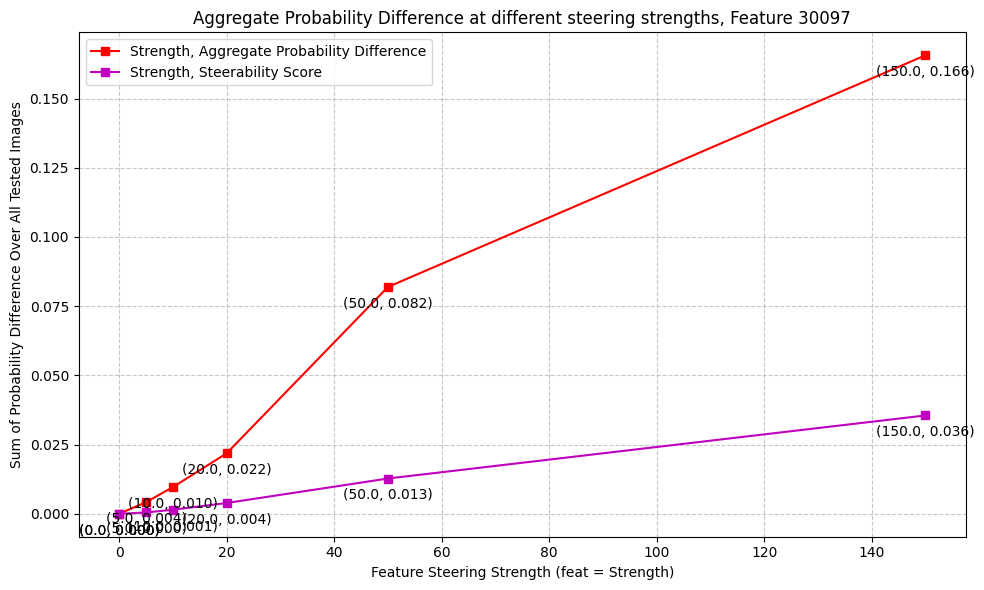

30097
150.0 ['banner' 'header' 'b' 'blue' 'pet' 'article' 'board' 'o' 'mini'
 'activities']
150.0 probs tensor([0.1564, 0.0524, 0.0236, 0.0180, 0.0135, 0.0088, 0.0087, 0.0084, 0.0072,
        0.0062], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.7435e-02, 3.4934e-03, 3.5001e-04, 1.9878e-04, 1.4998e-04, 6.6636e-05,
        6.6405e-05, 4.8525e-05, 3.7717e-05, 3.7304e-05])
['banner' 'header' 'b' 'blue' 'pet' 'board' 'article' 'mini' 'wholesale'
 'shop']


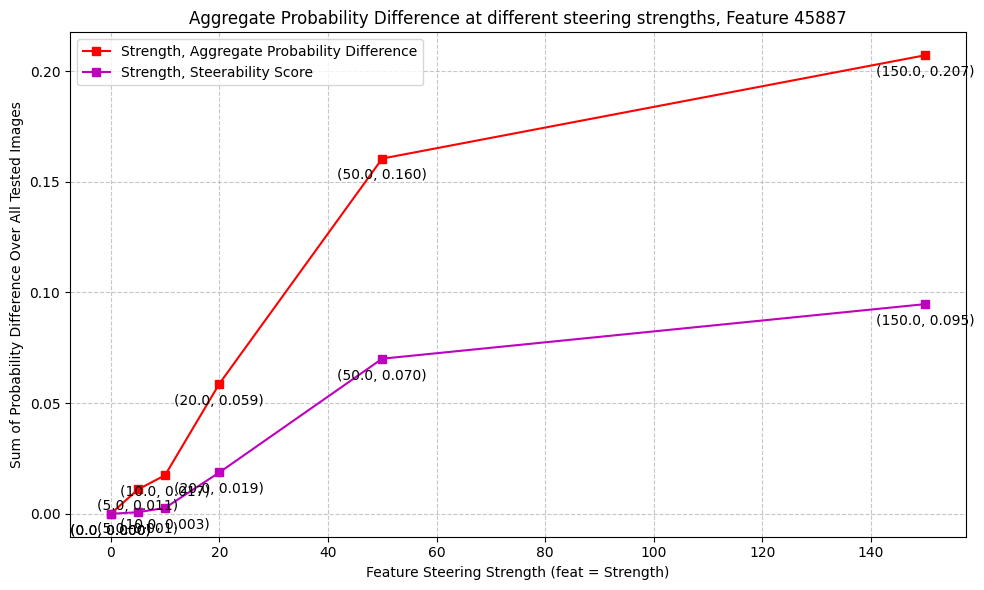

45887
150.0 ['lcd' 'window' 'glass' 'foundation' 'frame' 'displays' 'display' 'mesh'
 'womens' 'screen']
150.0 probs tensor([0.2103, 0.1503, 0.0830, 0.0830, 0.0553, 0.0496, 0.0408, 0.0234, 0.0215,
        0.0130], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0429, 0.0258, 0.0074, 0.0069, 0.0034, 0.0023, 0.0014, 0.0004, 0.0003,
        0.0002])
['lcd' 'window' 'glass' 'foundation' 'frame' 'displays' 'display' 'mesh'
 'womens' 'screen']


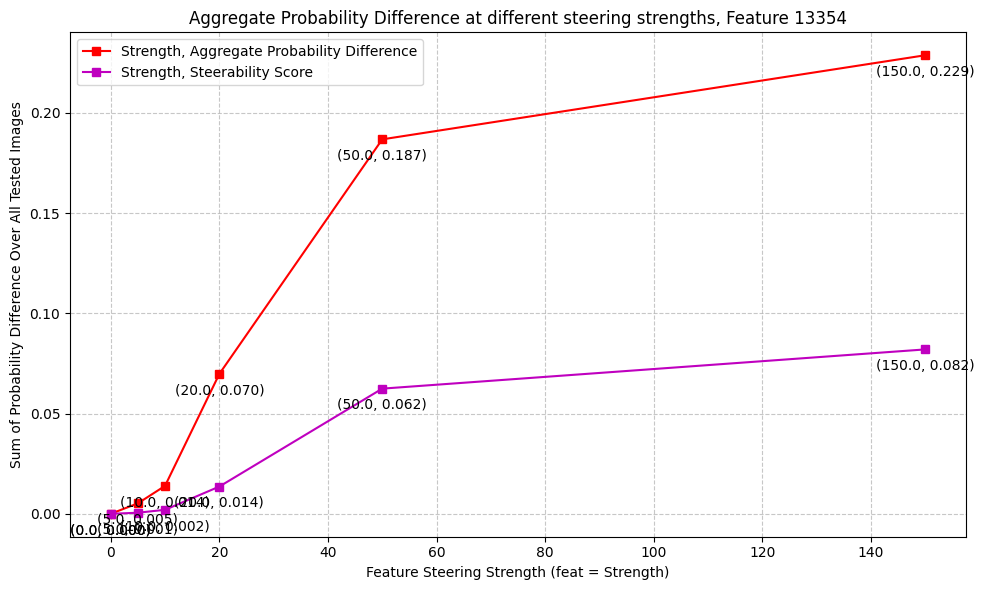

13354
150.0 ['panel' 'board' 'display' 'boards' 'displays' 'phones' 'instruments'
 'dolls' 'awards' 'tools']
150.0 probs tensor([0.2097, 0.1534, 0.0329, 0.0279, 0.0175, 0.0163, 0.0163, 0.0153, 0.0150,
        0.0147], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0523, 0.0226, 0.0010, 0.0006, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['panel' 'board' 'display' 'boards' 'dolls' 'displays' 'awards' 'award'
 'instruments' 'window']


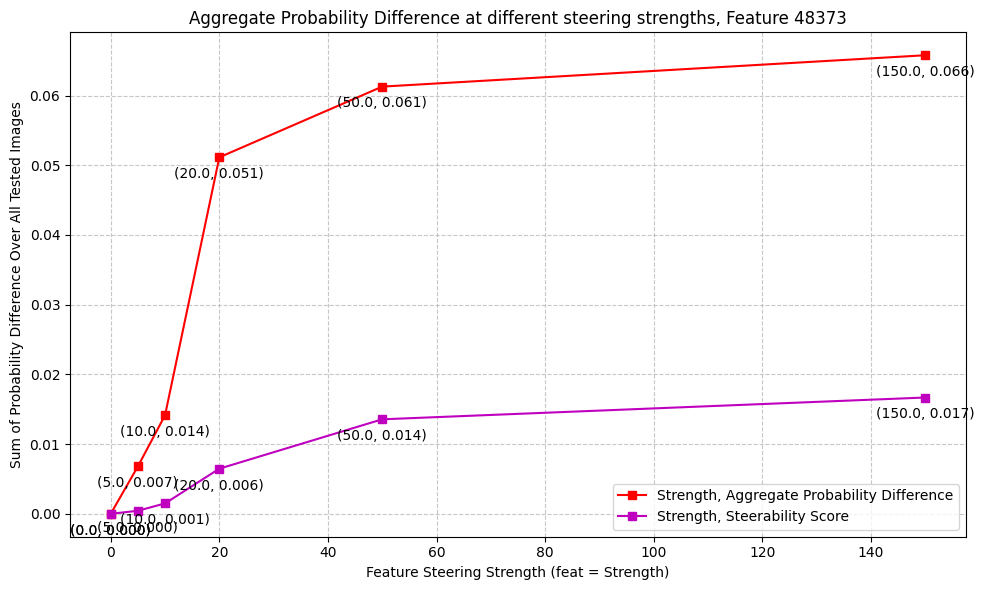

48373
150.0 ['cap' 'hat' 'pan' 'newsletters' 'aluminum' 'outdoor' 'bell' 'deck' 'cup'
 'oregon']
150.0 probs tensor([0.0587, 0.0430, 0.0376, 0.0331, 0.0316, 0.0290, 0.0164, 0.0143, 0.0141,
        0.0117], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0043, 0.0025, 0.0018, 0.0012, 0.0011, 0.0008, 0.0003, 0.0002, 0.0002,
        0.0002])
['cap' 'hat' 'pan' 'newsletters' 'aluminum' 'outdoor' 'bell' 'cup' 'deck'
 'compact']


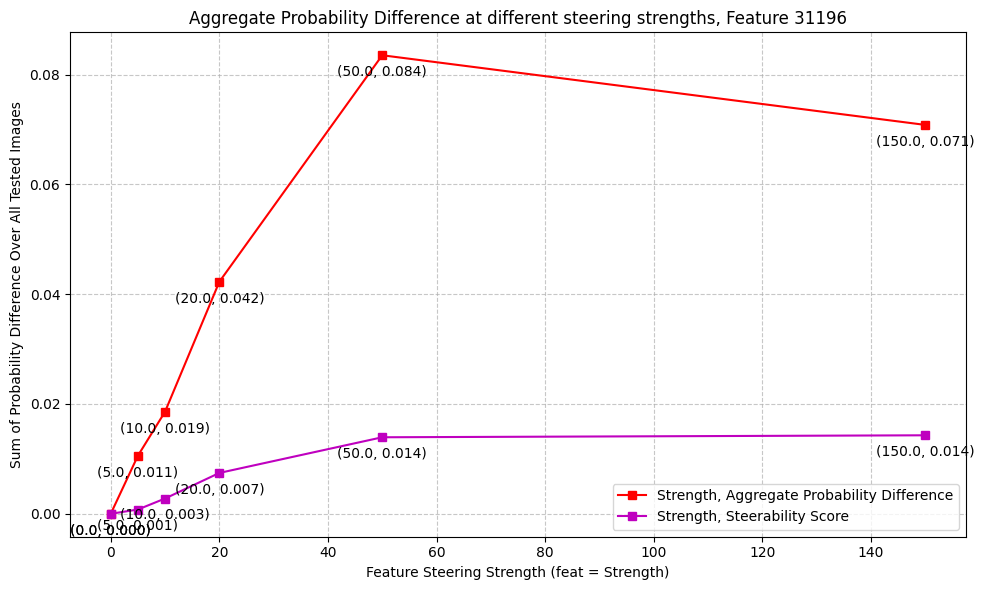

31196
150.0 ['massage' 'cooking' 'recipes' 'ingredients' 'chairs' 'recipe' 'receipt'
 'helping' 'chair' 'arm']
150.0 probs tensor([0.0704, 0.0346, 0.0296, 0.0294, 0.0291, 0.0236, 0.0179, 0.0162, 0.0123,
        0.0120], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0050, 0.0011, 0.0010, 0.0010, 0.0006, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0001])
['massage' 'cooking' 'chairs' 'recipes' 'ingredients' 'recipe' 'receipt'
 'chair' 'helping' 'arm']


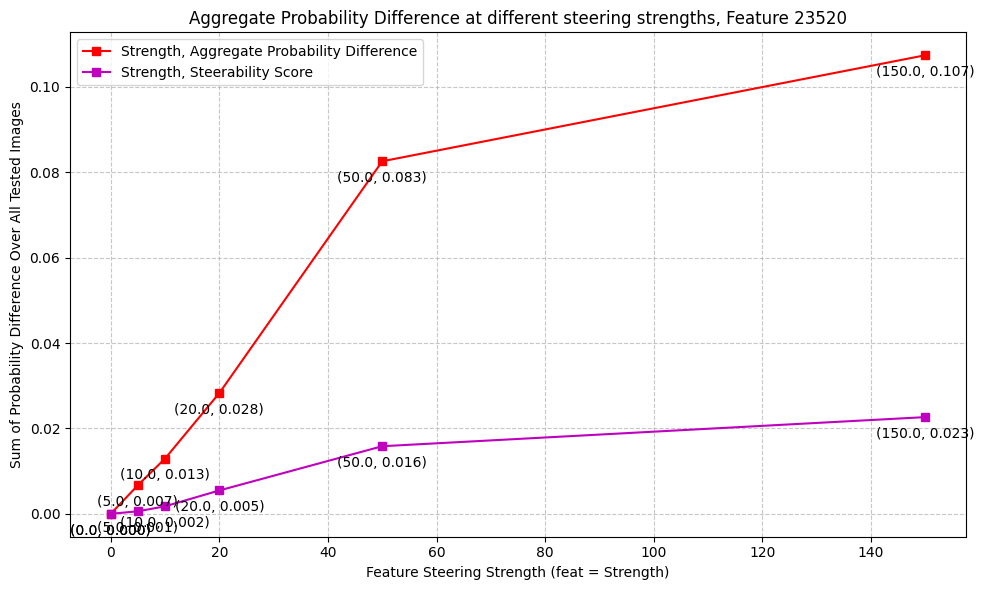

23520
150.0 ['bottle' 'jacket' 'purple' 'supplies' 'chest' 'wings' 'dress' 'vendor'
 'cape' 'vendors']
150.0 probs tensor([0.1075, 0.0500, 0.0313, 0.0240, 0.0225, 0.0215, 0.0181, 0.0169, 0.0161,
        0.0160], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0115, 0.0028, 0.0007, 0.0007, 0.0005, 0.0005, 0.0004, 0.0004, 0.0002,
        0.0002])
['bottle' 'jacket' 'purple' 'dress' 'wings' 'chest' 'supplies' 'cape'
 'vendors' 'vendor']


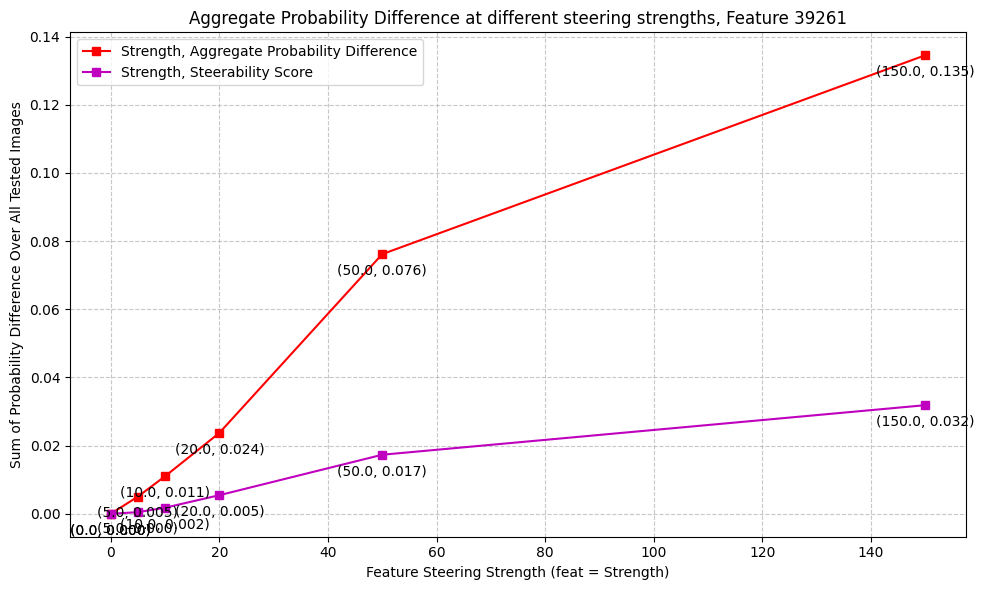

39261
150.0 ['sign' 'outdoor' 'aluminum' 'front' 'cialis' 'presentation'
 'advertisement' 'rc' 'event' 'phentermine']
150.0 probs tensor([0.1767, 0.0502, 0.0426, 0.0356, 0.0332, 0.0228, 0.0206, 0.0139, 0.0126,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0181, 0.0026, 0.0022, 0.0015, 0.0013, 0.0010, 0.0004, 0.0002, 0.0002,
        0.0002])
['sign' 'outdoor' 'aluminum' 'front' 'cialis' 'presentation'
 'advertisement' 'event' 'phentermine' 'rc']


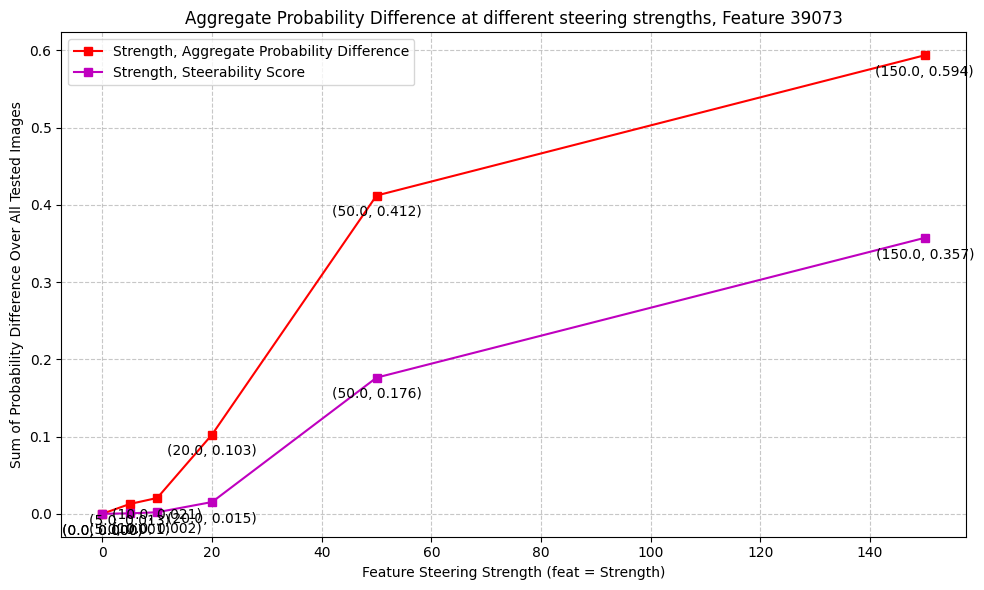

39073
150.0 ['stainless' 'vat' 'filter' 'preparation' 'cooking' 'filters' 'hotels'
 'procedures' 'er' 'shots']
150.0 probs tensor([0.6330, 0.0265, 0.0156, 0.0133, 0.0095, 0.0080, 0.0067, 0.0040, 0.0039,
        0.0039], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.5237e-01, 9.9407e-04, 4.0732e-04, 2.1464e-04, 1.0373e-04, 1.0365e-04,
        5.0101e-05, 2.3481e-05, 1.6606e-05, 1.6130e-05])
['stainless' 'vat' 'filter' 'preparation' 'cooking' 'filters' 'hotels'
 'procedures' 'shots' 'dot']


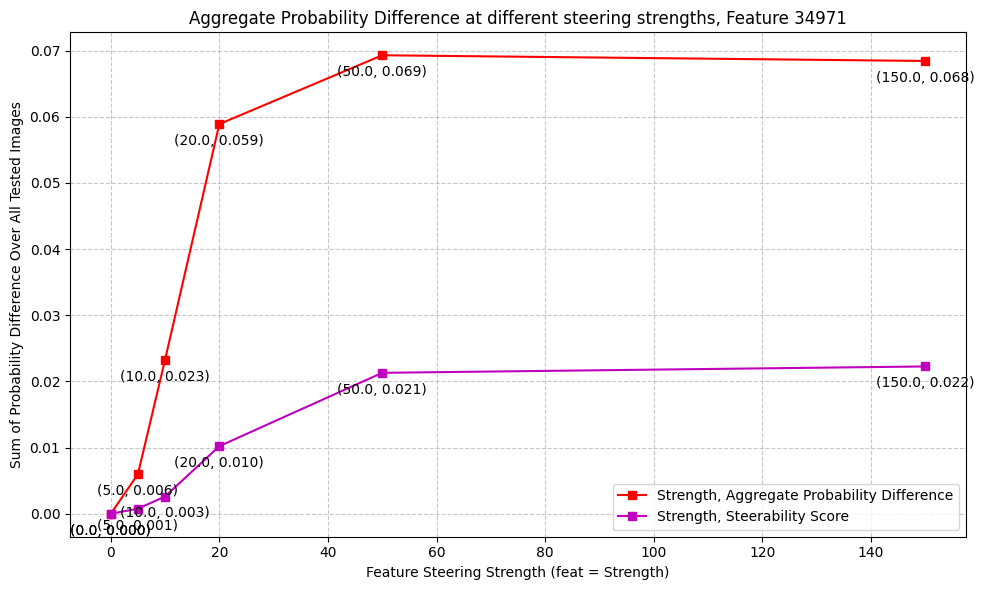

34971
150.0 ['mississippi' 'lawrence' 'kerry' 'sec' 'president' 'carolina' 'belt'
 'bills' 'senate' 'alabama']
150.0 probs tensor([0.0653, 0.0595, 0.0572, 0.0439, 0.0432, 0.0372, 0.0366, 0.0215, 0.0209,
        0.0180], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0047, 0.0032, 0.0028, 0.0022, 0.0019, 0.0012, 0.0004, 0.0004, 0.0004,
        0.0003])
['lawrence' 'kerry' 'president' 'mississippi' 'sec' 'carolina' 'belt'
 'senate' 'bills' 'chief']


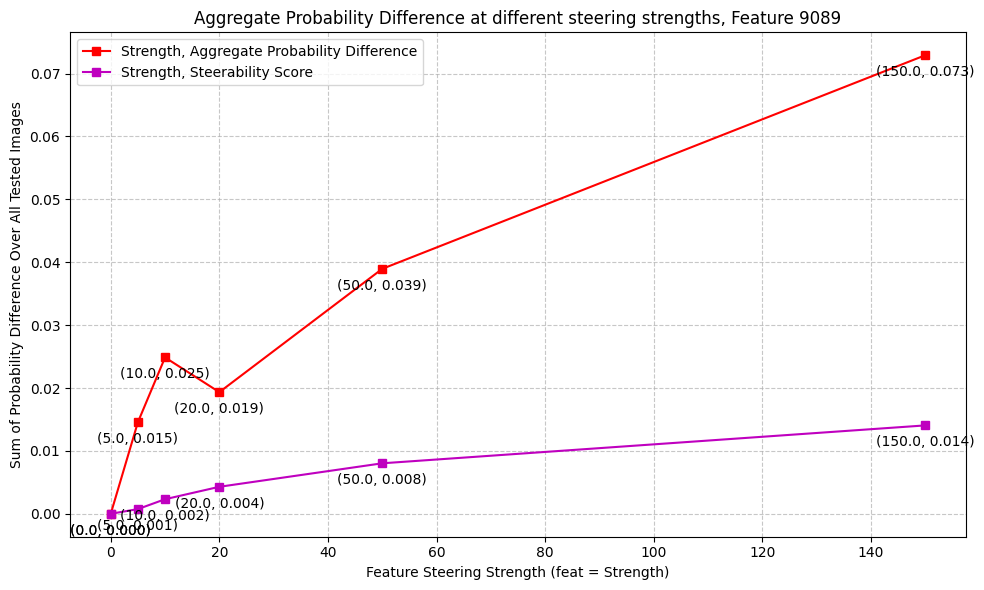

9089
150.0 ['door' 'doors' 'chest' 'brothers' 'lock' 'bb' 'puzzle' 'wooden' 'brother'
 'established']
150.0 probs tensor([0.0756, 0.0570, 0.0291, 0.0242, 0.0229, 0.0213, 0.0173, 0.0106, 0.0096,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.3161e-03, 2.9293e-03, 7.8107e-04, 3.6745e-04, 3.5245e-04, 3.0736e-04,
        2.4601e-04, 1.2385e-04, 8.5898e-05, 6.8794e-05])
['door' 'doors' 'chest' 'brothers' 'bb' 'lock' 'puzzle' 'wooden' 'brother'
 'hundred']


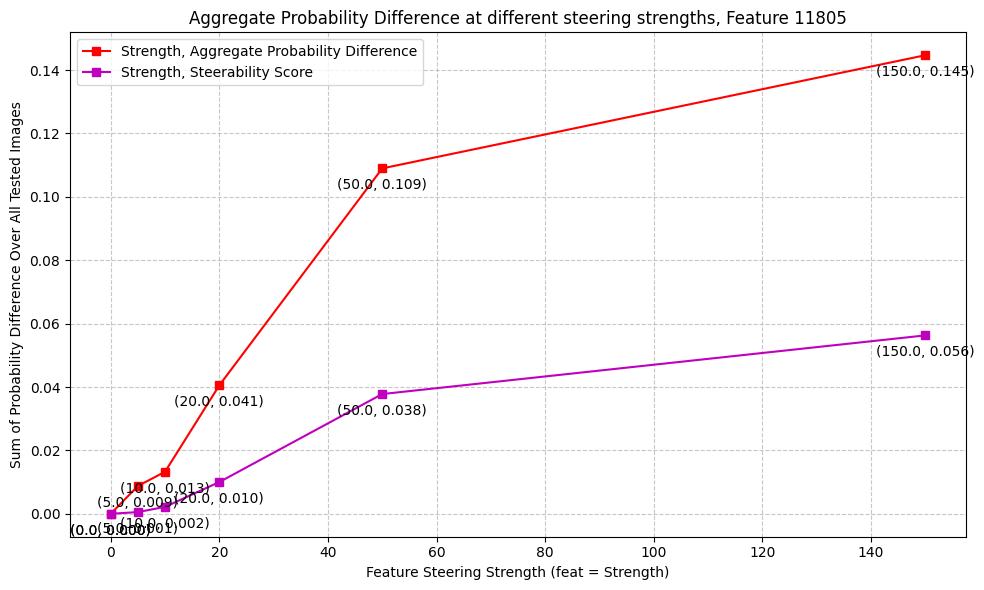

11805
150.0 ['gray' 'grey' 'singapore' 'manchester' 'louisiana' 'purple' 'orlando'
 'chicago' 'cleveland' 'houston']
150.0 probs tensor([0.1511, 0.1397, 0.0766, 0.0754, 0.0416, 0.0364, 0.0305, 0.0295, 0.0293,
        0.0182], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0209, 0.0146, 0.0094, 0.0029, 0.0013, 0.0012, 0.0009, 0.0008, 0.0004,
        0.0004])
['gray' 'grey' 'manchester' 'singapore' 'louisiana' 'purple' 'cleveland'
 'chicago' 'orlando' 'houston']


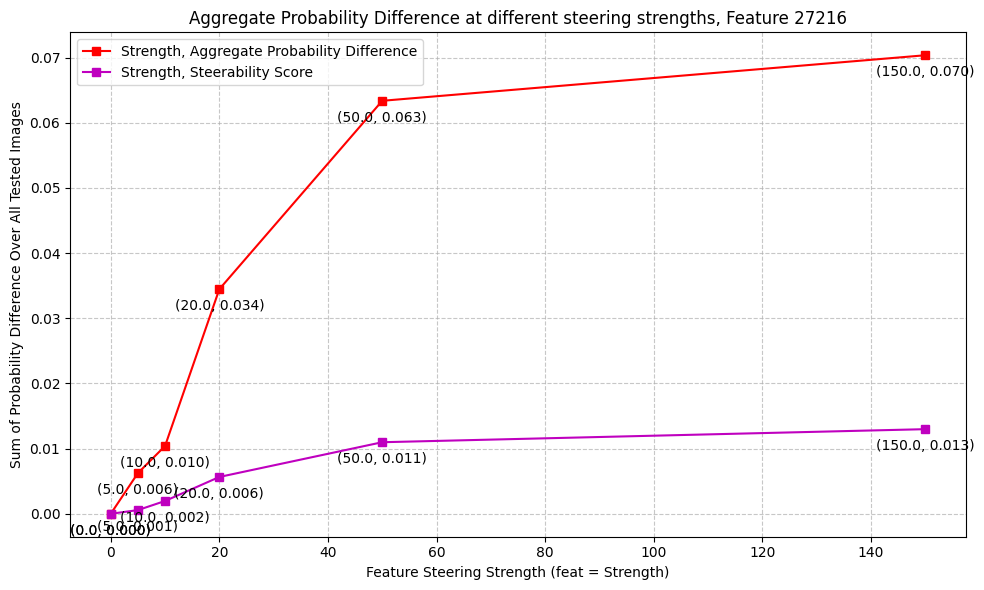

27216
150.0 ['install' 'adapter' 'oil' 'patches' 'pin' 'zip' 'liquid' 'tool' 'patch'
 'social']
150.0 probs tensor([0.0710, 0.0401, 0.0357, 0.0245, 0.0199, 0.0161, 0.0146, 0.0141, 0.0133,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0049, 0.0017, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['install' 'adapter' 'oil' 'pin' 'patches' 'zip' 'liquid' 'tool' 'patch'
 'social']


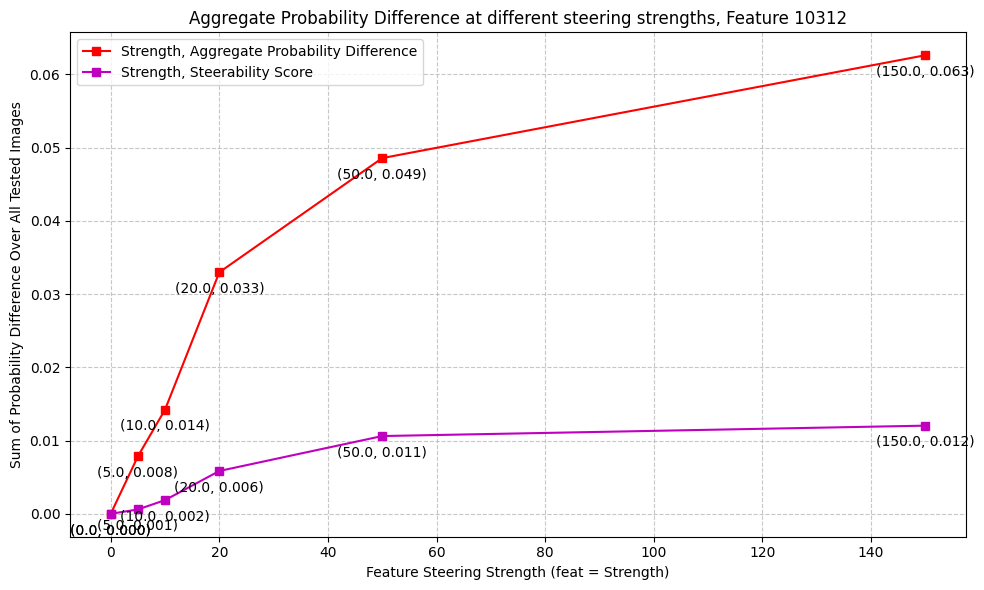

10312
150.0 ['arizona' 'appendix' 'zip' 'notebooks' 'apache' 'brown' 'cvs' 'portland'
 'utah' 'journals']
150.0 probs tensor([0.0720, 0.0315, 0.0263, 0.0239, 0.0230, 0.0225, 0.0221, 0.0197, 0.0163,
        0.0158], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0039, 0.0006, 0.0006, 0.0006, 0.0005, 0.0005, 0.0005, 0.0004, 0.0002,
        0.0002])
['arizona' 'appendix' 'notebooks' 'portland' 'zip' 'brown' 'apache' 'cvs'
 'journals' 'utah']


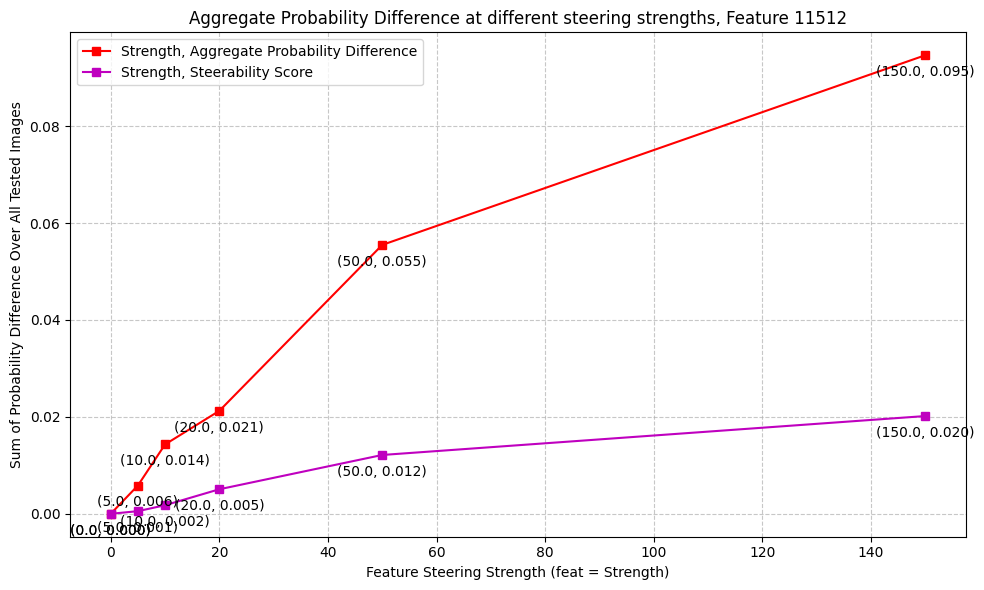

11512
150.0 ['trees' 'prints' 'boats' 'ships' 'stands' 'mens' 'frames' 'fans' 'picks'
 'kings']
150.0 probs tensor([0.0762, 0.0488, 0.0431, 0.0417, 0.0401, 0.0338, 0.0191, 0.0173, 0.0141,
        0.0135], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0090, 0.0018, 0.0013, 0.0012, 0.0008, 0.0008, 0.0004, 0.0004, 0.0002,
        0.0002])
['trees' 'prints' 'stands' 'ships' 'boats' 'mens' 'fans' 'frames' 'picks'
 'faces']


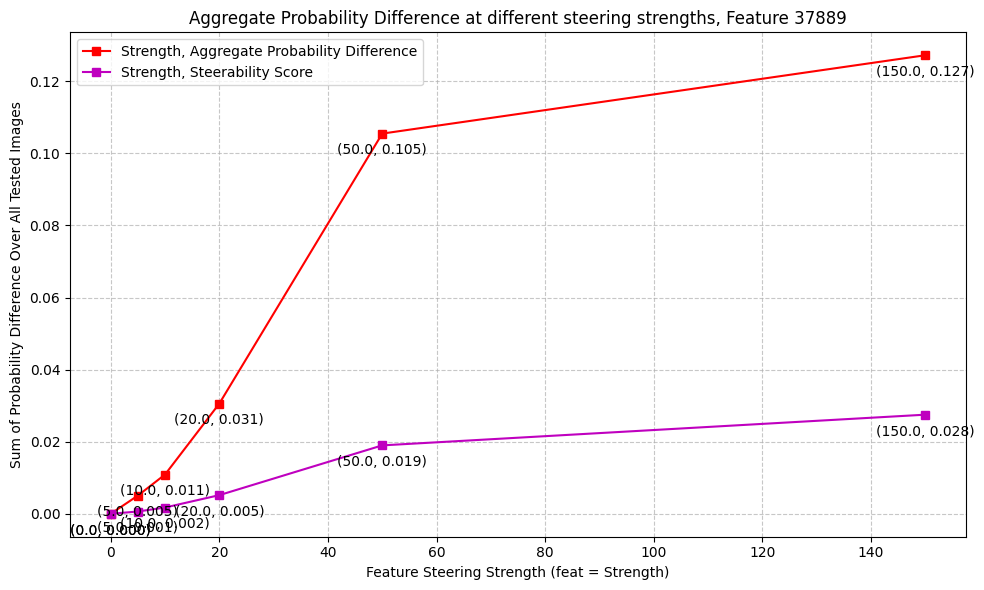

37889
150.0 ['quarter' 'credits' 'donald' 'patch' 'publication' 'coins' 'isbn'
 'download' 'albums' 'covers']
150.0 probs tensor([0.1456, 0.0641, 0.0298, 0.0229, 0.0202, 0.0191, 0.0163, 0.0132, 0.0119,
        0.0090], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.6189e-02, 4.2983e-03, 7.4694e-04, 5.0939e-04, 4.7599e-04, 3.4680e-04,
        2.6727e-04, 1.9065e-04, 1.2276e-04, 7.8291e-05])
['quarter' 'credits' 'donald' 'publication' 'patch' 'isbn' 'download'
 'coins' 'albums' 'postage']


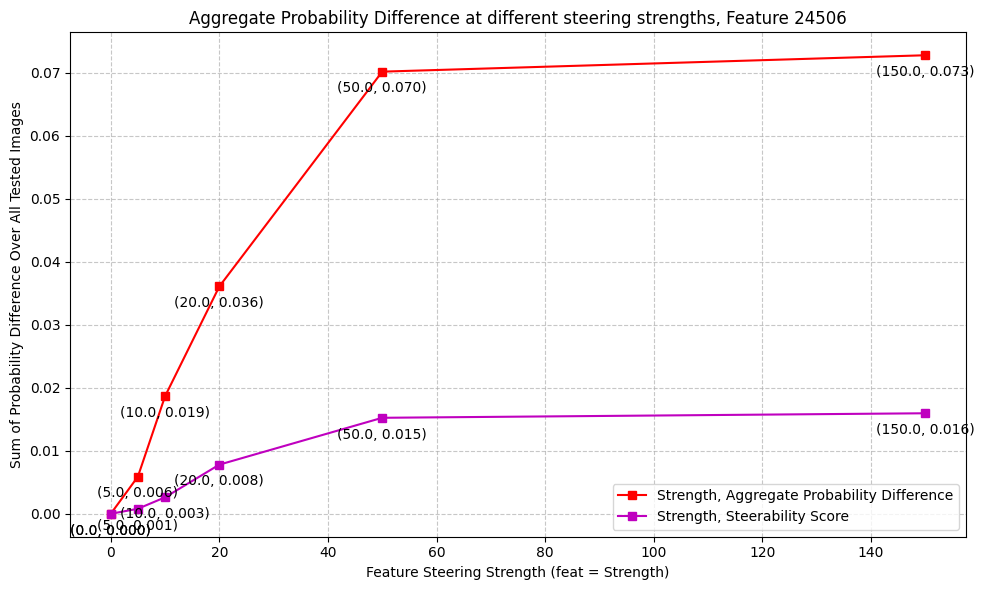

24506
150.0 ['lawrence' 'harry' 'gap' 'pull' 'common' 'j' 'narrow' 'pants' 'clothes'
 'clark']
150.0 probs tensor([0.0673, 0.0537, 0.0405, 0.0219, 0.0219, 0.0210, 0.0184, 0.0116, 0.0109,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0053, 0.0025, 0.0017, 0.0005, 0.0005, 0.0005, 0.0003, 0.0001, 0.0001,
        0.0001])
['lawrence' 'harry' 'gap' 'common' 'pull' 'narrow' 'j' 'clothes' 'clark'
 'tom']


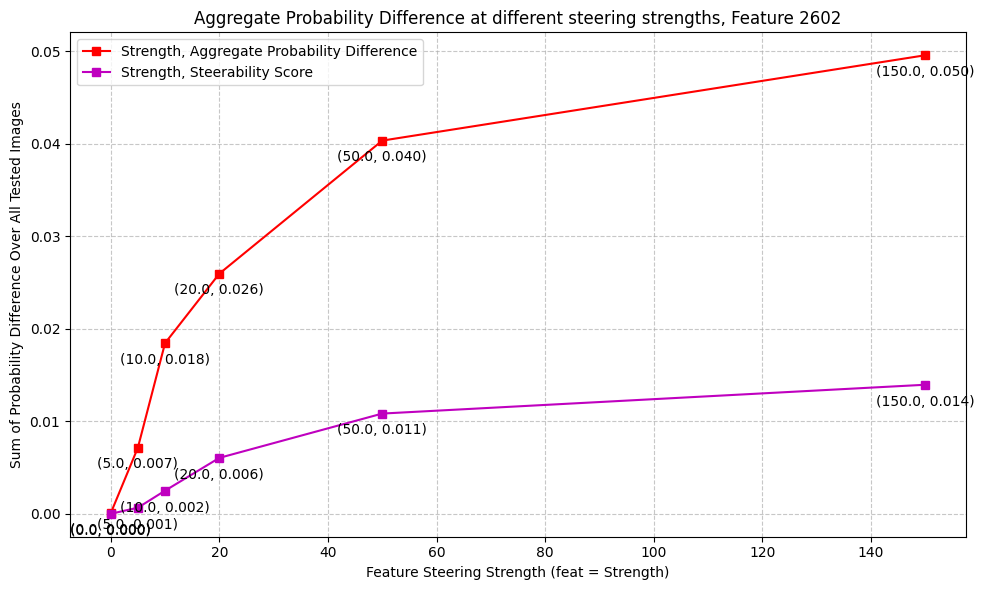

2602
150.0 ['award' 'figure' 'template' 'templates' 'ibm' 'tobacco' 'felt' 'paper'
 'binding' 'intel']
150.0 probs tensor([0.0473, 0.0395, 0.0392, 0.0351, 0.0271, 0.0240, 0.0213, 0.0193, 0.0179,
        0.0175], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0025, 0.0018, 0.0012, 0.0010, 0.0009, 0.0008, 0.0004, 0.0004, 0.0003,
        0.0003])
['award' 'figure' 'template' 'templates' 'tobacco' 'ibm' 'felt' 'paper'
 'intel' 'binding']


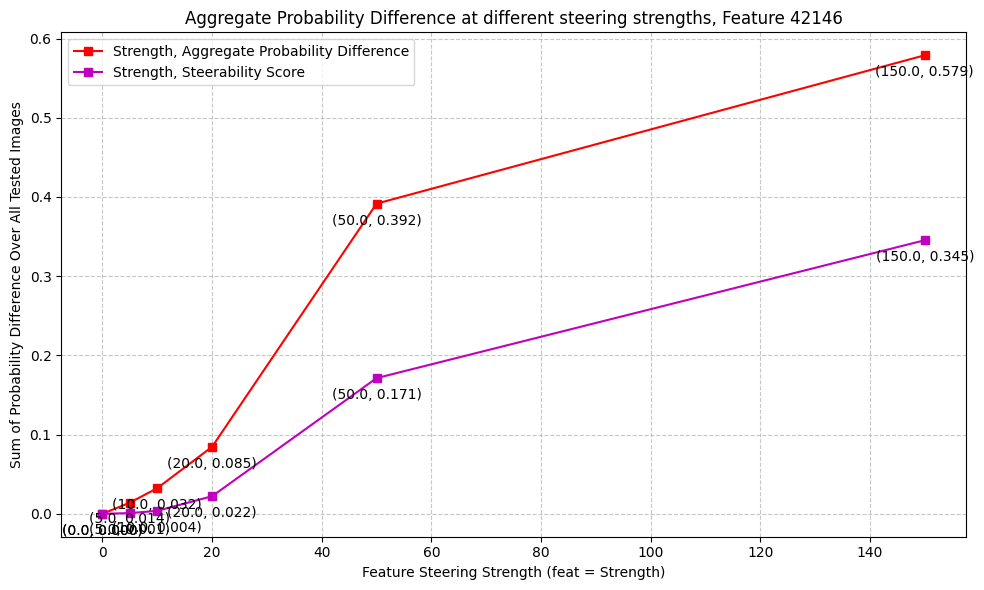

42146
150.0 ['belt' 'bondage' 'shorts' 'leg' 'pants' 'lock' 'boot' 'door' 'chain'
 'arm']
150.0 probs tensor([0.6868, 0.0426, 0.0311, 0.0244, 0.0195, 0.0180, 0.0165, 0.0086, 0.0056,
        0.0056], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.3514e-01, 3.1689e-03, 1.2839e-03, 1.1890e-03, 5.1962e-04, 4.7164e-04,
        4.7100e-04, 1.6562e-04, 6.6515e-05, 4.9299e-05])
['belt' 'bondage' 'shorts' 'leg' 'pants' 'boot' 'lock' 'door' 'arm'
 'chest']


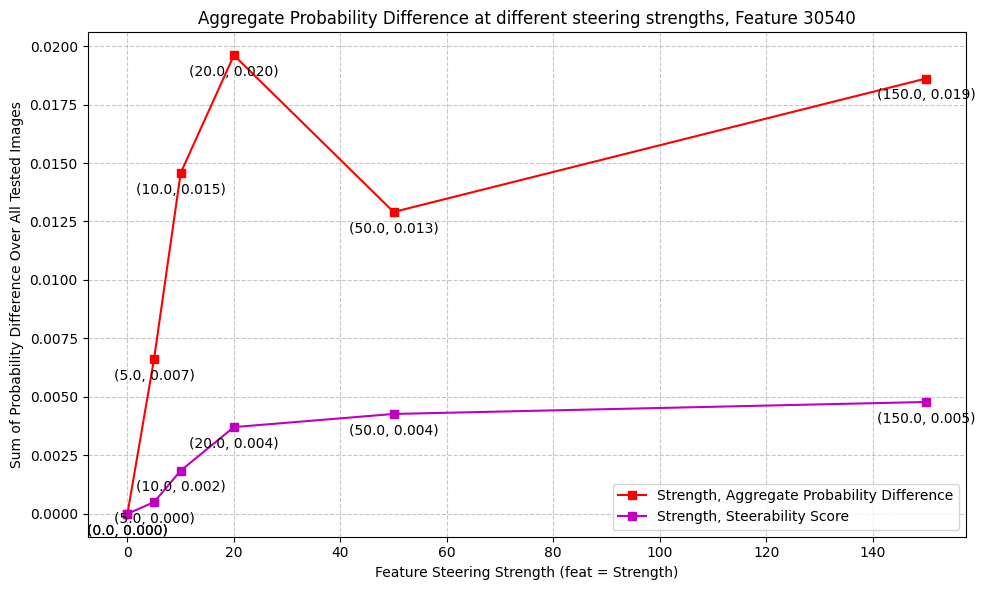

30540
150.0 ['paragraph' 'implementing' 'printable' 'oh' 'math' 'cute' 'tips' 'fourth'
 'learn' 'using']
150.0 probs tensor([0.0301, 0.0098, 0.0095, 0.0082, 0.0080, 0.0078, 0.0078, 0.0077, 0.0065,
        0.0064], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.4648e-04, 1.0655e-04, 9.9777e-05, 7.6233e-05, 6.8693e-05, 5.3069e-05,
        5.0327e-05, 4.9179e-05, 4.4307e-05, 4.3144e-05])
['paragraph' 'implementing' 'printable' 'tips' 'oh' 'pink' 'fourth'
 'learn' 'using' 'math']


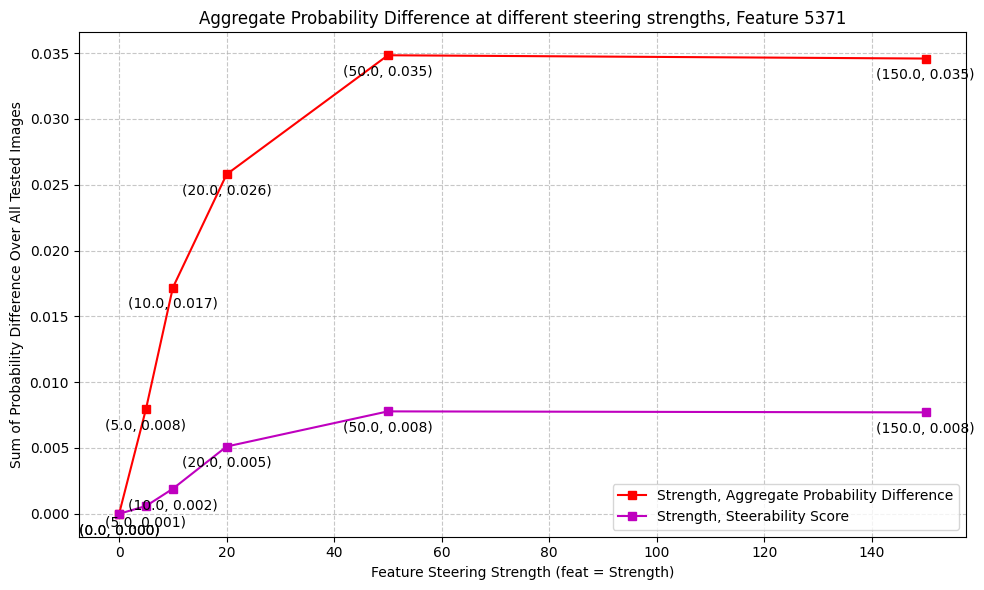

5371
150.0 ['pollution' 'rack' 'rentals' 'africa' 'yellow' 'promotions' 'rc'
 'african' 'used' 'usr']
150.0 probs tensor([0.0376, 0.0302, 0.0205, 0.0173, 0.0166, 0.0157, 0.0136, 0.0124, 0.0110,
        0.0107], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0012, 0.0006, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['rack' 'pollution' 'rentals' 'yellow' 'promotions' 'africa' 'rc' 'usr'
 'used' 'multimedia']


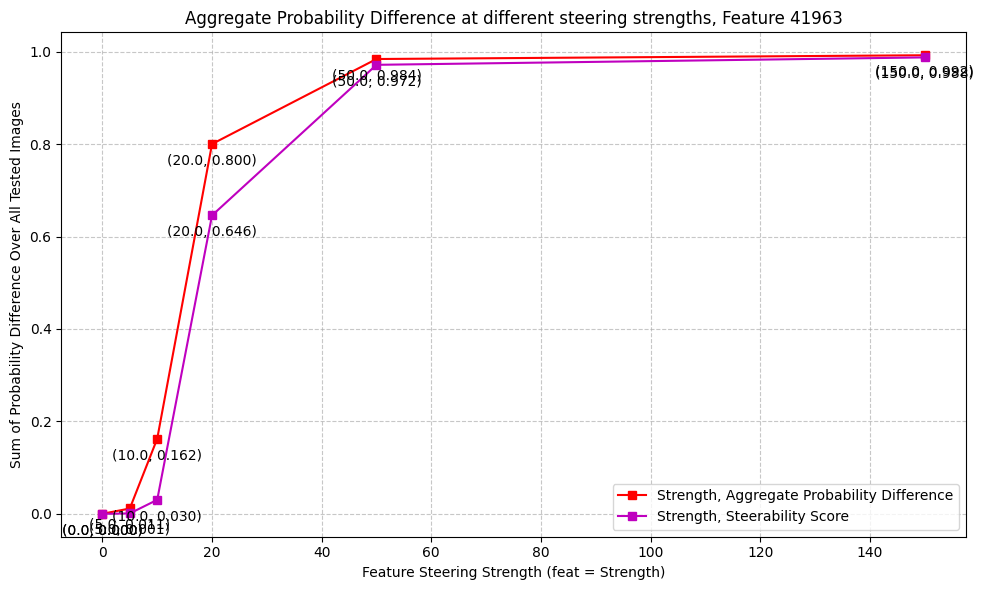

41963
150.0 ['roof' 'covered' 'structural' 'structure' 'structures' 'interior' 'sky'
 'architecture' 'pattern' 'up']
150.0 probs tensor([9.9449e-01, 1.2108e-03, 1.0602e-03, 8.0030e-04, 4.1196e-04, 1.7443e-04,
        1.7173e-04, 1.4804e-04, 1.2663e-04, 5.6631e-05], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.8499e-01, 1.6719e-06, 2.9084e-08, 2.6216e-08, 1.3579e-08, 1.1263e-08,
        6.8884e-09, 7.1348e-10, 1.9964e-10, 1.4516e-10])
['roof' 'covered' 'structures' 'architecture' 'sky' 'structure' 'pattern'
 'lighting' 'text' 'concrete']


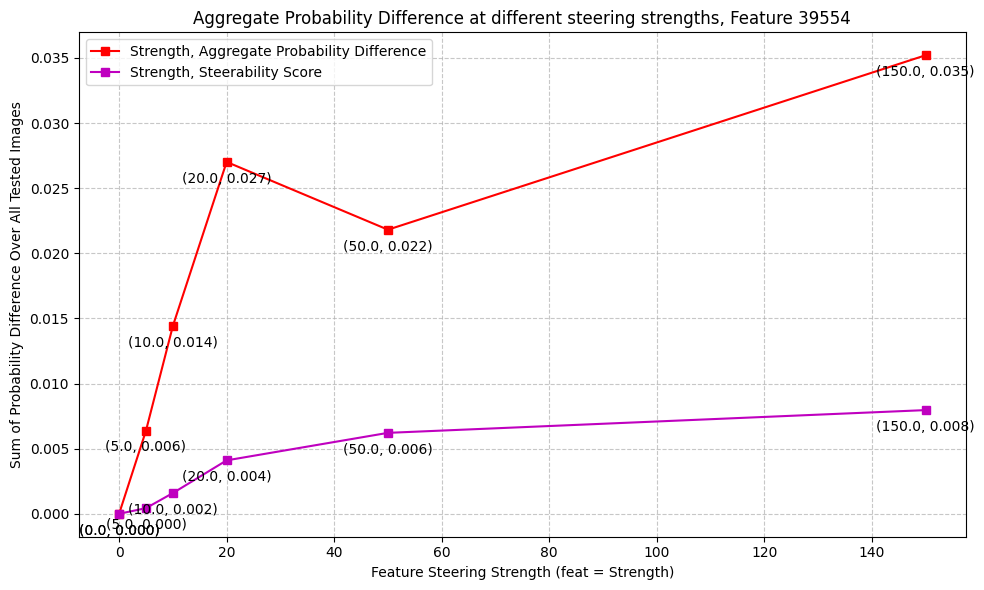

39554
150.0 ['card' 'sizes' 'configuration' 'template' 'templates' 'comfortable'
 'recommendation' 'garage' 'sitting' 'build']
150.0 probs tensor([0.0333, 0.0325, 0.0293, 0.0242, 0.0155, 0.0153, 0.0142, 0.0086, 0.0084,
        0.0077], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2398e-03, 1.0275e-03, 5.2532e-04, 4.4782e-04, 3.0625e-04, 2.6614e-04,
        1.8966e-04, 7.3359e-05, 6.2114e-05, 5.9388e-05])
['card' 'sizes' 'configuration' 'template' 'recommendation' 'comfortable'
 'templates' 'sitting' 'consolidation' 'garage']


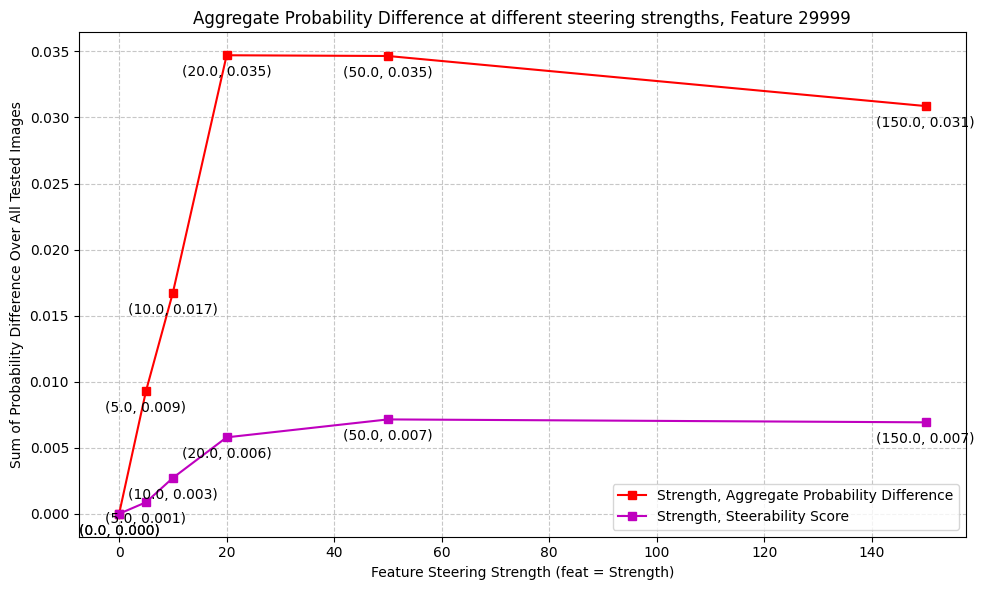

29999
150.0 ['indian' 'thumbnail' 'sitting' 'd' 'named' 'tn' 'proposal' 'permalink'
 'watching' 'divorce']
150.0 probs tensor([0.0294, 0.0222, 0.0207, 0.0188, 0.0185, 0.0154, 0.0130, 0.0096, 0.0075,
        0.0075], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.5268e-04, 6.4270e-04, 6.2843e-04, 2.8819e-04, 2.4496e-04, 2.1576e-04,
        1.4066e-04, 8.5233e-05, 6.5206e-05, 5.4469e-05])
['indian' 'thumbnail' 'sitting' 'named' 'tn' 'd' 'proposal' 'permalink'
 'want' 'dating']


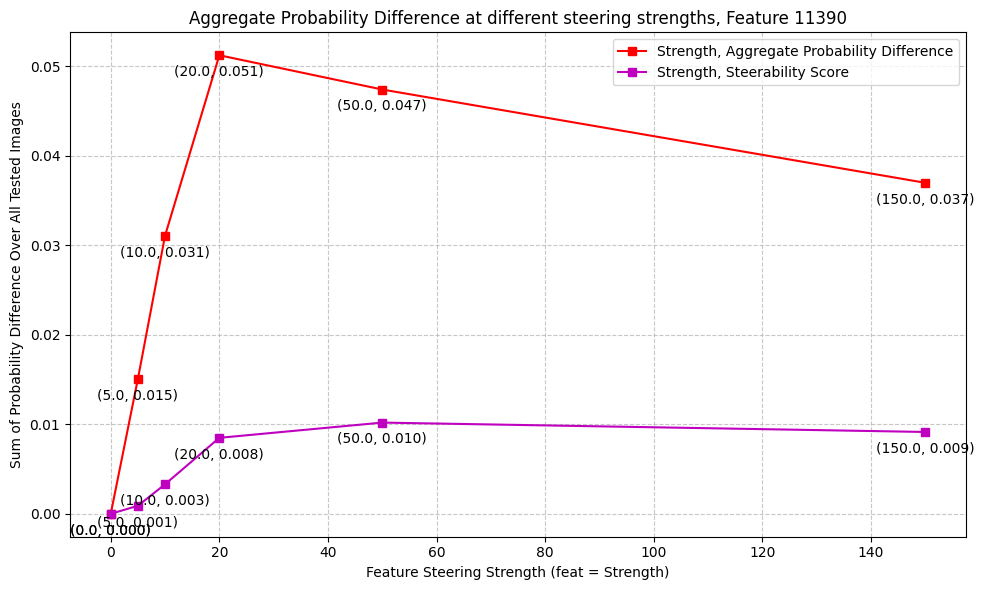

11390
150.0 ['pair' 'arms' 'couple' 'symbol' 'model' 'dish' 'contracts' 'adds' 'of'
 'sharing']
150.0 probs tensor([0.0525, 0.0399, 0.0285, 0.0209, 0.0202, 0.0174, 0.0155, 0.0131, 0.0128,
        0.0125], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0014, 0.0011, 0.0007, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['arms' 'pair' 'couple' 'model' 'dish' 'symbol' 'contracts' 'models'
 'adds' 'of']


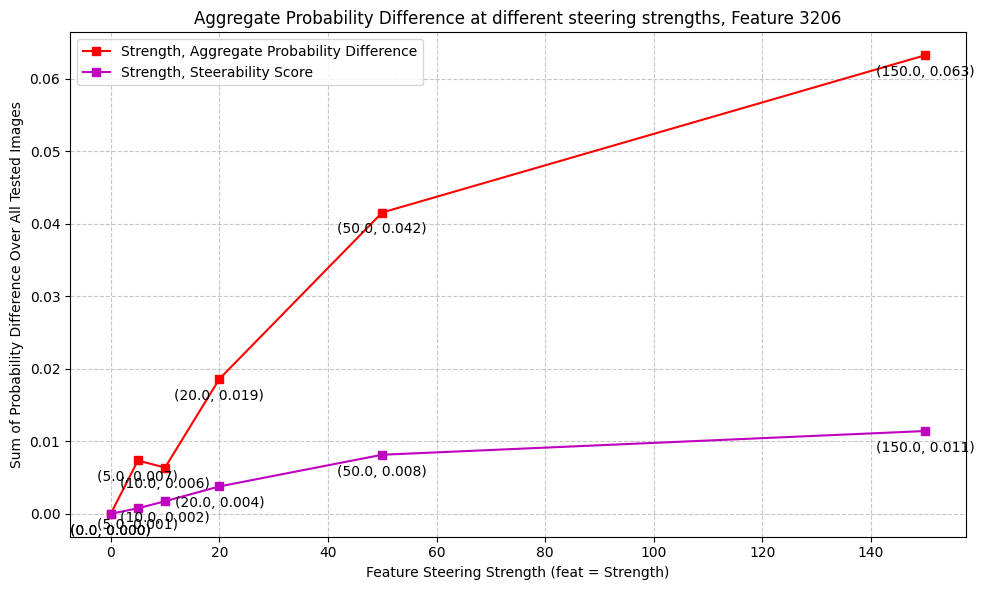

3206
150.0 ['watch' 'mining' 'watches' 'quarter' 'aluminum' 'copyright' 'patent'
 'cotton' 'pearl' 'letter']
150.0 probs tensor([0.0797, 0.0451, 0.0284, 0.0186, 0.0165, 0.0118, 0.0118, 0.0111, 0.0104,
        0.0100], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.0003e-03, 1.4962e-03, 5.0056e-04, 3.2629e-04, 2.9189e-04, 1.9891e-04,
        1.2823e-04, 1.1809e-04, 9.7675e-05, 8.5938e-05])
['watch' 'mining' 'watches' 'aluminum' 'quarter' 'cotton' 'patent' 'led'
 'pearl' 'moon']


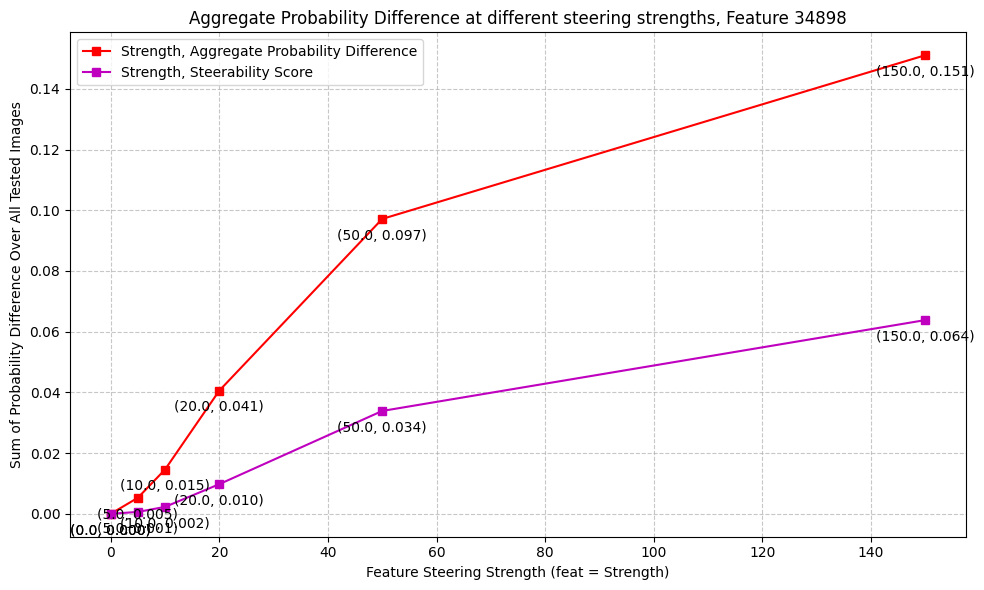

34898
150.0 ['beds' 'bedrooms' 'bed' 'bedroom' 'theater' 'wells' 'theatre' 'forum'
 'press' 'neck']
150.0 probs tensor([0.1764, 0.1619, 0.1062, 0.0555, 0.0471, 0.0467, 0.0426, 0.0180, 0.0176,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0228, 0.0184, 0.0072, 0.0034, 0.0029, 0.0024, 0.0019, 0.0006, 0.0005,
        0.0001])
['bedrooms' 'beds' 'bed' 'theater' 'theatre' 'bedroom' 'wells' 'press'
 'forum' 'de']


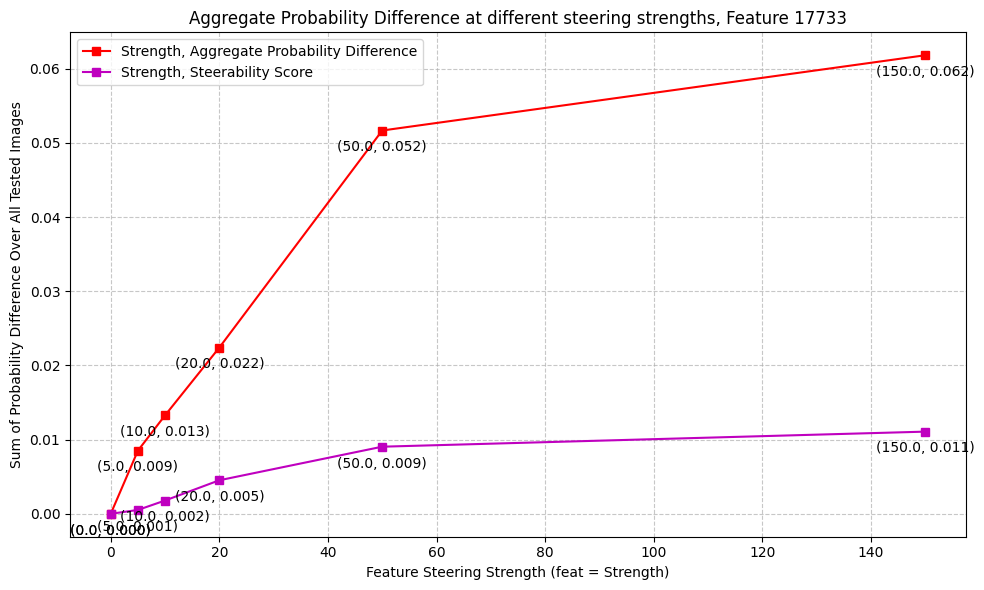

17733
150.0 ['silver' 'button' 'stainless' 'tube' 'aluminum' 'ghost' 'pin' 'gary'
 'paid' 'platinum']
150.0 probs tensor([0.0692, 0.0314, 0.0216, 0.0176, 0.0168, 0.0164, 0.0152, 0.0141, 0.0131,
        0.0123], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0038, 0.0011, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001])
['silver' 'button' 'stainless' 'aluminum' 'ghost' 'pin' 'tube' 'gary'
 'platinum' 'paid']


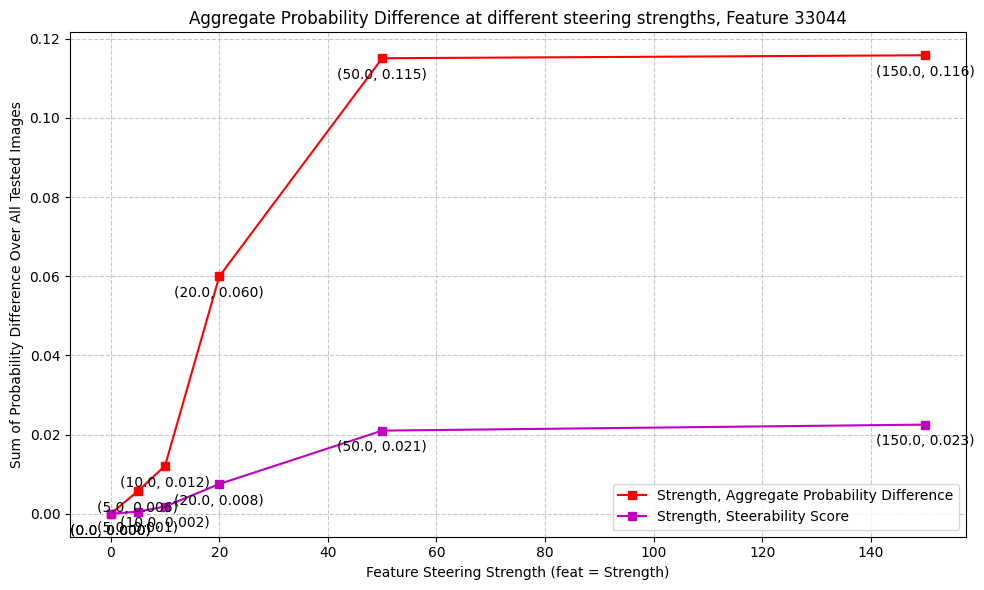

33044
150.0 ['bb' 'anonymous' 'los' 'la' 'nikon' 'mb' 'al' 'wayne' 'smoke' 'marshall']
150.0 probs tensor([0.1285, 0.0612, 0.0179, 0.0157, 0.0144, 0.0117, 0.0106, 0.0089, 0.0085,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.3412e-02, 3.6498e-03, 3.7605e-04, 2.7828e-04, 2.4034e-04, 1.3560e-04,
        1.2217e-04, 1.1614e-04, 9.4684e-05, 7.2000e-05])
['bb' 'anonymous' 'los' 'la' 'nikon' 'wayne' 'mb' 'al' 'marshall' 'au']


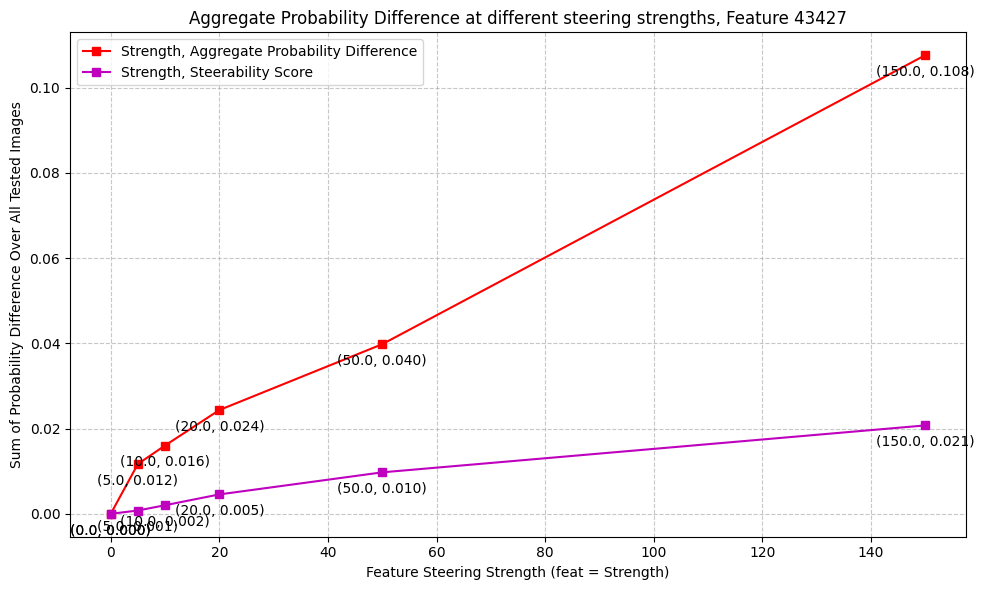

43427
150.0 ['printable' 'horse' 'stamps' 'horses' 'printed' 'seal' 'jersey' 'mouse'
 'paper' 'signed']
150.0 probs tensor([0.1014, 0.0426, 0.0337, 0.0312, 0.0214, 0.0165, 0.0164, 0.0164, 0.0160,
        0.0159], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0116, 0.0017, 0.0010, 0.0007, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['printable' 'horse' 'stamps' 'horses' 'printed' 'paper' 'tobacco' 'mouse'
 'jersey' 'signed']


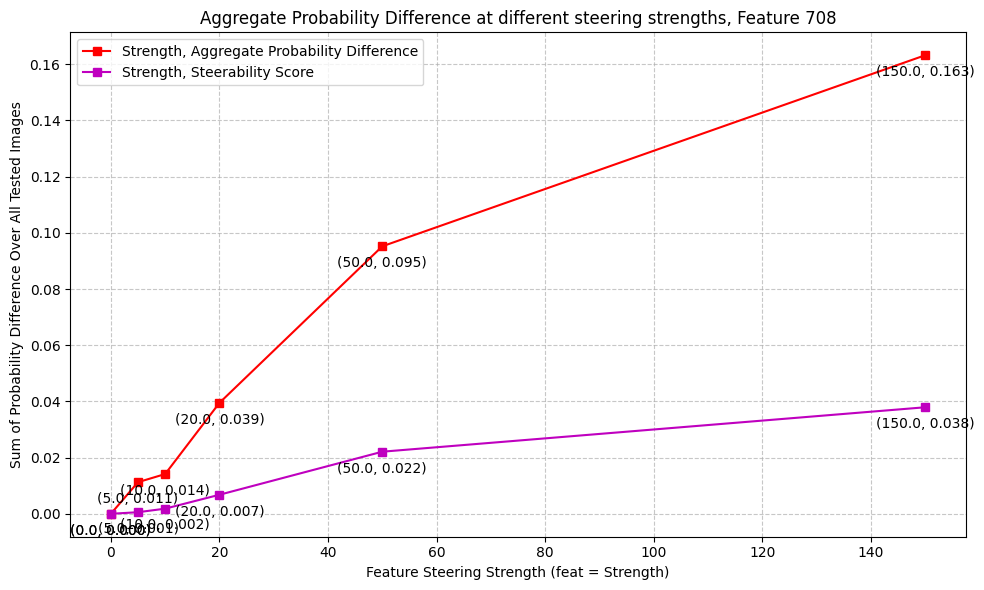

708
150.0 ['womens' 'bills' 'pin' 'banner' 'handle' 'eye' 'cup' 'title' 'rings'
 'brass']
150.0 probs tensor([0.1829, 0.0662, 0.0257, 0.0245, 0.0233, 0.0204, 0.0159, 0.0134, 0.0131,
        0.0126], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0266, 0.0037, 0.0009, 0.0008, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001])
['womens' 'bills' 'pin' 'banner' 'eye' 'cup' 'handle' 'brass' 'title'
 'hand']


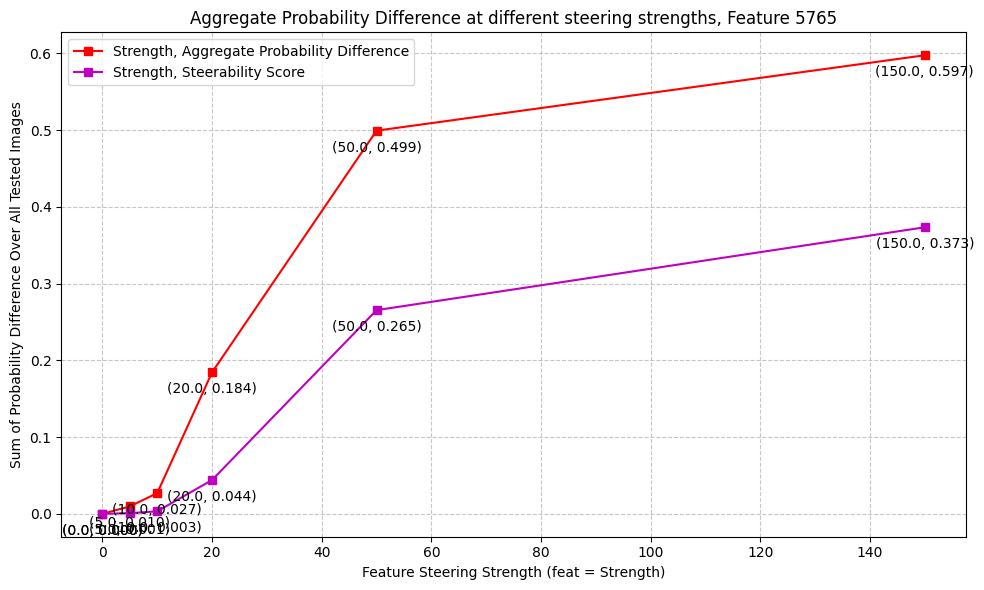

5765
150.0 ['stainless' 'charger' 'appliances' 'aluminum' 'amp' 'ups' 'panasonic'
 'usb' 'pants' 'rack']
150.0 probs tensor([0.6130, 0.0651, 0.0646, 0.0607, 0.0125, 0.0118, 0.0103, 0.0092, 0.0062,
        0.0046], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.5693e-01, 4.6756e-03, 4.5673e-03, 3.6777e-03, 1.8865e-04, 1.5196e-04,
        1.0859e-04, 8.1463e-05, 2.8318e-05, 2.6521e-05])
['stainless' 'aluminum' 'appliances' 'charger' 'amp' 'ups' 'panasonic'
 'usb' 'rack' 'pants']


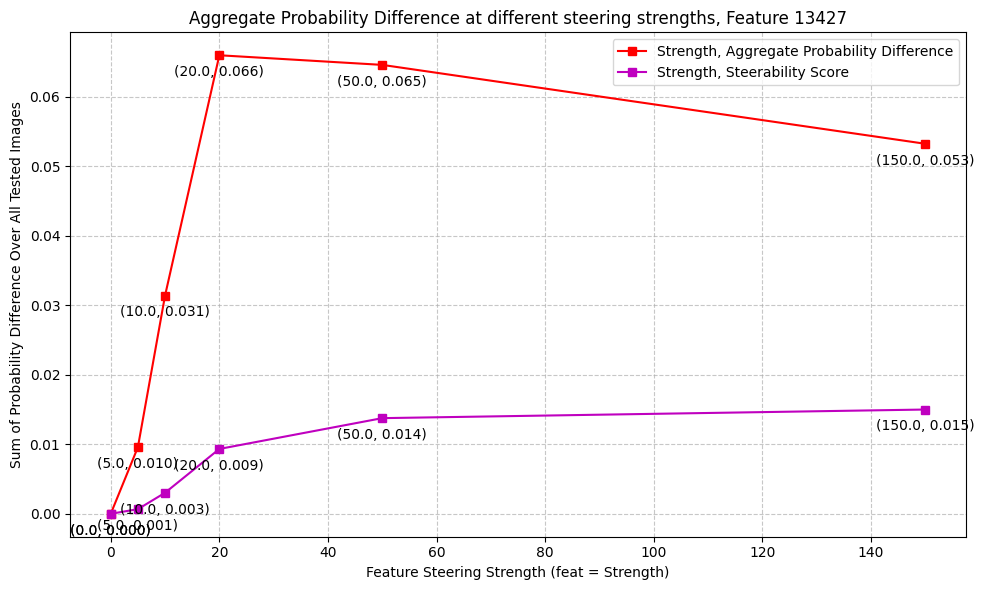

13427
150.0 ['panasonic' 'thumbnail' 'ebony' 'philips' 'epson' 'ink' 'hurricane'
 'charger' 'sf' 'nikon']
150.0 probs tensor([0.0555, 0.0471, 0.0460, 0.0311, 0.0201, 0.0195, 0.0193, 0.0183, 0.0176,
        0.0175], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0028, 0.0026, 0.0020, 0.0009, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003,
        0.0003])
['thumbnail' 'panasonic' 'ebony' 'philips' 'reference' 'epson' 'nikon'
 'night' 'ink' 'hurricane']


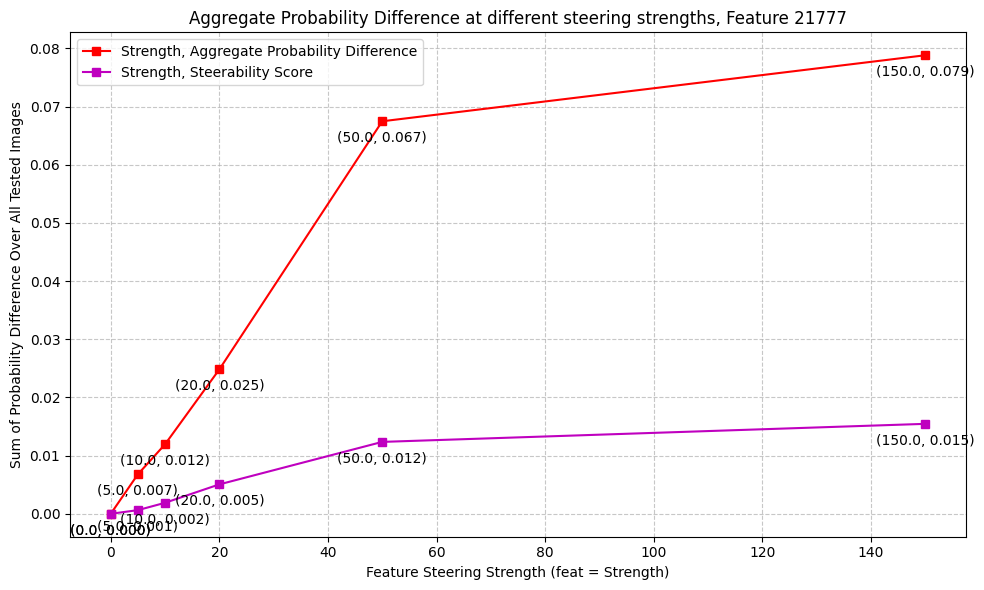

21777
150.0 ['kentucky' 'cart' 'vehicle' 'screen' 'thumbnail' 'georgia' 'ghost' 'snow'
 'iowa' 'front']
150.0 probs tensor([0.0765, 0.0382, 0.0337, 0.0245, 0.0243, 0.0185, 0.0167, 0.0164, 0.0159,
        0.0151], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0062, 0.0014, 0.0008, 0.0008, 0.0006, 0.0003, 0.0003, 0.0003, 0.0002,
        0.0002])
['kentucky' 'cart' 'screen' 'thumbnail' 'vehicle' 'georgia' 'ghost'
 'front' 'iowa' 'snow']


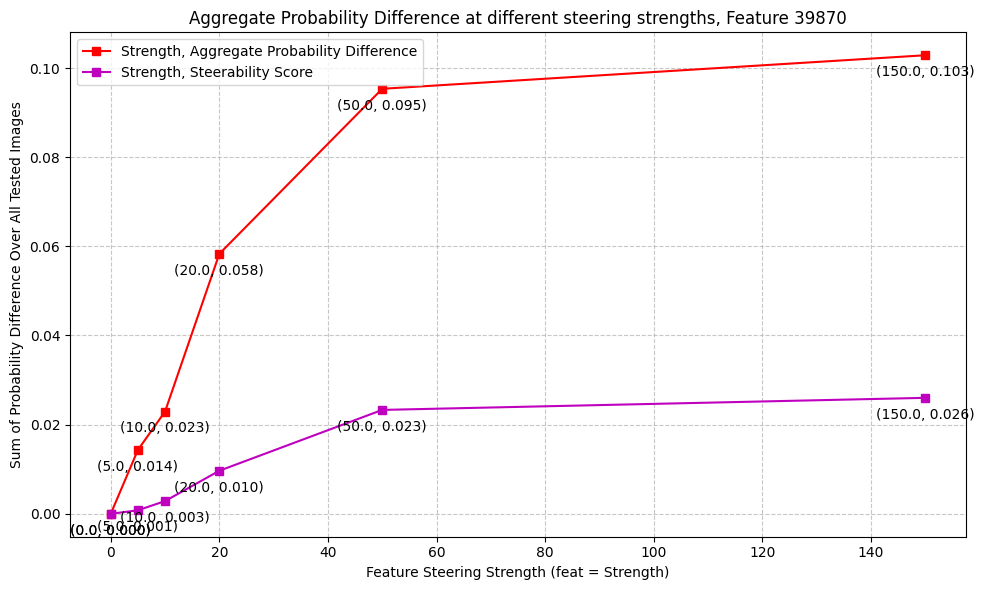

39870
150.0 ['kiss' 'wings' 'fans' 'lincoln' 'front' 'x' 'dallas' 'diamond' 'interior'
 'configuration']
150.0 probs tensor([0.1181, 0.0818, 0.0371, 0.0323, 0.0318, 0.0234, 0.0175, 0.0125, 0.0100,
        0.0097], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0580e-02, 6.9882e-03, 1.9281e-03, 1.1595e-03, 7.8314e-04, 4.8892e-04,
        2.6835e-04, 1.8975e-04, 8.7723e-05, 6.8712e-05])
['kiss' 'wings' 'fans' 'front' 'lincoln' 'x' 'dallas' 'diamond' 'interior'
 'center']


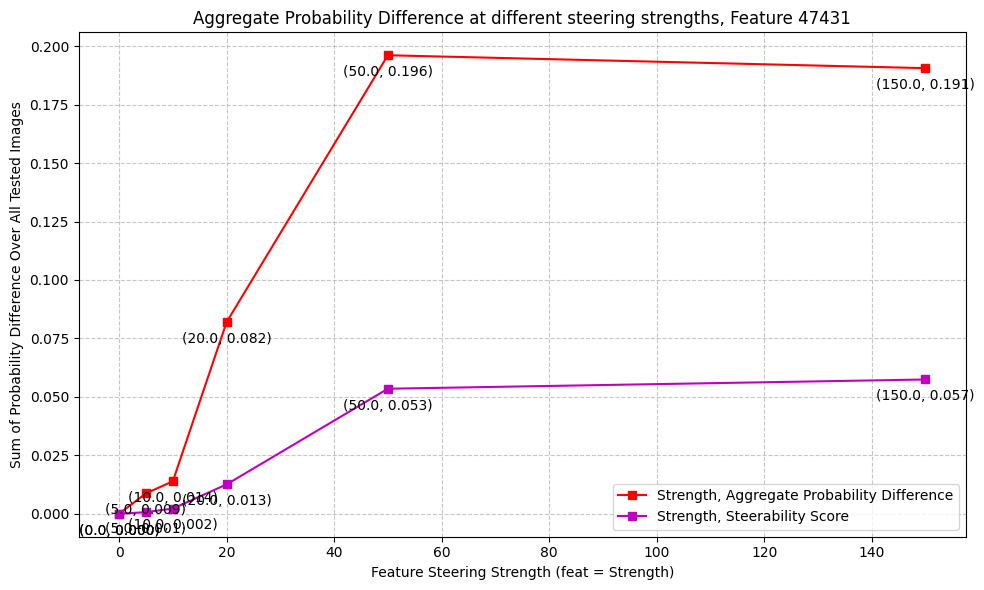

47431
150.0 ['highlights' 'thumbnail' 'hair' 'vintage' 'guitar' 'book' 'chips' 'phone'
 'banner' 'header']
150.0 probs tensor([0.1959, 0.1049, 0.0523, 0.0236, 0.0216, 0.0202, 0.0194, 0.0113, 0.0093,
        0.0089], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.6326e-02, 1.2538e-02, 2.9277e-03, 6.9678e-04, 4.5156e-04, 3.9464e-04,
        3.7528e-04, 9.4041e-05, 9.1623e-05, 8.6534e-05])
['highlights' 'thumbnail' 'hair' 'vintage' 'guitar' 'book' 'chips'
 'header' 'banner' 'phone']


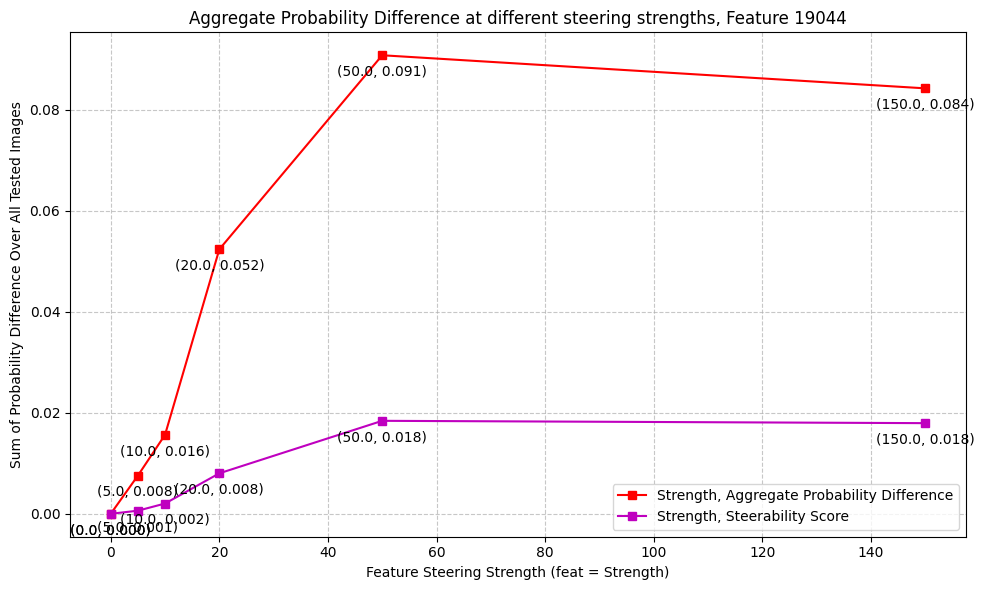

19044
150.0 ['bone' 'rail' 'laser' 'ie' 'monitor' 'xp' 'trailer' 'microsoft' 'bit'
 'bike']
150.0 probs tensor([0.0771, 0.0691, 0.0216, 0.0198, 0.0172, 0.0126, 0.0116, 0.0112, 0.0109,
        0.0103], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([7.1025e-03, 5.1961e-03, 6.9075e-04, 2.9127e-04, 2.0727e-04, 1.2785e-04,
        1.2182e-04, 1.1716e-04, 1.0956e-04, 8.7758e-05])
['bone' 'rail' 'laser' 'monitor' 'ie' 'microsoft' 'xp' 'bit' 'trailer'
 'sd']


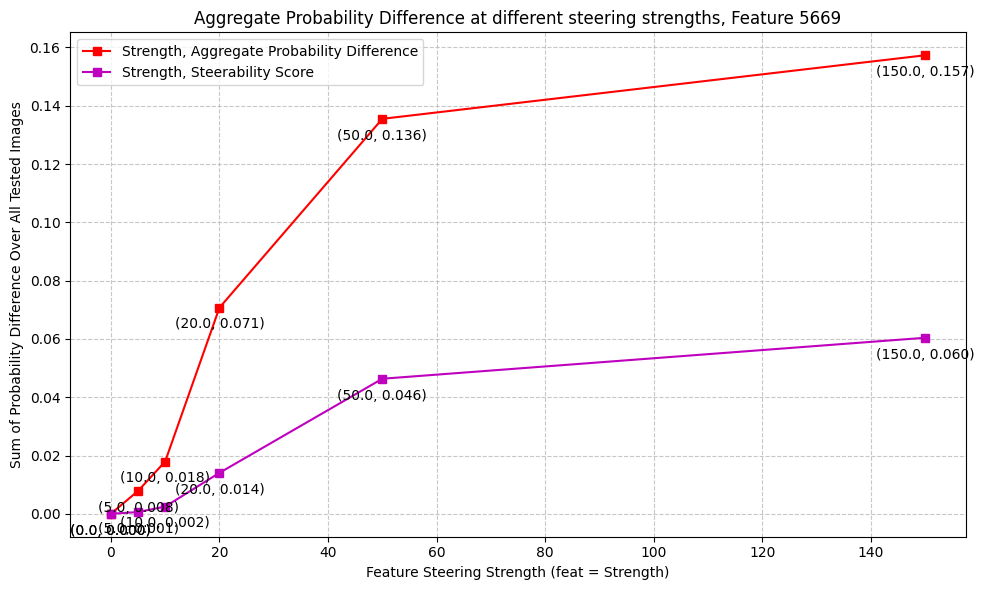

5669
150.0 ['groups' 'figure' 'group' 'resulting' 'are' 'recipe' 'usage' 'part'
 'types' 'formats']
150.0 probs tensor([0.1723, 0.1222, 0.0922, 0.0443, 0.0254, 0.0223, 0.0223, 0.0157, 0.0147,
        0.0125], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0247, 0.0194, 0.0085, 0.0020, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002,
        0.0002])
['groups' 'figure' 'group' 'resulting' 'are' 'usage' 'recipe' 'types'
 'part' 'formats']


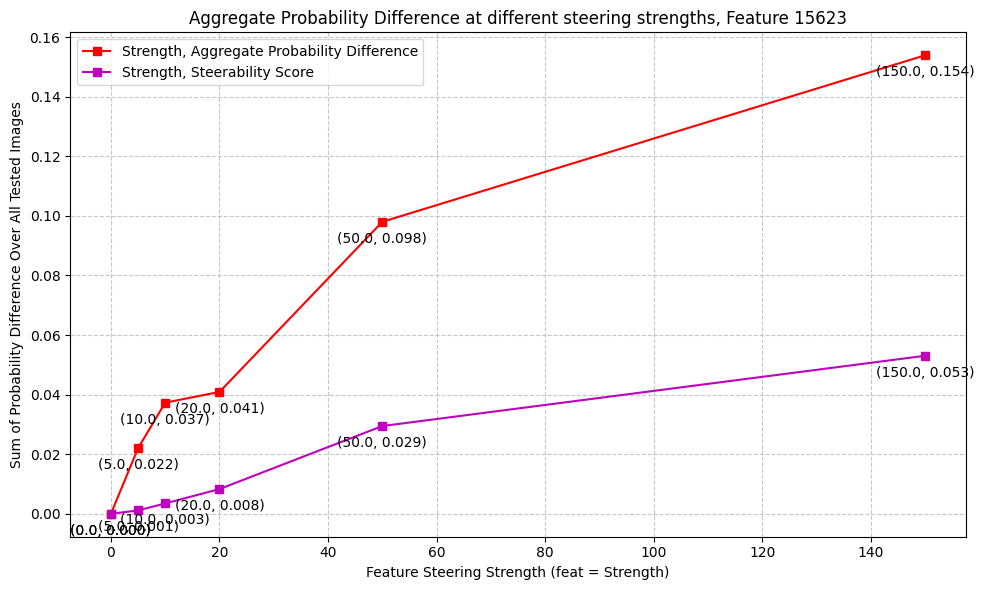

15623
150.0 ['aluminum' 'stainless' 'platinum' 'controller' 'silver' 'pp' 'gb' 'usb'
 'ps' 'iv']
150.0 probs tensor([0.1397, 0.1322, 0.0771, 0.0510, 0.0209, 0.0203, 0.0197, 0.0131, 0.0127,
        0.0122], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0237, 0.0159, 0.0063, 0.0020, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0001])
['aluminum' 'stainless' 'platinum' 'controller' 'pp' 'silver' 'gb'
 'postage' 'iv' 'usb']


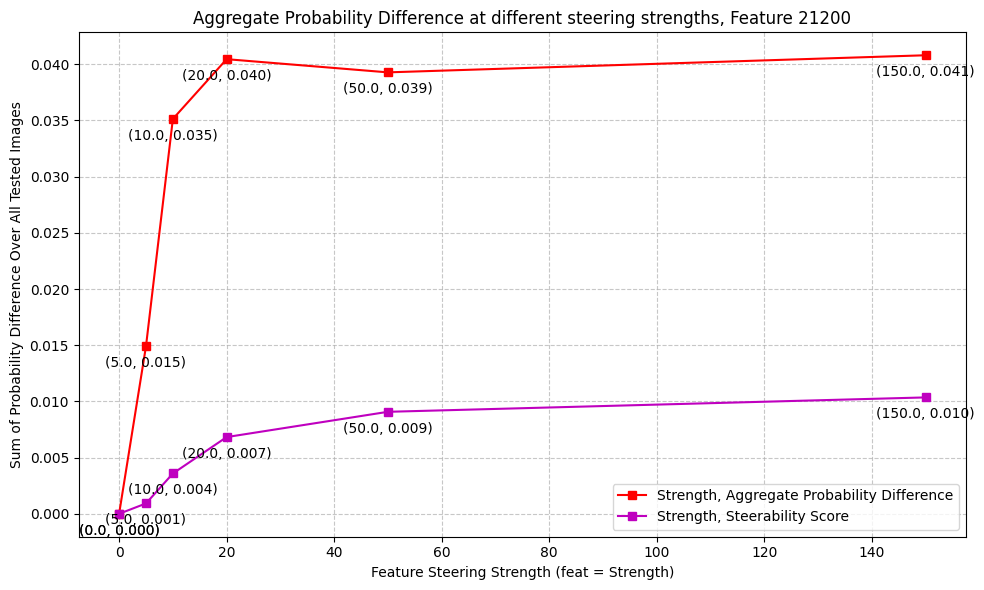

21200
150.0 ['alerts' 'auctions' 'positions' 'bands' 'references' 'auction'
 'annotation' 'listings' 'indicates' 'distance']
150.0 probs tensor([0.0326, 0.0313, 0.0231, 0.0210, 0.0206, 0.0181, 0.0180, 0.0165, 0.0150,
        0.0139], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0017, 0.0010, 0.0006, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['auctions' 'alerts' 'positions' 'references' 'auction' 'annotation'
 'listings' 'differences' 'offers' 'indicates']


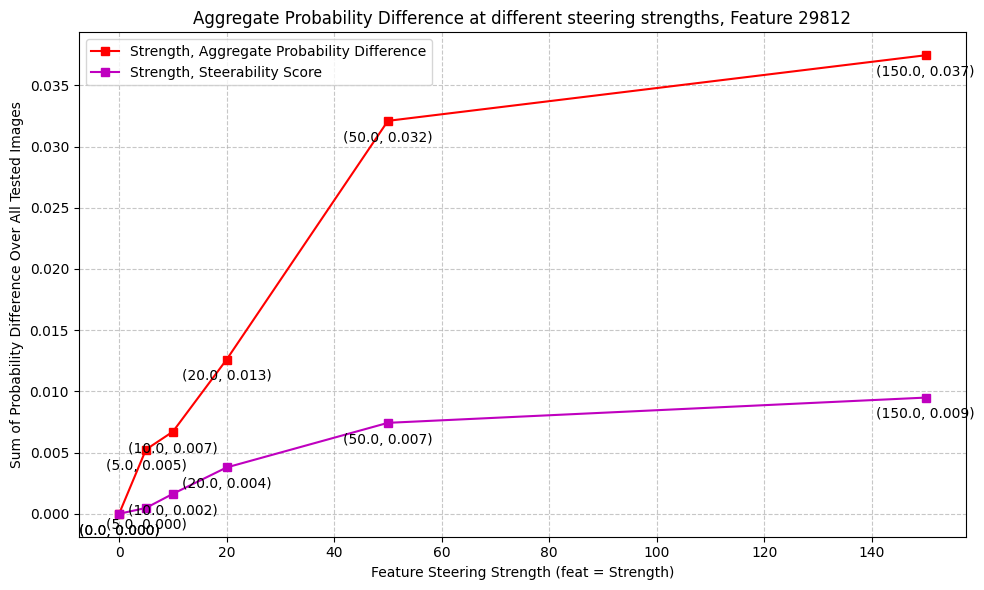

29812
150.0 ['abc' 'amazon' 'reverse' 'sony' 'microsoft' 'adobe' 'es' 'cr' 'yahoo'
 'dvd']
150.0 probs tensor([0.0431, 0.0360, 0.0246, 0.0227, 0.0184, 0.0169, 0.0159, 0.0155, 0.0145,
        0.0144], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0014, 0.0011, 0.0006, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['abc' 'amazon' 'reverse' 'sony' 'microsoft' 'adobe' 'dvd' 'cr' 'external'
 'es']


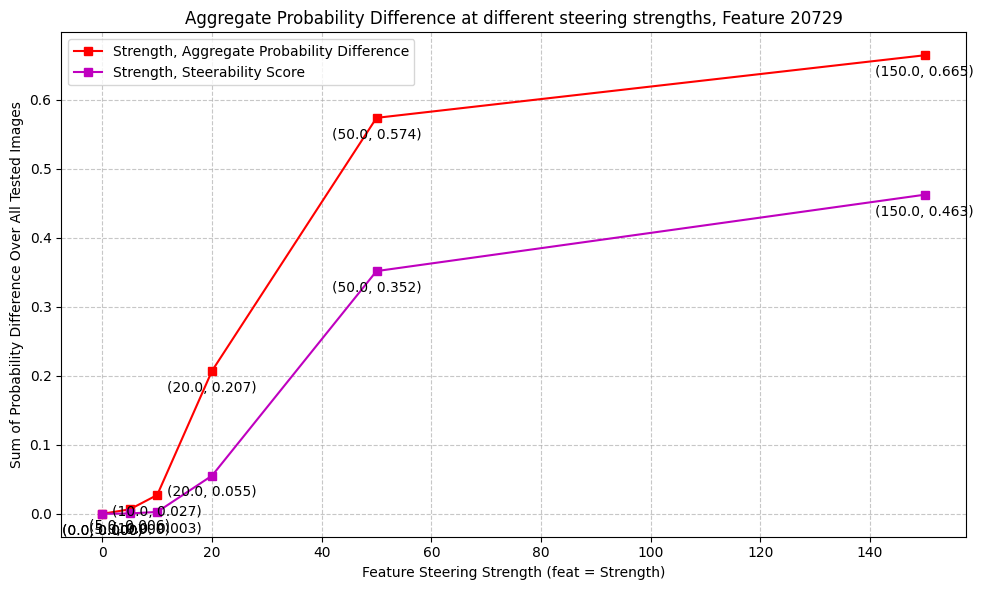

20729
150.0 ['aluminum' 'stainless' 'frames' 'steel' 'springs' 'colleges' 'steps'
 'hardcover' 'framework' 'metal']
150.0 probs tensor([0.6489, 0.1414, 0.0278, 0.0256, 0.0164, 0.0045, 0.0038, 0.0035, 0.0031,
        0.0027], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.4194e-01, 1.6274e-02, 8.0788e-04, 5.0920e-04, 1.3503e-04, 3.7750e-05,
        1.5038e-05, 8.7221e-06, 8.3405e-06, 7.5883e-06])
['aluminum' 'stainless' 'frames' 'steel' 'springs' 'colleges' 'hardcover'
 'manufacturers' 'steps' 'framework']


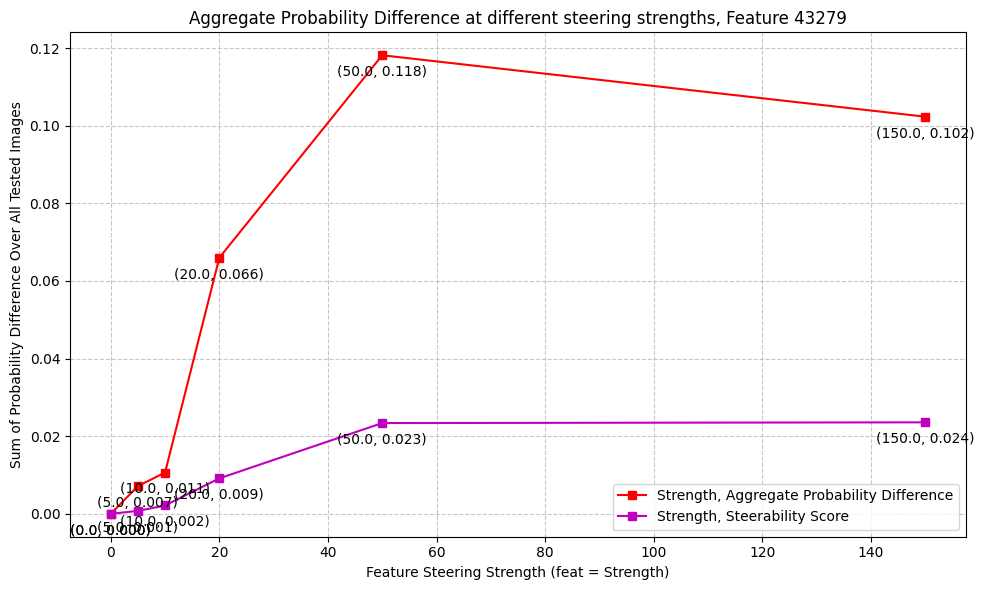

43279
150.0 ['pdas' 'belt' 'deals' 'subscription' 'deal' 'finder' 'cds' 'usd' 'ss'
 'flights']
150.0 probs tensor([0.0942, 0.0562, 0.0524, 0.0375, 0.0338, 0.0257, 0.0229, 0.0159, 0.0144,
        0.0143], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0105, 0.0034, 0.0012, 0.0009, 0.0009, 0.0008, 0.0004, 0.0003, 0.0002,
        0.0002])
['pdas' 'deals' 'subscription' 'belt' 'deal' 'finder' 'cds' 'flights'
 'discounts' 'usd']


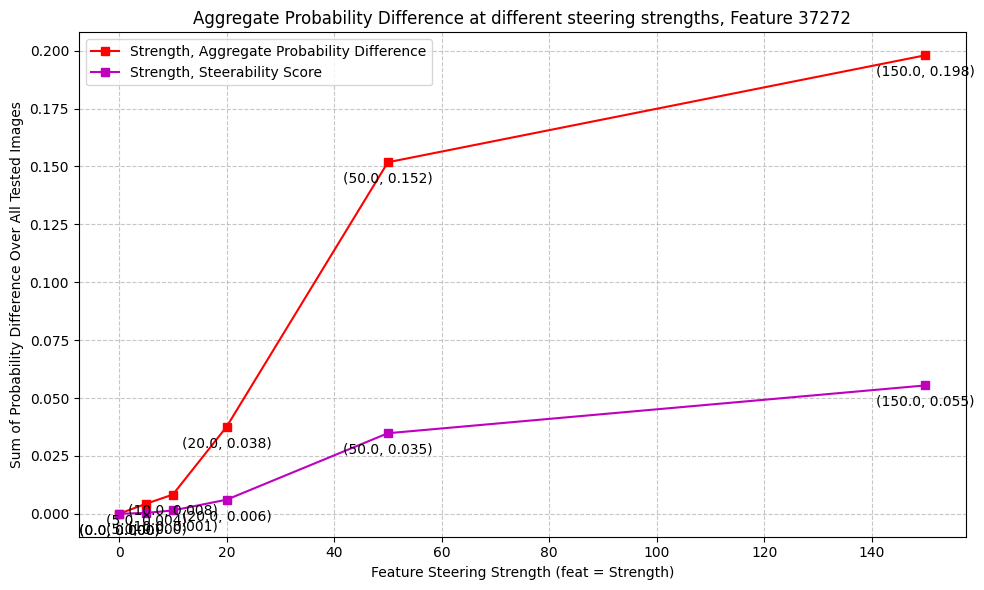

37272
150.0 ['print' 'graphic' 'type' 'prints' 'binding' 'framework' 'brand'
 'melbourne' 'net' 'logos']
150.0 probs tensor([0.1970, 0.0665, 0.0601, 0.0406, 0.0209, 0.0208, 0.0180, 0.0168, 0.0139,
        0.0139], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0392, 0.0062, 0.0029, 0.0014, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0002])
['print' 'graphic' 'type' 'prints' 'binding' 'framework' 'melbourne'
 'printable' 'brand' 'net']


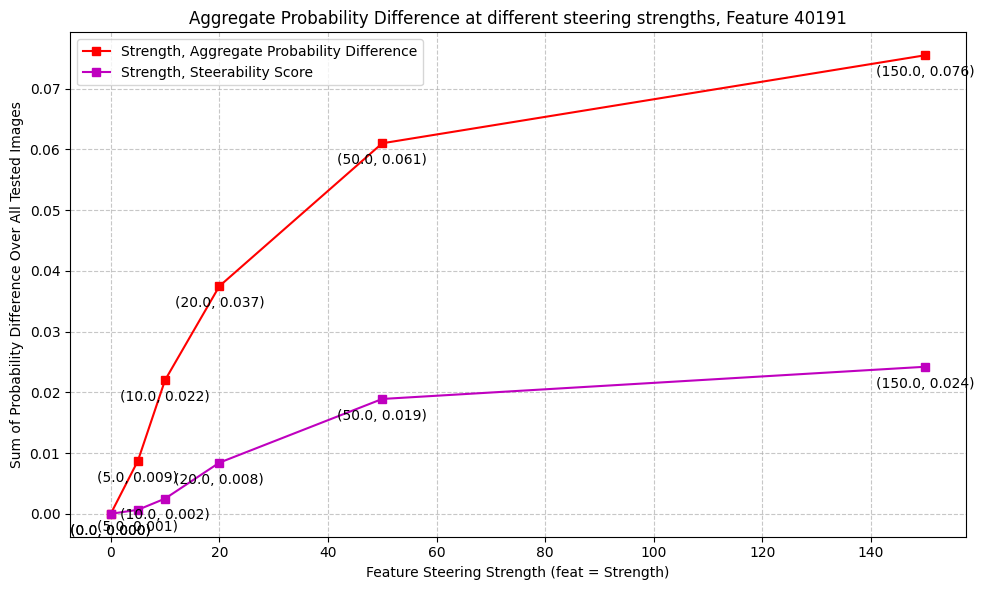

40191
150.0 ['sky' 'sheets' 'thumbnail' 'sheet' 'yellow' 'arizona' 'owner' 'vendor'
 'qty' 'size']
150.0 probs tensor([0.0791, 0.0755, 0.0557, 0.0447, 0.0383, 0.0343, 0.0213, 0.0200, 0.0138,
        0.0131], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0057, 0.0047, 0.0040, 0.0021, 0.0017, 0.0009, 0.0005, 0.0003, 0.0002,
        0.0002])
['sky' 'sheets' 'thumbnail' 'sheet' 'yellow' 'arizona' 'owner' 'vendor'
 'size' 'chart']


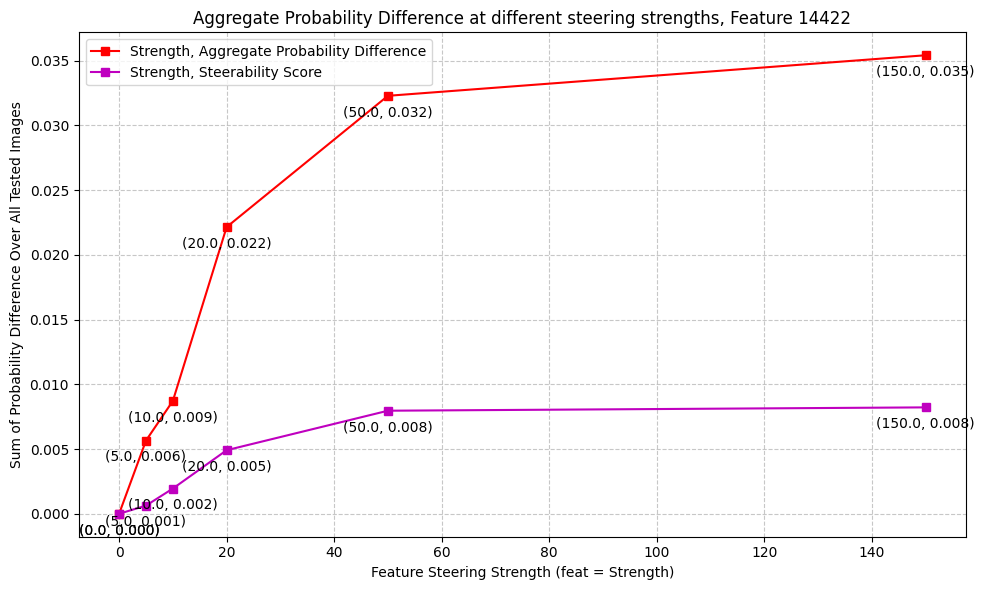

14422
150.0 ['prince' 'cisco' 'search' 'indian' 'searching' 'navigation' 'direction'
 'cds' 'keith' 'afghanistan']
150.0 probs tensor([0.0377, 0.0359, 0.0278, 0.0230, 0.0195, 0.0165, 0.0115, 0.0098, 0.0093,
        0.0088], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2544e-03, 1.1239e-03, 5.6868e-04, 4.6253e-04, 2.5274e-04, 2.4953e-04,
        1.3738e-04, 1.2379e-04, 7.1621e-05, 6.7247e-05])
['prince' 'cisco' 'indian' 'search' 'searching' 'navigation' 'afghanistan'
 'direction' 'keith' 'cds']


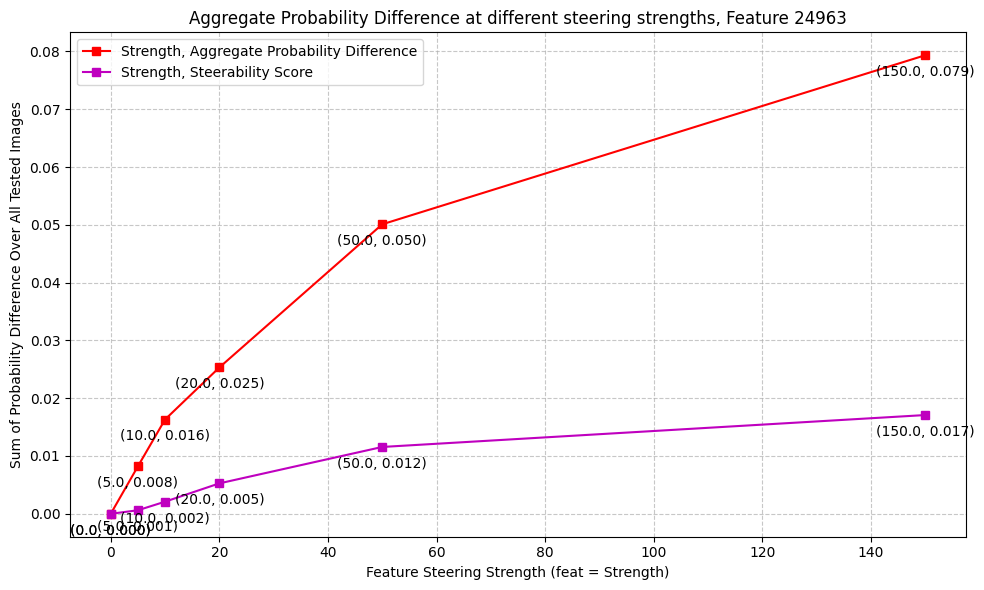

24963
150.0 ['wholesale' 'netherlands' 'product' 'printable' 'specifications'
 'england' 'printed' 'hockey' 'verzeichnis' 'label']
150.0 probs tensor([0.0681, 0.0436, 0.0340, 0.0309, 0.0295, 0.0197, 0.0180, 0.0155, 0.0152,
        0.0134], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0063, 0.0017, 0.0014, 0.0011, 0.0010, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0002])
['wholesale' 'netherlands' 'product' 'specifications' 'printable'
 'england' 'printed' 'label' 'tip' 'hockey']


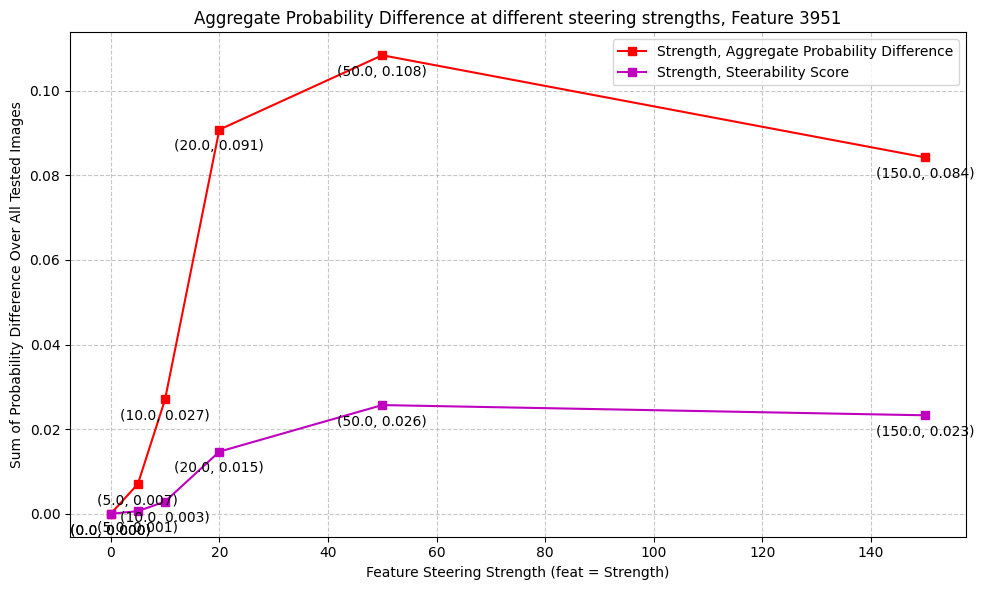

3951
150.0 ['asp' 'hp' 'ms' 'tn' 'navy' 'ky' 'ss' 'gap' 'us' 'carolina']
150.0 probs tensor([0.1080, 0.0681, 0.0630, 0.0337, 0.0263, 0.0208, 0.0200, 0.0171, 0.0108,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0071, 0.0047, 0.0043, 0.0012, 0.0004, 0.0004, 0.0003, 0.0003, 0.0001,
        0.0001])
['asp' 'ms' 'hp' 'tn' 'ky' 'navy' 'gap' 'ss' 'usc' 'washington']


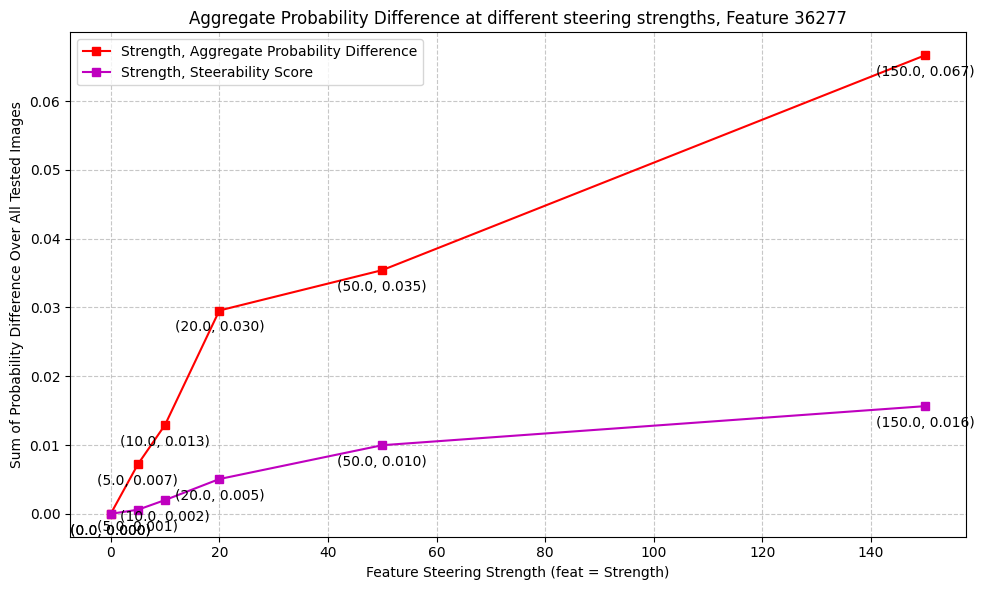

36277
150.0 ['pdf' 'icons' 'cover' 'download' 'link' 'bag' 'page' 'catalog'
 'certificate' 'book']
150.0 probs tensor([0.0703, 0.0491, 0.0280, 0.0267, 0.0243, 0.0234, 0.0214, 0.0153, 0.0153,
        0.0151], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0044, 0.0021, 0.0009, 0.0008, 0.0005, 0.0005, 0.0004, 0.0003, 0.0002,
        0.0002])
['pdf' 'icons' 'download' 'cover' 'link' 'page' 'bag' 'catalog' 'book'
 'folder']


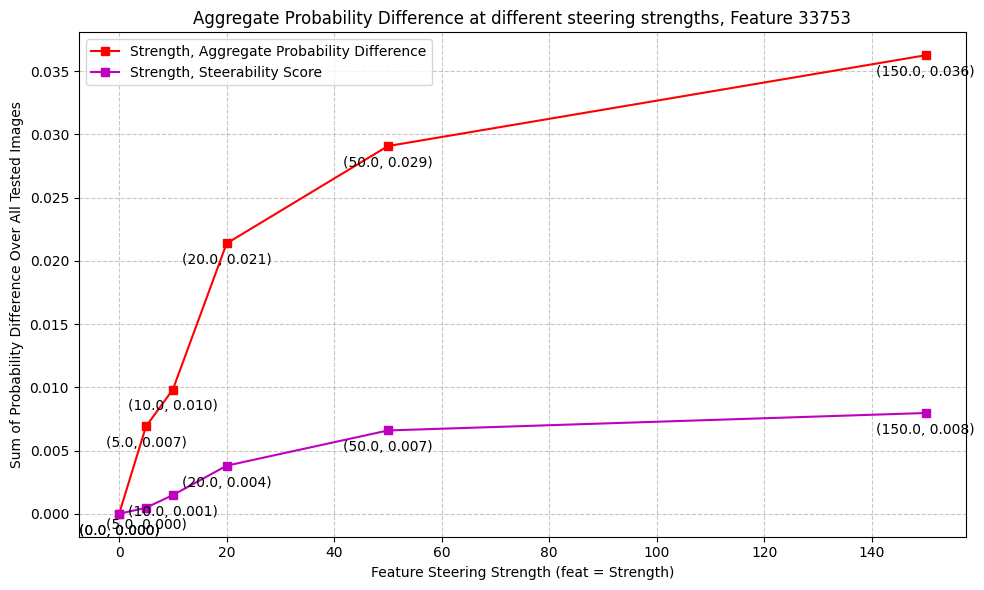

33753
150.0 ['crafts' 'marks' 'jr' 'front' 'faces' 'templates' 'sold' 'na' 'mp'
 'sealed']
150.0 probs tensor([0.0349, 0.0322, 0.0296, 0.0182, 0.0169, 0.0155, 0.0120, 0.0115, 0.0113,
        0.0098], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0013, 0.0006, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['crafts' 'jr' 'marks' 'front' 'faces' 'templates' 'na' 'mp' 'wilson'
 'sold']


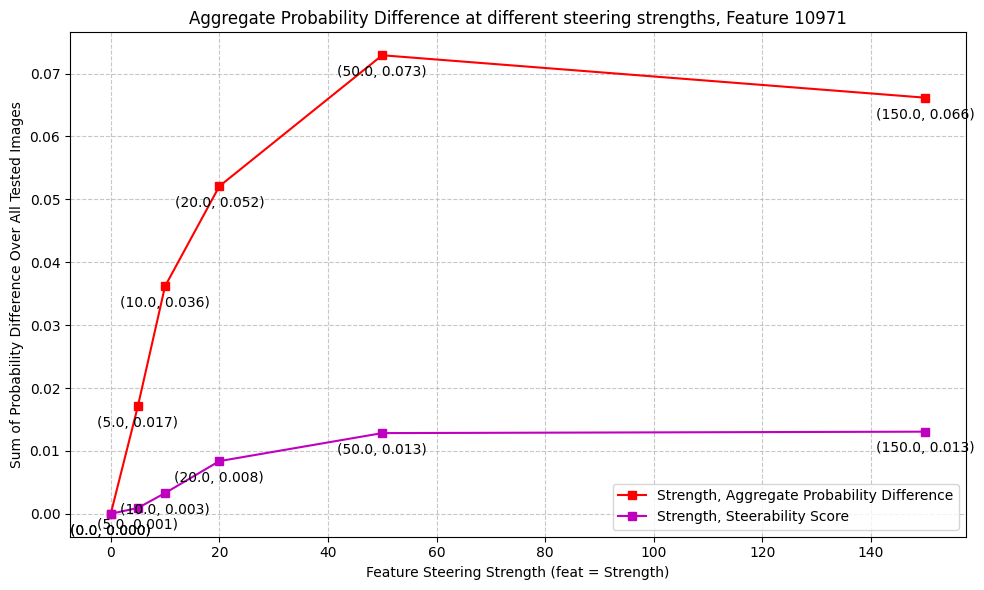

10971
150.0 ['tall' 'pair' 'thumbnail' 'steps' 'can' 'wallpaper' 'walls' 'wall'
 'header' 'type']
150.0 probs tensor([0.0526, 0.0413, 0.0376, 0.0342, 0.0237, 0.0192, 0.0169, 0.0144, 0.0137,
        0.0113], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.3783e-03, 1.7302e-03, 6.9989e-04, 6.0473e-04, 5.7111e-04, 4.6242e-04,
        2.9793e-04, 2.4078e-04, 2.0111e-04, 9.1053e-05])
['tall' 'thumbnail' 'steps' 'can' 'pair' 'wallpaper' 'walls' 'header'
 'wall' 'type']


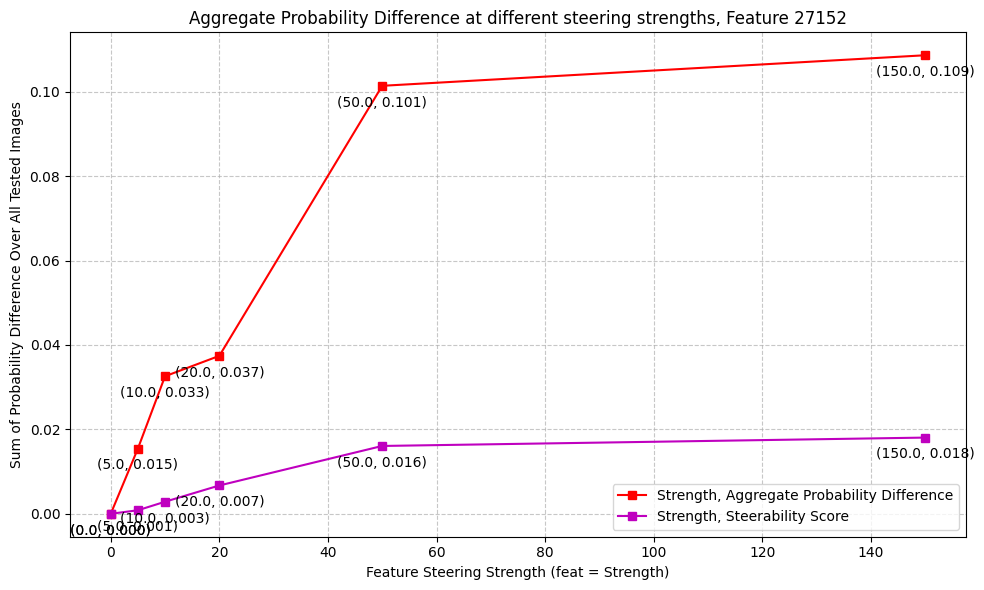

27152
150.0 ['adding' 'deck' 'seats' 'corresponding' 'thumbnail' 'dining' 'neck'
 'legs' 'pipe' 'review']
150.0 probs tensor([0.1202, 0.0264, 0.0176, 0.0171, 0.0156, 0.0146, 0.0113, 0.0112, 0.0108,
        0.0108], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1807e-02, 6.3845e-04, 3.3358e-04, 3.1476e-04, 2.4539e-04, 2.0899e-04,
        1.1253e-04, 1.0399e-04, 1.0160e-04, 9.1880e-05])
['adding' 'deck' 'dining' 'thumbnail' 'corresponding' 'seats' 'chairs'
 'neck' 'review' 'pipe']


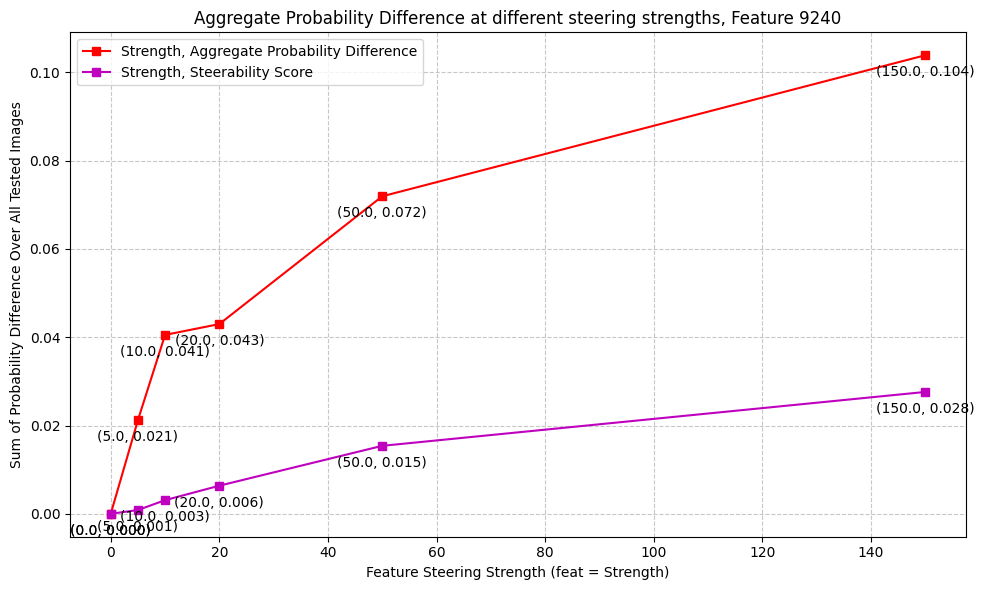

9240
150.0 ['sheets' 'football' 'beds' 'washington' 'lincoln' 'soccer' 'wallpapers'
 'scores' 'wallpaper' 'sheet']
150.0 probs tensor([0.1009, 0.0926, 0.0431, 0.0330, 0.0261, 0.0205, 0.0179, 0.0140, 0.0134,
        0.0124], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0108, 0.0084, 0.0020, 0.0009, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0001])
['football' 'sheets' 'washington' 'beds' 'lincoln' 'wallpapers' 'soccer'
 'wallpaper' 'sheet' 'scores']


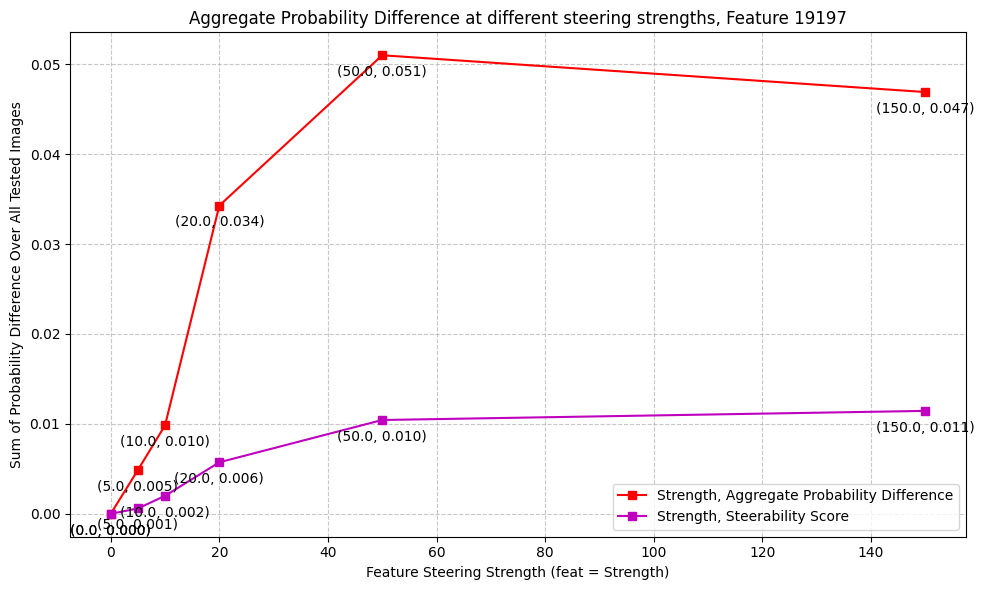

19197
150.0 ['shown' 'article' 'epson' 'tabs' 'online' 'estate' 'image' 'login'
 'write' 'website']
150.0 probs tensor([0.0428, 0.0415, 0.0287, 0.0181, 0.0174, 0.0173, 0.0161, 0.0143, 0.0142,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0022, 0.0015, 0.0008, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['shown' 'article' 'epson' 'tabs' 'estate' 'image' 'online' 'login'
 'website' 'write']


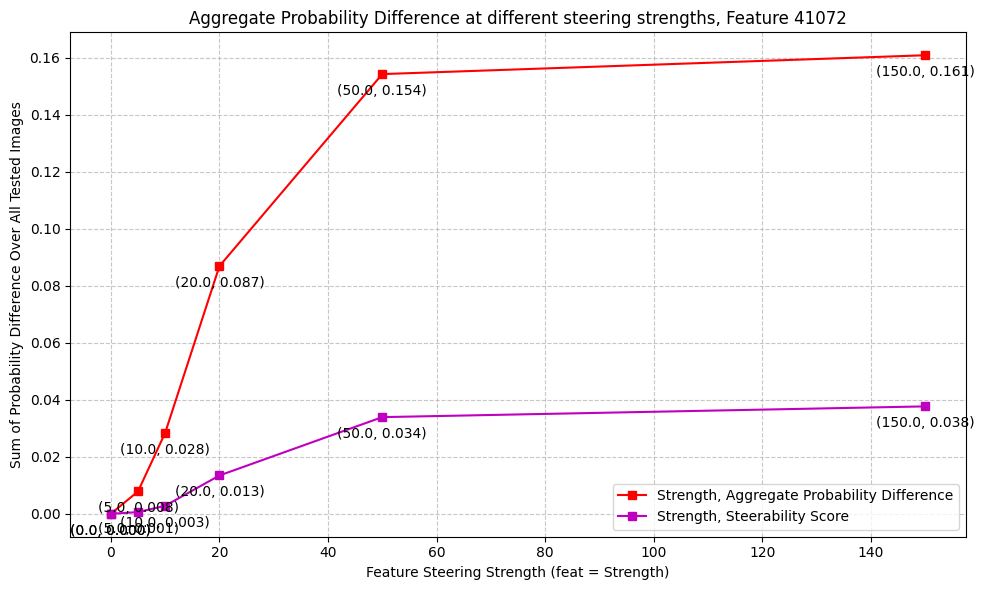

41072
150.0 ['rear' 'stations' 'configuration' 'stereo' 'verzeichnis' 'specs' 'stands'
 'nintendo' 'back' 'comparison']
150.0 probs tensor([0.1804, 0.0581, 0.0471, 0.0258, 0.0224, 0.0221, 0.0152, 0.0105, 0.0099,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0259, 0.0040, 0.0015, 0.0007, 0.0006, 0.0004, 0.0002, 0.0001, 0.0001,
        0.0001])
['rear' 'stations' 'configuration' 'stereo' 'specs' 'verzeichnis' 'stands'
 'costa' 'nintendo' 'back']


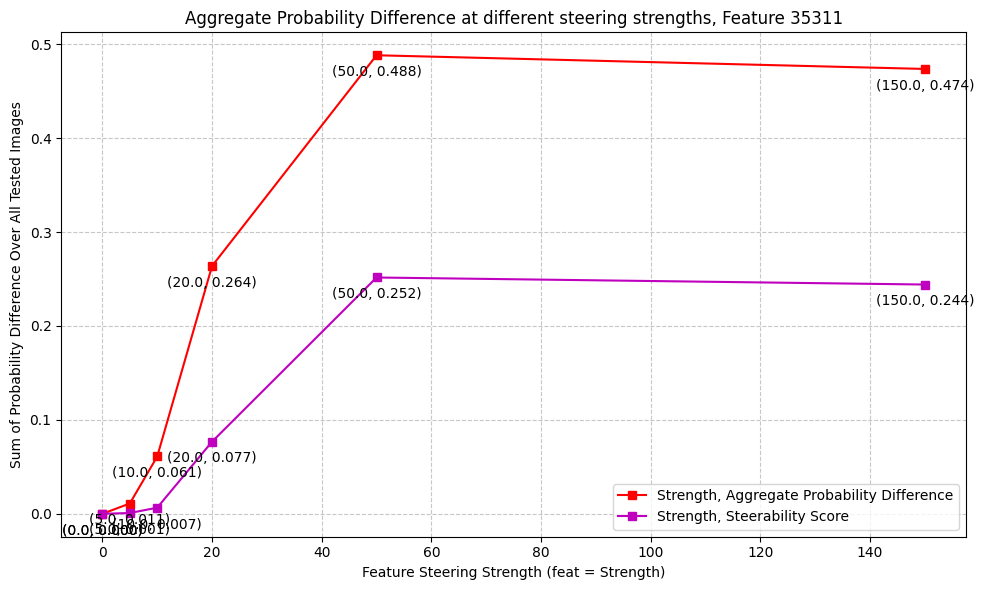

35311
150.0 ['upskirt' 'ice' 'salt' 'pants' 'floor' 'recipe' 'fat' 'quarter' 'permit'
 'felt']
150.0 probs tensor([0.4269, 0.1063, 0.0719, 0.0526, 0.0370, 0.0204, 0.0148, 0.0109, 0.0095,
        0.0093], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.2443e-01, 9.9476e-03, 3.7352e-03, 1.6298e-03, 6.4453e-04, 3.5421e-04,
        2.1810e-04, 9.9131e-05, 8.0611e-05, 6.2491e-05])
['upskirt' 'ice' 'salt' 'pants' 'floor' 'recipe' 'fat' 'quarter' 'felt'
 'recipes']


In [22]:
# Steerability metric
# print topk steerability

for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    # steering_strength_info[steering_strength] = (top_concep,top_val,aggregate_ratio,aggregate_diff)
    agg_diff_arr = []
    steerability_arr = []
    i = 0
    for key in steering_strength_info:
    #     print(key, steering_strength_info[key][4][feat_num].cpu())
        steerability_arr.append(steering_strength_info[key][4][feat_num_steerability].sum().cpu().item())
        agg_diff_arr.append(steering_strength_info[key][3][feat_num_steerability].cpu().item())
    #     agg_diff_arr.append(steering_strength_info[key][2][feat_num_steerability].cpu().item())
    #     i += 1
    #     if i > 3:
    #         agg_diff_arr[-1] = agg_diff_arr[-2]

    import matplotlib.pyplot as plt
    import numpy as np

    # Sample data
    x = [tup[0] for tup in sorted(feat_num_concept_arr)]
    y1 = agg_diff_arr
    y2 = steerability_arr

    # Create the plot
    plt.figure(figsize=(10, 6))

    # Plot each line with different colors and markers
    plt.plot(np.array(x), y1, 'rs-', label='Strength, Aggregate Probability Difference')  # Red line with squares
    plt.plot(np.array(x), y2, 'ms-', label='Strength, Steerability Score')  # Red line with squares

    # Label each point
    for i in range(len(x)):
        # Labels for series
        plt.annotate(f'({x[i]:.1f}, {y1[i]:.3f})', 
                    (x[i], y1[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')
        plt.annotate(f'({x[i]:.1f}, {y2[i]:.3f})', 
                    (x[i], y2[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')

    # Customize the plot
    plt.xlabel('Feature Steering Strength (feat = Strength)')
    plt.ylabel('Sum of Probability Difference Over All Tested Images')
    plt.title(f'Aggregate Probability Difference at different steering strengths, Feature {feat_num_steerability}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    # Adjust layout to prevent label overlap
    plt.tight_layout()


    # plt.savefig("test.svg")

    # Show the plot
    plt.show()
    # image, tuple position, idx of top-k
    print(feat_num)
    print(dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0])
    print(dict_key, "probs", steering_strength_image_results[str(dict_key)][feat_num][image_idx][1])
    print(steering_strength_info[150.0][4][feat_num_steerability].shape)
    vals, idxs = torch.topk(steering_strength_info[150.0][5][feat_num_steerability].cpu(), k=10)
    print("probabilities * abs(probabilities)", vals)
    print(np.array(selected_vocab)[idxs.cpu()])
    

feat: 7929
asymptotic_steering_specificity: 0.015988286584615707
asymptotic_steering_power: 0.0863829255104065
asymptotic_steering_power percent: 8.64%
specificity/power: 0.18508619024126022
feat: 13773
asymptotic_steering_specificity: 0.012426058761775494
asymptotic_steering_power: 0.0632384791970253
asymptotic_steering_power percent: 6.32%
specificity/power: 0.19649521809436568
feat: 47712
asymptotic_steering_specificity: 0.10086716711521149
asymptotic_steering_power: 0.2334396094083786
asymptotic_steering_power percent: 23.34%
specificity/power: 0.43209105503066
feat: 31664
asymptotic_steering_specificity: 0.3313857913017273
asymptotic_steering_power: 0.5589885115623474
asymptotic_steering_power percent: 55.90%
specificity/power: 0.5928311305996595
feat: 32193
asymptotic_steering_specificity: 0.008784061297774315
asymptotic_steering_power: 0.028561880812048912
asymptotic_steering_power percent: 2.86%
specificity/power: 0.307544918192808
feat: 4536
asymptotic_steering_specificity: 0.

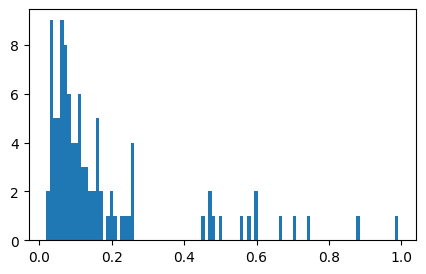

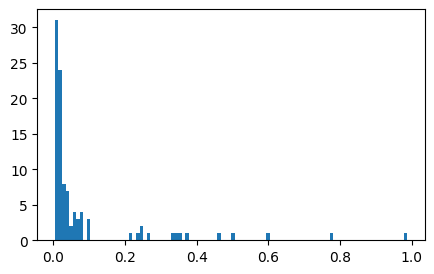

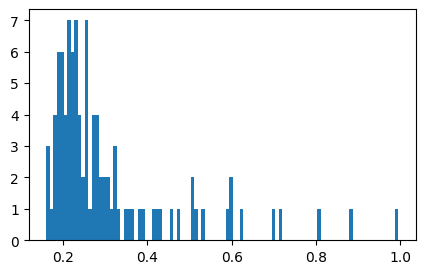

In [23]:
# SAE steering power and specificity metrics:

sae_asps = []
sae_asy_str_specs = []
sae_asrs = []
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    
    asymptote_key = max([float(key) for key in steering_strength_info.keys()])
    asymptotic_steering_specificity = steering_strength_info[asymptote_key][4][feat_num_steerability].sum().cpu().item()
    asymptotic_steering_power = steering_strength_info[asymptote_key][3][feat_num_steerability].cpu().item()
    print(f"feat: {feat_num_steerability}")
    print(f"asymptotic_steering_specificity: {asymptotic_steering_specificity}")
    print(f"asymptotic_steering_power: {asymptotic_steering_power}")
    print(f"asymptotic_steering_power percent: {(asymptotic_steering_power * 100):.2f}%")
    print(f"specificity/power: {asymptotic_steering_specificity/asymptotic_steering_power}")
    
    sae_asps.append(asymptotic_steering_power)
    sae_asy_str_specs.append(asymptotic_steering_specificity)
    sae_asrs.append(asymptotic_steering_specificity/asymptotic_steering_power)

print(f"\nSAE: {selected_sae_weights}")
print(f"\nSAE avg power: {np.array(sae_asps).mean()}")
print(f"SAE avg specificity: {np.array(sae_asy_str_specs).mean()}")
print(f"SAE avg s/p ratio: {np.array(sae_asrs).mean()}")
plt.figure(figsize=(5, 3))
plt.hist(sae_asps, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asy_str_specs, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asrs, bins=100)
plt.show()

### Prev Code

In [278]:
len(feature_steered_embeds[random_feat_idxs[0]])

32

In [279]:
default_embeds.shape
len(default_embeds_list)
default_embeds = torch.cat(default_embeds_list)
default_embeds.shape

torch.Size([32, 512])

In [280]:

len(altered_embeds_list), altered_embeds_list[0].shape, default_embeds.shape

(10, torch.Size([32, 512]), torch.Size([32, 512]))

In [281]:
og_model.cuda()

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((768,), eps=1e-05, elementwise_affine

In [282]:
with open("/workspace/clip_dissect_raw.txt", "r") as f:
    larger_vocab = [line[:-1] for line in f.readlines()][:5000]

# with open("/workspace/better_img_desc.txt", "r") as f:
#     larger_vocab = [line[:-1] for line in f.readlines()][:5000]

In [283]:
# use clip vocab here and compare embeds
import torch
from PIL import Image

tokenizer = open_clip.get_tokenizer('ViT-B-32')
text = tokenizer(larger_vocab)
text_features = og_model.encode_text(text.cuda())
text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True)


print(f"text_features_normed.shape: {text_features_normed.shape}")
text_probs_altered_list = []
with torch.no_grad(), torch.cuda.amp.autocast():
    for key in feature_steered_embeds:
        print(key)
        # embeds already have L2 norm of 1
        text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
        text_probs_altered_list.append(text_probs_altered)
    text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)

print("Label probs altered:", text_probs_altered.shape)  # prints: [[1., 0., 0.]]
print("Label probs default:", text_probs_default.shape)  # prints: [[1., 0., 0.]]

text_features_normed.shape: torch.Size([5000, 512])
655
656
665
2541
9482
21803
21701
22826
17981
10559
Label probs altered: torch.Size([32, 5000])
Label probs default: torch.Size([32, 5000])


### Summed Logit Difference

In [ ]:
# subtract from default, label, and print trends
text_probs_altered.shape

# selected_vocab = all_imagenet_class_names
selected_vocab = larger_vocab

top_concept_per_feat = {}
top_val_per_feat = {}
top_diff_per_feat = {}
top_ratio_per_feat = {}
# run this for sampled features over all of imagenet eval
for j, text_probs_altered in enumerate(text_probs_altered_list):
    print(f"{'============================================'*2}\n\nFor Feature {random_feat_idxs[j]}")
    print("actual image content:")
    default_vals_softmax, default_idxs_softmax = torch.topk(text_probs_default,k=10)
    print(default_vals_softmax, "\n", np.array(selected_vocab)[default_idxs_softmax.cpu()])
    
    
    logit_diff = text_probs_altered - text_probs_default
    logit_diff_aggregate = logit_diff.sum(dim=0)
    
    logit_ratio = text_probs_altered/text_probs_default
    logit_ratio_aggregate = logit_ratio.mean(dim=0)
    
    print(f"text_probs_altered.softmax(): {text_probs_altered.softmax(1).shape}")
    text_probs_altered_softmax = text_probs_altered.softmax(1)
    vals_softmax, idxs_softmax = torch.topk(text_probs_altered_softmax,k=10)
    
#     print(f"text_probs_altered.softmax(): {text_probs_altered.sum(0).softmax(0).shape}")
#     text_probs_altered_softmax_agg = text_probs_altered.sum(0).softmax(0)
#     vals_softmax_agg, idxs_softmax_agg = torch.topk(text_probs_altered_softmax_agg,k=10)
    
    print(f"\nSoftmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax}")
    print(np.array(selected_vocab)[idxs_softmax.cpu()])
    for i in range(vals_softmax.shape[0]):
        print(vals_softmax[i], "\n", np.array(selected_vocab)[idxs_softmax.cpu()][i])
        break
        
#     print(f"\nAgg Softmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax_agg}")
#     print(np.array(selected_vocab)[idxs_softmax_agg.cpu()])
    
    vals_agg, idxs_agg = torch.topk(logit_diff_aggregate,k=10)
    vals_least_agg, idxs_least_agg = torch.topk(logit_diff_aggregate,k=10,largest=False)
    
    ratios_agg, ratios_idxs_agg = torch.topk(logit_ratio_aggregate,k=10)
    ratios_least_agg, ratios_idxs_least_agg = torch.topk(logit_ratio_aggregate,k=10,largest=False)
    
    vals, idxs = torch.topk(logit_diff,k=5)
    vals_least, idxs_least = torch.topk(logit_diff,k=5,largest=False)
    
    ratios, ratios_idxs = torch.topk(logit_ratio,k=5)
    ratios_least, ratios_idxs_least = torch.topk(logit_ratio,k=5,largest=False)
    
    top_concept_per_feat[random_feat_idxs[j]] = np.array(selected_vocab)[idxs_softmax.cpu()][0][0]
    top_val_per_feat[random_feat_idxs[j]] = vals_softmax[0][0]
    top_diff_per_feat[random_feat_idxs[j]] = vals_agg[0]
    top_ratio_per_feat[random_feat_idxs[j]] = ratios_agg[0]
    
    
    print(f"\nMost Changed, by Absolute Diff Over {logit_diff.shape[0]} Images:\n{vals_agg}")
    print(np.array(selected_vocab)[idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[idxs_least_agg.cpu()])
    
    print(f"\nMost Changed, by Ratio Over {logit_diff.shape[0]} Images:")
    print(ratios_agg)
    print(np.array(selected_vocab)[ratios_idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[ratios_idxs_least_agg.cpu()])

In [ ]:
top_concept_per_feat,top_val_per_feat,top_ratio_per_feat

In [ ]:
steering_strength_info = {}
steering_strength_info[steering_strength] = (top_concept_per_feat,top_val_per_feat,top_ratio_per_feat,top_diff_per_feat)


In [ ]:
steering_strength_info[steering_strength][0].keys()

In [ ]:
steering_strength_info

In [ ]:
i = 0
for feat_num in steering_strength_info[steering_strength][0].keys():
    print(f"=====================\nfeat_num: {feat_num}")
    feat_num_concept_arr = []
    feat_num_prob_arr = []
    feat_num_ratio_arr = []
    for key in steering_strength_info:
        print(key, steering_strength_info[key][0][feat_num])
        feat_num_concept_arr.append((key, steering_strength_info[key][0][feat_num]))
        print(key, steering_strength_info[key][1][feat_num])
        feat_num_prob_arr.append((key, steering_strength_info[key][1][feat_num].item()))
        print(key, steering_strength_info[key][2][feat_num])
        feat_num_ratio_arr.append((key, steering_strength_info[key][2][feat_num].item()))
    i += 1
    if i > 5:
        break

In [ ]:
sorted(feat_num_concept_arr),sorted(feat_num_prob_arr),sorted(feat_num_ratio_arr),

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
# y3 = [tup[1] for tup in sorted(feat_num_ratio_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
# plt.plot(x, y1, 'bo-', label='Series 1')  # Blue line with circles
plt.plot(np.array(x), y2, 'rs-', label='Series 2')  # Red line with squares
# plt.plot(x, y3, 'gd-', label='Series 3')  # Green line with diamonds

# Label each point for all three series
for i in range(len(x)):
#     # Labels for series 1
#     plt.annotate(f'({x[i]}, {y1[i]})', 
#                 (x[i], y1[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')
    
    # Labels for series 2
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
#     # Labels for series 3
#     plt.annotate(f'({x[i]}, {y3[i]})', 
#                 (x[i], y3[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')

# Customize the plot
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_info[0.0][0][feat_num]}. Label at max steered val: {steering_strength_info[max(list(steering_strength_info.keys()))][0][feat_num]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()

# Show the plot
plt.show()

## Enc/Dec Clustering/Exploration

In [ ]:
encoder_weights_for_math = sparse_autoencoder.W_enc
decoder_weights_for_math = sparse_autoencoder.W_dec

In [ ]:
dists_from_feat_0 = encoder_weights_for_math[0] - encoder_weights_for_math

In [ ]:
dists_from_feat_0_normalized = encoder_weights_for_math[0]/encoder_weights_for_math[0].norm(p=2) - encoder_weights_for_math/encoder_weights_for_math.norm(p=2,dim=0)

In [ ]:
dists_from_feat_0.norm(p=2, dim=0).shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dists_from_feat_0.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Encoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dists_from_feat_0.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0 = decoder_weights_for_math[0]/decoder_weights_for_math[0].norm(p=2) - decoder_weights_for_math/decoder_weights_for_math.norm(p=2)
dec_dists_from_feat_0.shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dec_dists_from_feat_0.T.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Decoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dec_dists_from_feat_0.T.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0.T.norm(p=2, dim=0).shape